# Module Load

In [1]:
import h5py, math, cmath, scipy, random, os, csv, pathlib, matplotlib

from matplotlib.ticker import (MultipleLocator, FormatStrFormatter,AutoMinorLocator)
from scipy.optimize import curve_fit
from matplotlib import rcParams, rc, cm, colors
from sklearn.decomposition import PCA
from scipy.stats import skew, poisson, kurtosis 
from matplotlib.font_manager import FontProperties
from scipy.ndimage import gaussian_filter, median_filter, sobel
from scipy.interpolate import griddata
from scipy.signal.signaltools import wiener
from mpl_toolkits.mplot3d import Axes3D
from numpy import linalg as LA
from scipy.special import sph_harm, lambertw
from scipy import interpolate

import scipy.integrate as integrate
import matplotlib.tri as tri
import numpy.ma as ma
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import scipy as sci
import scipy.special as sp
import time as timeCheck

plt.style.use('classic')
%matplotlib inline
rcParams['font.family'] = 'Times New Roman'

if 0 : plt.style.use('ggplot')
if 0 : import seaborn as sns; sns.set()

rc('text', usetex=True)
rc('axes', linewidth=2)
rc('font', weight='bold')
# rcParams['text.latex.preamble'] = [r'\usepackage{sfmath} \boldmath']
rcParams = {'text.latex.preamble' : [r'\usepackage{amsmath} \boldmath']}
 
path_local = str(pathlib.Path().absolute())
print('path_local = ',path_local)

C:\Users\nickd\AppData\Local\Temp\ipykernel_18796\903236561.py:11: DeprecationWarning: Please use `wiener` from the `scipy.signal` namespace, the `scipy.signal.signaltools` namespace is deprecated.
  from scipy.signal.signaltools import wiener


path_local =  C:\Users\nickd\OneDrive\Documents\GitHub\PFURO-2023-PRIV\Code


# Electron Collision Frequency

## get_param

In [2]:
um = 10**-6 # m
nm = 10**-9 # m
ns = 10**-9 # s
ps = 10**-12 # s
fs = 10**-15 # s

mole = 6.02214076*10**23 # unitless, the Avogadro number
amu = 1.66*10**-27 # kg
angstorm = 10**-10 # m
hbar = 1.0545718*10**-34 # J*s
eV = 1.6*10**-19 # J
dyne = 10**-5 # N
massElectron = 9.10938356*10**-31 # kg
eCharge = 1.602176634*10**-19 # C
eCharge_ESU = 4.80326*10**-10 # esu
kB = 1.380649*10**-23 # J/K

lightSpeed = 299792458 # m/s
vacuumPermittivity = 8.854*10**-12 # C⋅V−1⋅m−1

wavelength_351nm = 351*nm # m
wavelength_355nm = 355*nm # m
wavelength_450nm = 450*nm # m
omega_355nm = 2*np.pi*(lightSpeed/wavelength_355nm) # 1/s
omega_450nm = 2*np.pi*(lightSpeed/wavelength_450nm) # 1/s

meV = 0.001*eV # J
mdyne = 0.001*dyne # N
massElectronReduced = massElectron/2 # kg

gcm3_to_kgm3 = 1000 # kg/m^3
kelvin_to_eV = 8.621738*10**-5 # eV 
J_to_erg = 10**7 # erg
cm3_to_m3 = 0.01**3 # m^3
J_per_mole_per_K = 1/mole/kelvin_to_eV/eV

#################
# SI units
#################
Ti = 0.025*eV # J
Te = 0.025*eV # J
Tc = 58*meV   # J
rho = 1*gcm3_to_kgm3 # kg/m^3
#####################################################################
# Engineering ToolBox, (2004). Speed of Sound in Solids and Metals
# https://www.engineeringtoolbox.com/sound-speed-solids-d_713.html
cs = 2350 # m/s
#cs = 10414.838745062643 # dw/dk
#####################################################################
Upotential = 3.5*eV # J
mPh  = (12*6+5)*amu # kg
mCH  = (12*1+1)*amu # kg
mCH2 = (12*1+2)*amu # kg
mC8H8 = mPh + mCH + mCH2
dCC = 1.53*angstorm # m
a = 2*dCC         # m
G = 4.855*mdyne/angstorm # N/m
K = 4.000*mdyne/angstorm # N/m
kBZ = 2*np.pi/a # 1/m
kmin_EAP = massElectronReduced*cs/hbar # 1/m
#E_LO1 = 72.87*meV  # 33.53*meV # J
#E_LO2 = 192.80*meV # 88.73*meV # J
E_LO1 = 33.53*meV # J
E_LO2 = 88.73*meV # J
omega_LO1 = E_LO1/hbar # 1/s
omega_LO2 = E_LO2/hbar # 1/s
varepsilon_0     = 2.5
varepsilon_infty = 1.01
kmin_EOP_absrob = np.sqrt(E_LO1*10**-3*2*massElectronReduced)/hbar # 1/m
kmin_EOP_emit1  = np.sqrt(E_LO1*2*massElectronReduced)/hbar # 1/m
kmin_EOP_emit2  = np.sqrt(E_LO2*2*massElectronReduced)/hbar # 1/m
# mass_density/total_ion_mass*Z_total [1/cm^3]
R_CH = 1.03*1000 # kg/m^3
Z_CH = 7 # no unit
A_CH = (12.011+1.008)*1.66053904e-27 # kg
n_vb_CH = Z_CH*R_CH/A_CH # [1/m^3]
Eg_CH   = 4.05*eV # [J]
n_a_CH  = 1.02*10**23*100**3 # 1/m^3
Zmax_CH = Z_CH/2

## get_nc

In [3]:
def get_nc(wavelength):
    
    # input wavelength unit : m
    # output nc unit        : 1/m^3
    
    angular_freq = 2*math.pi*(lightSpeed/wavelength)
    ne_crit = vacuumPermittivity*massElectron*angular_freq**2/eCharge**2
    return ne_crit # (1/m^3)

nc_351nm = get_nc(wavelength_351nm) # 1/m^3
nc_355nm = get_nc(wavelength_355nm) # 1/m^3
nc_450nm = get_nc(wavelength_450nm) # 1/m^3

## get_E_Fermi

In [4]:
def get_E_Fermi(ne):
    
    # https://en.wikipedia.org/wiki/Fermi_energy
    
    # ne : 1/m^3
    # massElectron : kg
    
    EF = hbar**2/(2*massElectron)*(3*np.pi**2*ne)**(2/3) # J
        
    return EF # J

E_Fermi_351nm = get_E_Fermi(ne=get_nc(wavelength_351nm))
E_Fermi_355nm = get_E_Fermi(ne=get_nc(wavelength_355nm))
E_Fermi_450nm = get_E_Fermi(ne=get_nc(wavelength_450nm))

print('E_Fermi_355nm/eV = ',"{:.3e}".format(E_Fermi_355nm/eV))
print('E_Fermi_450nm/eV = ',"{:.3e}".format(E_Fermi_450nm/eV))

E_Fermi_355nm/eV =  1.562e+00
E_Fermi_450nm/eV =  1.138e+00


## get_mu

In [5]:
def get_mu(ne,Te):
    
    #print('>>> get_mu ... ')  
    
    #To sum up, to increase the number of particles of a classical gas keeping the       volume and entropy constant, you have to change the energy of the system by a negative amount. This change in the energy (which is negative) is the chemical potential of the classical gas.
        
    # ne : 1/m^3
    # Te : J
    
    y = hbar**3*np.pi**2*ne/np.sqrt(2)/(massElectron*Te)**(3/2)
    
    a  = 15
    y0 = 1.52
    
    if y < 1 :        
        inside = 4*y/(2*np.pi**0.5-y)        
        mu = Te*np.log(inside)
        
    if (y >= 1) and (y<2.5) :
        inside1 = 4*y/(2*np.pi**0.5-y)
        inside2 = (3*y/2)**(4/3)-np.pi**2/6
        denominator1 = 1+math.exp( a*(y-y0))
        denominator2 = 1+math.exp(-a*(y-y0))        
        mu = Te*(np.log(inside1)/denominator1+np.sqrt(inside2)/denominator2)
        
    if y >= 2.5 :
        inside = (3*y/2)**(4/3)-np.pi**2/6
        print('Te', Te, 'inside', inside)
        mu = Te*np.sqrt(inside)
    
    #print('get_mu : mu = ',mu)
    #return mu/eV # eV
    return mu # J

#temp = [ T for T in np.arange(0.01,100,0.01)]
#mu = [get_mu(10**22*100**3,Te*eV)/eV for Te in temp]
#plt.plot(temp,mu)

## get_f_k

In [6]:
!which latex

'which' is not recognized as an internal or external command,
operable program or batch file.


Te 4.8000000000000006e-21 inside 3189.9823683405457
Te 4.8000000000000006e-21 inside 3189.9823683405457
Te 4.8000000000000006e-21 inside 3189.9823683405457
Te 4.8000000000000006e-21 inside 3189.9823683405457
Te 4.8000000000000006e-21 inside 3189.9823683405457
Te 4.8000000000000006e-21 inside 3189.9823683405457
Te 4.8000000000000006e-21 inside 3189.9823683405457
Te 4.8000000000000006e-21 inside 3189.9823683405457
Te 4.8000000000000006e-21 inside 3189.9823683405457
Te 4.8000000000000006e-21 inside 3189.9823683405457
Te 4.8000000000000006e-21 inside 3189.9823683405457
Te 4.8000000000000006e-21 inside 3189.9823683405457
Te 4.8000000000000006e-21 inside 3189.9823683405457
Te 4.8000000000000006e-21 inside 3189.9823683405457
Te 4.8000000000000006e-21 inside 3189.9823683405457
Te 4.8000000000000006e-21 inside 3189.9823683405457
Te 4.8000000000000006e-21 inside 3189.9823683405457
Te 4.8000000000000006e-21 inside 3189.9823683405457
Te 4.8000000000000006e-21 inside 3189.9823683405457
Te 4.8000000

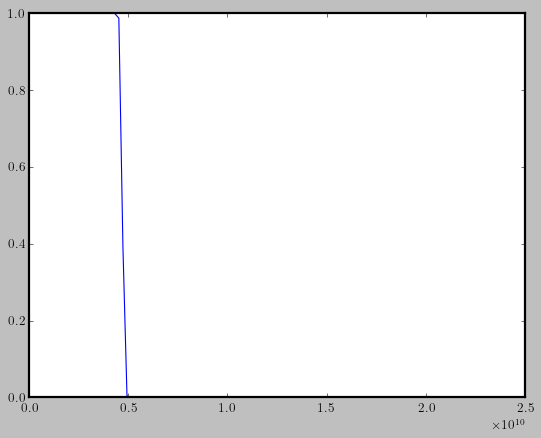

In [7]:
def get_f_k(k,Te,ne):
    
    #print('>>> get_FD_dist ... ')
    
    # Te : J
    # ne : 1/m^3
    
    E_K = (hbar*k)**2/(2*massElectronReduced) # J
    
    mu = get_mu(ne,Te) # J
    
    #print(E_K)
    
    exponent=(E_K-mu)/Te
        
    if exponent < 150 : 
        f_k = 1/(math.exp(exponent)+1) # unitless
    else : 
        f_k = 0
    
    if 0 : 
        print('exponent,f_k,Te/eV,ne,mu,E_K = ',
              "{:.3e}".format(exponent),
              "{:.3e}".format(f_k),
              "{:.3e}".format(Te/eV),
              "{:.3e}".format(ne),
              "{:.3e}".format(mu),
              "{:.3e}".format(E_K/eV))    
    
    return f_k # unitless

T = 0.03*eV
ne = 10**22*100**3
get_f_k(kmin_EAP,T,ne) 

#temp = [ T for T in np.arange(0.01,10,0.01)]
#f_k = [get_f_k(kmin_EAP,Te*eV,10**22*100**3)  for Te in temp]
#plt.plot(temp,f_k)

kvalue = [ k for k in np.arange(kmin_EAP,kBZ,(kBZ-kmin_EAP)/100)]
f_k = [get_f_k(k,T,ne)  for k in kvalue]
plt.plot(kvalue,f_k)

## get_OMEGA

omegaAO  (1/s) =  5548542.653501729
omegaLO1 (1/s) =  110564549791022.64
omegaLO2 (1/s) =  292517082890764.75


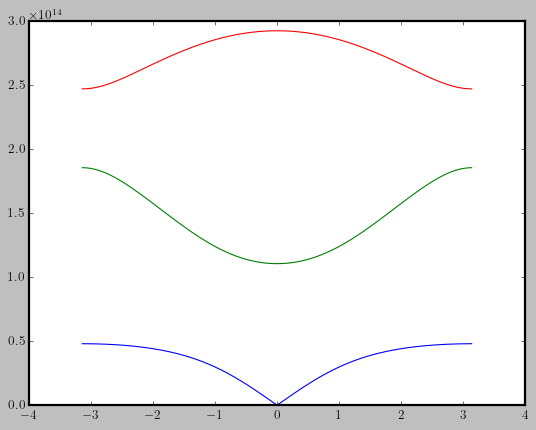

In [8]:
def get_OMEGA(ka,m):
    
    if 0 : print('>>> get_OMEGA ...')
    
    # Normal Vibrations and Their Dispersion in Syndiotactic Polystyrene
    # SHANTANU RASTOGI and V. D. GUPTA
    # J. MACKOMOL. SC1.-PHYS., B33(2), 129-141 (1994)
        
    alpha = -mPh*mCH*mCH2
    beta  = G*mCH2*(mCH+mPh)+2*K*mPh*(mCH+mCH2)
    gamma = (4*K**2*np.cos(ka/2)**2-2*K*(2*K+G))*mPh-2*G*K*(mCH+mCH2)
    delta = 4*G*K**2*(1-np.cos(ka/2)**2)
    
    p = -beta**2/(3*alpha**2)+gamma/alpha
    q = 2*beta**3/(27*alpha**3)-9*beta*gamma/(27*alpha**2)+delta/alpha
    
    argument = 1/3*np.arccos(3*q/(2*p)*np.sqrt(-3/p))+2*(m+1)*np.pi/3    
    zm = 2*np.sqrt(-p/3)*np.cos(argument)
    
    omega = np.sqrt(zm - beta/(3*alpha))
    
    #return omega*hbar/meV/2 # meV
    return omega # 1/s

omegaAO  = get_OMEGA(ka=0,m=0) # 1/s
omegaLO1 = get_OMEGA(ka=0,m=1) # 1/s
omegaLO2 = get_OMEGA(ka=0,m=2) # 1/s
    
print('omegaAO  (1/s) = ',omegaAO )
print('omegaLO1 (1/s) = ',omegaLO1)  
print('omegaLO2 (1/s) = ',omegaLO2)  

xdata    = [ ka for ka in np.arange(-np.pi,np.pi,0.01)]
ydata_m0 = [ get_OMEGA(ka=x,m=0) for x in xdata]
ydata_m1 = [ get_OMEGA(ka=x,m=1) for x in xdata]
ydata_m2 = [ get_OMEGA(ka=x,m=2) for x in xdata]

plt.plot(xdata,ydata_m0)
plt.plot(xdata,ydata_m1)
plt.plot(xdata,ydata_m2)

## get_report_omega

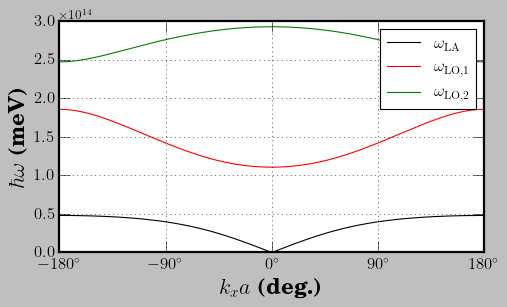

In [9]:
def get_report_omega(exportFlag):
    
    plt.close('all')
    fig = plt.figure(figsize=[6.5,4])
    fs,fs2,fs3,fs4=20,15,18,10

    label1 = r'\textbf{$\omega_{\mathrm{LA}}$}'
    label2 = r'\textbf{$\omega_{\mathrm{LO,1}}$}'
    label3 = r'\textbf{$\omega_{\mathrm{LO,2}}$}'

    nrow,ncol=1,1
    ax1 = plt.subplot2grid((nrow, ncol), (0,0), colspan=1, rowspan=1) 

    ax1.plot(xdata,ydata_m0,c='k',label=label1)
    ax1.plot(xdata,ydata_m1,c='r',label=label2)
    ax1.plot(xdata,ydata_m2,c='g',label=label3)

    ax1.tick_params(which='major',length=10,labelsize=fs2)
    ax1.set_xlabel(r'\textbf{$k_x a$ (deg.)}',fontsize=fs)
    ax1.set_ylabel(r'\textbf{$\hbar \omega$ (meV)}',fontsize=fs)
    ax1.legend(fontsize=fs2,loc='upper right',numpoints=1)
    ax1.set_xlim([-np.pi,np.pi])
    ax1.grid()
    
    plt.sca(ax1)
    plt.xticks([-np.pi,-np.pi/2,0,np.pi/2,np.pi],
               [r'$-180^\circ$',r'$-90^\circ$',r'$0^\circ$',r'$90^\circ$',r'$180^\circ$'])   

    plt.tight_layout()
    if exportFlag : 
        export_name = 'polystyrene_dispersion_relation'
        print(f'{"Save as":30}',':',export_name)
        path = '/Users/kwoo/Desktop/PostDoc/InitialPlasma/reports/plots/'
        print(f'{"path_local":30}',':',str(pathlib.Path().absolute()))    
        print(f'{"path_save":30}',':',path)
        plt.savefig(path+export_name+'.eps',format='eps')
        plt.savefig(path+export_name,dpi=500) 
    plt.show() 
              
get_report_omega(exportFlag=0)

## get_EAP_rate

In [10]:
def get_EAP_rate(k,Ti,rho):
    
    #print('>>> get_EAP_rate ...')

    # Ti : J
    # rho : kg/m^3
    
    factor_1 = Upotential**2*Ti*massElectronReduced
    factor_2 = 2*np.pi*rho*cs**2*hbar**3*k
    factor_3 = k**2 + (massElectronReduced*cs/hbar)**2
    
    return factor_1/factor_2*factor_3
    
get_EAP_rate(kmin_EAP,Ti,rho)

284991351957.0703

## get_EAP_rate_avg

Te 1.6000000000000003e-21 inside 28723.0007875997
Te 1.6000000000000003e-21 inside 28723.0007875997
Te 1.6000000000000003e-21 inside 28723.0007875997
Te 1.6000000000000003e-21 inside 28723.0007875997
Te 1.6000000000000003e-21 inside 28723.0007875997
Te 1.6000000000000003e-21 inside 28723.0007875997
Te 1.6000000000000003e-21 inside 28723.0007875997
Te 1.6000000000000003e-21 inside 28723.0007875997
Te 1.6000000000000003e-21 inside 28723.0007875997
Te 1.6000000000000003e-21 inside 28723.0007875997
Te 1.6000000000000003e-21 inside 28723.0007875997
Te 1.6000000000000003e-21 inside 28723.0007875997
Te 1.6000000000000003e-21 inside 28723.0007875997
Te 1.6000000000000003e-21 inside 28723.0007875997
Te 1.6000000000000003e-21 inside 28723.0007875997
Te 1.6000000000000003e-21 inside 28723.0007875997
Te 1.6000000000000003e-21 inside 28723.0007875997
Te 1.6000000000000003e-21 inside 28723.0007875997
Te 1.6000000000000003e-21 inside 28723.0007875997
Te 1.6000000000000003e-21 inside 28723.0007875997


IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



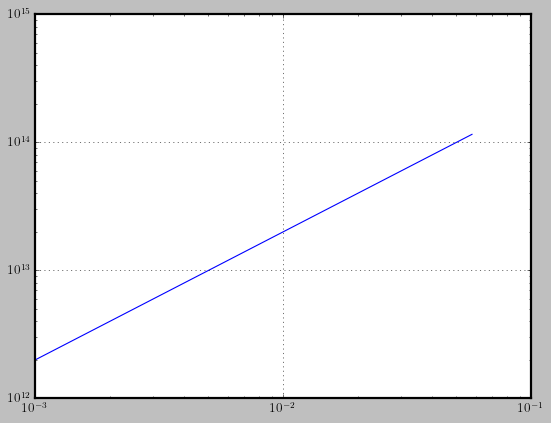

In [11]:
def get_EAP_rate_avg(Te,Ti,ne,rho):
    
    #print('>>> get_EAP_rate_avg ...')
    
    # Te : J
    # Ti : J
    # rho : kg/m^3
    # ne : 1/m^3
    
    #k = np.sqrt((3/2*Te)*2*massElectronReduced)/hbar
    
    V = (dCC*2)**3 # m^3
    
    g_k = 2*V/(8*np.pi**3) # m^3
    
    f_k = get_f_k(kmin_EAP,Te,ne)
    
    m = 2
    
    result1 = integrate.quad(lambda k: g_k * get_f_k(k,Te,ne)*k**m * \
                             get_EAP_rate(k,Ti,rho) , kmin_EAP, kBZ)[0]

    result2 = integrate.quad(lambda k: g_k * get_f_k(k,Te,ne)*k**m , kmin_EAP, kBZ)[0]
    
    residue = 10**-100
    
    EAP_rate_avg = result1/(result2+residue) # 1/s
    #EAP_rate_avg = result2 # 1/s
    
    if 0 :
        print('EAP_rate_avg = ',"{:.3e}".format(EAP_rate_avg),
              ', Te (eV) = ',"{:.3e}".format(Te/eV))    
    
    return EAP_rate_avg

    
T = 0.01*eV
ne = 10**22*100**3
get_EAP_rate_avg(T,T,ne,rho)
#get_EAP_rate_avg(Te,Ti,10**22*100**3,rho)

#temp = [ T for T in np.arange(0.01,100,0.01)]

temp      = [ T for T in np.arange(0.001,Tc/eV,0.0001)]
collFreq2 = [get_EAP_rate_avg(T*eV,T*eV,10**22*100**3,rho) for T in temp]

plt.loglog(temp,collFreq2)
plt.grid()

## get_EOP_rate

In [12]:
def get_EOP_rate(k,omega_LO,Ti,flag_emit,flag_absrob):
    
    #print('>>> get_EOP_rate ...')
    
    # omega_LO : 1/s
    # Ti : J

    factor1 = eCharge**2*massElectronReduced*omega_LO/(hbar**2*k)/(4*np.pi)
    factor2 = (1/varepsilon_infty - 1/varepsilon_0)/vacuumPermittivity    
    g_LO    = 1/(math.exp(hbar*omega_LO/Ti)-1)
    
    energy_LO  = hbar*omega_LO # J
    energy_ele = (hbar*k)**2/(2*massElectronReduced) # J
        
    if (flag_emit==1) and (flag_absrob==0) :
        inside = max(1 - energy_LO/energy_ele,0)
        ln     = np.log((1 + inside**0.5)/(1 - inside**0.5))
        rate   = factor1*factor2*(g_LO+1)*ln
        
        
    if (flag_emit==0) and (flag_absrob==1) :
        inside = 1 + energy_LO/energy_ele
        ln     = np.log((inside**0.5 + 1)/(inside**0.5 - 1))
        rate   = factor1*factor2*g_LO*ln
        
    if 0 :
        #print('factor1 = ',factor1)
        #print('factor2 = ',factor2)
        print('factor1*factor2 = ',"{:.3e}".format(factor1*factor2))
        print('g_LO = ',g_LO)
        #print('hbar*omega_LO/eV = ',hbar*omega_LO/eV)
        #print('energy_LO/eV = ',"{:.3e}".format(energy_LO/eV))
        #print('energy_ele/eV = ',"{:.3e}".format(energy_ele/eV))    
        #print('Ti/eV = ',Ti/eV)
        print('inside = ',"{:.3e}".format(inside))
        print('energy_LO/energy_ele = ',"{:.3e}".format(energy_LO/energy_ele))  
        print('ln = ',"{:.3e}".format(ln)) 
        print('rate = ',"{:.3e}".format(rate))     
        print()
            
    return rate # 1/s

T = 0.02*eV

EOP_emit1 = get_EOP_rate(kmin_EOP_emit1,omega_LO1,Ti,1,0)
EOP_emit2 = get_EOP_rate(kmin_EOP_emit2,omega_LO2,Ti,1,0)

#EOP_absrob1 = get_EOP_rate(kmin_EOP_absrob,omega_LO1,Ti,0,1)
#EOP_absrob2 = get_EOP_rate(kmin_EOP_absrob,omega_LO2,Ti,0,1)

#print(get_EOP_rate_avg(T*eV,T*eV,1*10**22*100**3,rho))

## get_EOP_rate_avg

In [13]:
def get_EOP_rate_avg(Te,Ti,ne,rho):
    
    #print('>>> get_EAP_rate_avg ...')
    
    # Te : J
    # Ti : J
    # rho : kg/m^3
    # ne : 1/m^3
    
    V = (dCC*2)**3 # m^3
    
    g_k = 2*V/(8*np.pi**3) # m^3
    
    m = 2
    
    result1 = integrate.quad(lambda k: g_k * get_f_k(k,Te,ne)*k**m * \
                             get_EOP_rate(k,omega_LO1,Ti,1,0) ,    kmin_EOP_emit1, kBZ)
    result2 = integrate.quad(lambda k: g_k * get_f_k(k,Te,ne)*k**m,kmin_EOP_emit1, kBZ)
    
    result3 = integrate.quad(lambda k: g_k * get_f_k(k,Te,ne)*k**m * \
                             get_EOP_rate(k,omega_LO2,Ti,1,0) ,    kmin_EOP_emit2, kBZ)
    result4 = integrate.quad(lambda k: g_k * get_f_k(k,Te,ne)*k**m,kmin_EOP_emit2, kBZ)
    
    result5 = integrate.quad(lambda k: g_k * get_f_k(k,Te,ne)*k**m * \
                             get_EOP_rate(k,omega_LO1,Ti,0,1) ,    kmin_EOP_absrob, kBZ)
    result6 = integrate.quad(lambda k: g_k * get_f_k(k,Te,ne)*k**m,kmin_EOP_absrob, kBZ)
    
    result7 = integrate.quad(lambda k: g_k * get_f_k(k,Te,ne)*k**m * \
                             get_EOP_rate(k,omega_LO2,Ti,0,1) ,    kmin_EOP_absrob, kBZ)
    result8 = integrate.quad(lambda k: g_k * get_f_k(k,Te,ne)*k**m,kmin_EOP_absrob, kBZ)
    
    residue = 10**-100
    
    EOP_rate_emit1 = result1[0]/(result2[0]+residue)
    EOP_rate_emit2 = result3[0]/(result4[0]+residue)
    EOP_rate_absorb1 = result5[0]/(result6[0]+residue)
    EOP_rate_absorb2 = result7[0]/(result8[0]+residue)   
    
    EOP_rate = EOP_rate_emit1*1   + \
               EOP_rate_emit2*1   + \
               EOP_rate_absorb1*1 + \
               EOP_rate_absorb2*1
    
    if 0 : 
        print('EOP_rate_emit1   = ',"{:.3e}".format(EOP_rate_emit1))
        print('EOP_rate_emit2   = ',"{:.3e}".format(EOP_rate_emit2))
        print('EOP_rate_absorb1 = ',"{:.3e}".format(EOP_rate_absorb1))    
        print('EOP_rate_absorb2 = ',"{:.3e}".format(EOP_rate_absorb2))
        
        print('result2[0] = ',"{:.3e}".format(result2[0]))        
        print('result4[0] = ',"{:.3e}".format(result4[0])) 
        print('result6[0] = ',"{:.3e}".format(result6[0]))                
    
    return EOP_rate
    
T = 0.058    
EAP_1 = get_EAP_rate_avg(T*eV,T*eV,1*10**22*100**3,rho)
EOP_1 = get_EOP_rate_avg(T*eV,T*eV,1*10**22*100**3,rho)

print(EAP_1,EOP_1,EOP_1/EAP_1)

if 0 : 
    temp0     = np.array([ T for T in np.arange(0.001,Tc/eV,0.0001)])
    collFreq2 = np.array([ get_EAP_rate_avg(T*eV,T*eV,3*10**22*100**3,rho) for T in temp0 ])
    collFreq3 = np.array([ get_EOP_rate_avg(T*eV,T*eV,3*10**22*100**3,rho) for T in temp0 ])

    plt.loglog(temp0,collFreq2)
    plt.loglog(temp0,collFreq3)
    plt.grid()

Te 9.280000000000002e-21 inside 852.2387080754394
Te 9.280000000000002e-21 inside 852.2387080754394
Te 9.280000000000002e-21 inside 852.2387080754394
Te 9.280000000000002e-21 inside 852.2387080754394
Te 9.280000000000002e-21 inside 852.2387080754394
Te 9.280000000000002e-21 inside 852.2387080754394
Te 9.280000000000002e-21 inside 852.2387080754394
Te 9.280000000000002e-21 inside 852.2387080754394
Te 9.280000000000002e-21 inside 852.2387080754394
Te 9.280000000000002e-21 inside 852.2387080754394
Te 9.280000000000002e-21 inside 852.2387080754394
Te 9.280000000000002e-21 inside 852.2387080754394
Te 9.280000000000002e-21 inside 852.2387080754394
Te 9.280000000000002e-21 inside 852.2387080754394
Te 9.280000000000002e-21 inside 852.2387080754394
Te 9.280000000000002e-21 inside 852.2387080754394
Te 9.280000000000002e-21 inside 852.2387080754394
Te 9.280000000000002e-21 inside 852.2387080754394
Te 9.280000000000002e-21 inside 852.2387080754394
Te 9.280000000000002e-21 inside 852.2387080754394


## get_lambda_DH

In [14]:
def get_lambda_DH(Te,Ti,ne,ni):
        
    # Te : J
    # Ti : J  
    # ne : 1/m^3
    # ni : 1/m^3
    
    E_Fermi = get_E_Fermi(ne) # J    
    T_Fermi = E_Fermi*2/3     # J
    
    Te_erg = Te*J_to_erg      # erg
    Ti_erg = Ti*J_to_erg      # erg
    Tf_erg = T_Fermi*J_to_erg # erg
    
    ne_gcc = ne/gcm3_to_kgm3  # g/cm^3
    ni_gcc = ni/gcm3_to_kgm3  # g/cm^3
        
    part1 = 4*np.pi*ne_gcc*eCharge_ESU**2/np.sqrt(Te_erg**2+Tf_erg**2)
    part2 = 4*np.pi*ni_gcc*eCharge_ESU**2*Z_CH**2/Ti_erg
    
    lambda_DH_cm = (part1 + part2)**(-1/2)     # cm
    lambda_DH    = (part1 + part2)**(-1/2)/100 # m    
    
    if 0 : 
        print(' >>> get_lambda_DH ... ')    
        print('E_Fermi/eV = ',"{:.3e}".format(E_Fermi/eV))
        print('T_Fermi/eV = ',"{:.3e}".format(T_Fermi/eV))    
        print('part1 = ',"{:.3e}".format(part1))
        print('part2 = ',"{:.3e}".format(part2))    
        print('lambda_DH (m) = ',"{:.3e}".format(lambda_DH)) 
    
    return lambda_DH # m
    
get_lambda_DH(Te,Ti,10**22*100**3,n_a_CH)    

1.6614268764957574e-14

## get_R_cloest

In [15]:
def get_R_cloest(Te,Ti,ne,ni):
    
    lambda_DH = get_lambda_DH(Te,Ti,ne,ni) # m
    
    w = lambertw(2*Z_CH*eCharge**2/(lambda_DH*Te)) # unitless
    
    R_cloest = lambda_DH*np.real(w) # m
    
    if 0 :
        print('>>> get_R_cloest ... ')    
        print('lambda_DH (m) = ',lambda_DH)
        print('w, np.real(w) = ',w,np.real(w))
        print('R_cloest  (m) = ',R_cloest)
    
    return R_cloest # m
    
get_R_cloest(Te,Ti,10**22*100**3,n_a_CH)    

8.936200869780325e-17

## get_R_Broglie

In [16]:
def get_R_Broglie(Te):    
    
    R_Broglie = hbar*(2*np.pi)/np.sqrt(massElectron*Te) # m
    
    if 0 : 
        print(' >>> get_R_Broglie ... ')    
        print('R_Broglie = ',R_Broglie)
    
    return R_Broglie # m
    
get_R_Broglie(Te)    

1.0976946109186968e-08

## get_theta

In [17]:
def get_theta(b,bmax,Te,Ti,ne,ni):
    
    print(' >>> get_theta ... ')
    
    lambda_DH = get_lambda_DH(Te,Ti,ne,ni)
    
    R_cloest = get_R_cloest(Te,Ti,ne,ni)
    
    theta = integrate.quad(lambda r:r**(-2)*(1-2/Te*Z_CH*eCharge**2/r*math.exp(-r/lambda_DH)-(b/r)**2)**(-1/2),R_cloest,bmax) 
    
    print(theta)
    
#get_theta(0,1.9964727358293832e-10,Te,Ti,10**22*100**3,n_a_CH)   

## get_Coulomb_Log

In [18]:
def get_Coulomb_Log(Te,Ti,ne,ni):
         
    R_cloest = get_R_cloest(Te,Ti,ne,ni)
    
    R_Broglie = get_R_Broglie(Te)
    
    lambda_DH = get_lambda_DH(Te,Ti,ne,ni)
    
    ai = (3/(4*np.pi*ni))**(1/3) # m
    
    bmin = 0.5 * max(R_cloest, R_Broglie) # m
        
    bmax = np.sqrt(lambda_DH**2+ai**2) # m
    
    Coulomb_Log = max(1/2*np.log(1+bmax**2/bmin**2),1)
        
    if 0 : 
        print('>>> get_Coulomb_Log ... ')        
        print('R_cloest  (m) = ',R_cloest)
        print('R_Broglie (m) = ',R_Broglie)
        print('bmin (m)      = ',bmin) 
        print('lambda_DH (m) = ',lambda_DH)
        print('ai (m)        = ',ai) 
        print('bmax (m)      = ',bmax)
        print('Coulomb_Log   = ',Coulomb_Log)
        
    return Coulomb_Log
    
get_Coulomb_Log(Te,Ti,10**22*100**3,n_a_CH)     

1

## get_Zeff

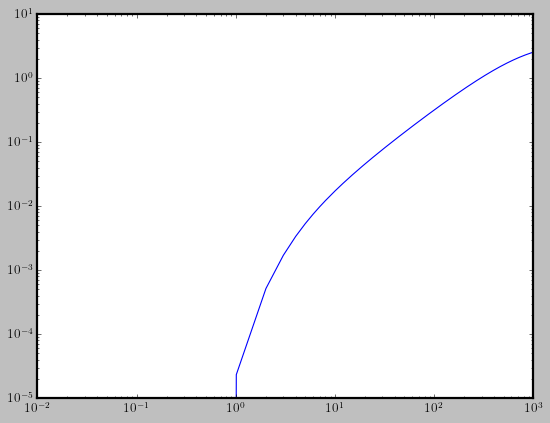

In [19]:
def get_Zeff(ni,Te):
    
    # ni : 1/m^3
    # T : J
    
    # Phys. Plasmas 23, 042704 (2016); https://doi.org/10.1063/1.4945753
    # ni is the ion density
    
    T = Te/eV # eV
    
    a0 = 87.222
    a1 = 10.866
    a2 = -28.412
    a3 = 17.915
    a4 = -2.422
    a5 = 0.595
    a6 = -2.369*10**-2
    
    ai = (3/(4*np.pi*ni))**(1/3) # m
    
    Bohr_radius = 4*np.pi*vacuumPermittivity*hbar**2/(massElectron*eCharge**2) # m
    
    r0 = ai/Bohr_radius # no unit
    
    gamma0 = 1/(r0*T) # 1/eV
    
    fz = a1 + a2*T*((1+np.sqrt(3*gamma0))**(1/4)-1) + a3*T**0.9 + \
        (a4/r0 + a5/r0**2 + a6/r0**3)*T
    
    h = hbar*2*np.pi # J/K
    
    DB_wavelength = h/np.sqrt(massElectron*Te) # m
    
    RHS = a0/(ni*DB_wavelength**3)*math.exp(-fz/T)
    
    coeff = [1,RHS,-RHS]
    sol   = np.roots(coeff) 
    
    xi = max(sol)
    xi_Jack = (-RHS+np.sqrt(RHS**2+4*RHS))/2
    
    Zeff = xi*Zmax_CH
    
    if 0 : 
        print('>>> get_Zeff ...')
        print('Bohr_radius (m) = ',Bohr_radius)
        print('ai (m) = ',ai)
        print('a0 = ',a0)  
        print('gamma0 = ',gamma0)      
        print('fz = ',fz)
        print('xi = ',xi)
        print('xi_jack = ',xi_Jack)
        print('Zeff = ',Zeff)
        print('DB_wavelength (m) = ',DB_wavelength)  
        print('ni*DB_wavelength**3 = ',ni*DB_wavelength**3)
        print('a0/(ni*DB_wavelength**3) = ',a0/(ni*DB_wavelength**3))
        print('math.exp(-fz/T) = ',math.exp(-fz/T))
        print('sol = ',sol)
        
    return Zeff
    
get_Zeff(n_a_CH,1000*eV)  

xdata = [ne for ne in np.arange(0.01,1000,1)]
ydata = [get_Zeff(n_a_CH,T*eV)for T in xdata ]
plt.loglog(xdata,ydata)

## get_vc_neutral

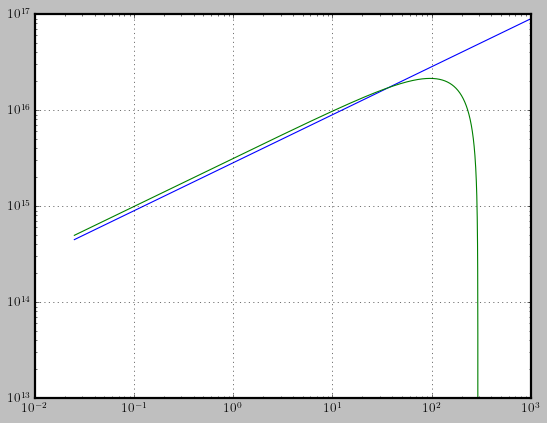

In [20]:
def get_vc_neutral(Te,ni,ne,mode):
    
    sigma = np.pi*(dCC)**2 # m^2
    
    if mode == 0 : 
        n0 = ni - ne
        
    if mode == 1 :     
        Z_eff = get_Zeff(ni,Te)
        ne_eff = ni*Z_eff
        n0 = ni - min(ne_eff,ni)
    
    vc_neutral = n0*sigma*np.sqrt(Te/massElectron) # 1/s
    
    if 0 : 
        print('>>> get_vc_neutral ... ')
        print('vc_neutral = ',"{:.3e}".format(vc_neutral))
    
    return vc_neutral
    
#get_vc_neutral(1*eV,n_a_CH,0.025*eV,0.) 

temp4 = [ T for T in np.arange(0.025,1000,1)]
collFreq4_mode0 = [get_vc_neutral(T*eV,n_a_CH,1*10**22*100**3,0) for T in temp4]
collFreq4_mode1 = [get_vc_neutral(T*eV,n_a_CH,1*10**22*100**3,1) for T in temp4]

plt.loglog(temp4,collFreq4_mode0)
plt.loglog(temp4,collFreq4_mode1)
plt.grid()

## get_FD_integral (testing purposes)

In [21]:
def get_FD_integral(x):
        
    FD_integral = integrate.quad(lambda t:t**0.5/(1+math.exp(t-x)),0,100)[0]
    
    if 0 : 
        print(' >>> get_FD_integral ... ')
        print(' FD_integral ',FD_integral)
    
    return FD_integral
    
x = 1
get_FD_integral(x)    

1.396375280666549

## get_vc_ion

INSIDE get_vc_ion
ne 300000000000000000000000000 Te 1.6000000000000003e-21
Te 1.6000000000000003e-21 inside 266.117524658264
INSIDE get_vc_ion
ne 300000000000000000000000000 Te 1.6160000000000002e-19
INSIDE get_vc_ion
ne 300000000000000000000000000 Te 3.216e-19
INSIDE get_vc_ion
ne 300000000000000000000000000 Te 4.816e-19
INSIDE get_vc_ion
ne 300000000000000000000000000 Te 6.416e-19
INSIDE get_vc_ion
ne 300000000000000000000000000 Te 8.016e-19
INSIDE get_vc_ion
ne 300000000000000000000000000 Te 9.616000000000001e-19
INSIDE get_vc_ion
ne 300000000000000000000000000 Te 1.1216e-18
INSIDE get_vc_ion
ne 300000000000000000000000000 Te 1.2816000000000002e-18
INSIDE get_vc_ion
ne 300000000000000000000000000 Te 1.4416e-18
INSIDE get_vc_ion
ne 300000000000000000000000000 Te 1.6016000000000002e-18
INSIDE get_vc_ion
ne 300000000000000000000000000 Te 1.7616000000000003e-18
INSIDE get_vc_ion
ne 300000000000000000000000000 Te 1.9216000000000002e-18
INSIDE get_vc_ion
ne 300000000000000000000000000 Te 

INSIDE get_vc_ion
ne 300000000000000000000000000 Te 1.4800160000000002e-16
INSIDE get_vc_ion
ne 300000000000000000000000000 Te 1.481616e-16
INSIDE get_vc_ion
ne 300000000000000000000000000 Te 1.4832160000000002e-16
INSIDE get_vc_ion
ne 300000000000000000000000000 Te 1.484816e-16
INSIDE get_vc_ion
ne 300000000000000000000000000 Te 1.4864160000000002e-16
INSIDE get_vc_ion
ne 300000000000000000000000000 Te 1.488016e-16
INSIDE get_vc_ion
ne 300000000000000000000000000 Te 1.4896160000000002e-16
INSIDE get_vc_ion
ne 300000000000000000000000000 Te 1.491216e-16
INSIDE get_vc_ion
ne 300000000000000000000000000 Te 1.4928160000000001e-16
INSIDE get_vc_ion
ne 300000000000000000000000000 Te 1.494416e-16
INSIDE get_vc_ion
ne 300000000000000000000000000 Te 1.4960160000000001e-16
INSIDE get_vc_ion
ne 300000000000000000000000000 Te 1.4976160000000002e-16
INSIDE get_vc_ion
ne 300000000000000000000000000 Te 1.499216e-16
INSIDE get_vc_ion
ne 300000000000000000000000000 Te 1.5008160000000002e-16
INSIDE get

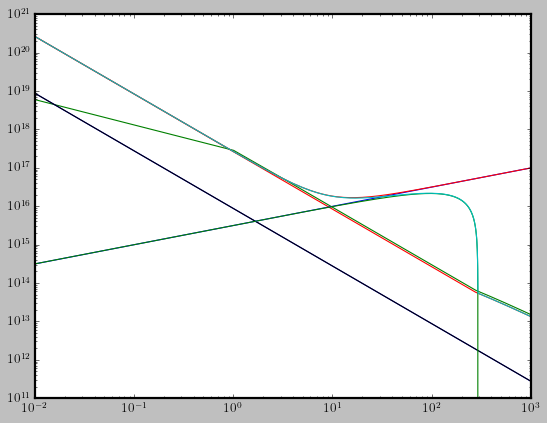

In [22]:
def get_vc_ion(Te,Ti,ne,ni,degeneracy):
    
    Z_eff = ni/ne
    
    #Z_eff = get_Zeff(ni,Te)
    
    ne_gcc = ne/100**3 # g/cm^3
    
    me_cgs = massElectron*1000 # g
    
    Te_erg = Te*J_to_erg # erg
    
    Te_eV = Te/eV # eV
    
    Coulomb_Log = get_Coulomb_Log(Te,Ti,ne,ni) # unitless
    
    print("INSIDE get_vc_ion")
#     print("ne", ne,"Te", Te)
    print('ne', ne, 'Te', Te)

    
    mu = get_mu(ne,Te) # J
    
    x = mu/Te # unitless
    
    FD_integral = get_FD_integral(x)+10**(-150)
    
    part1 = 2*np.sqrt(2)*np.pi/3
    
    part2 = Z_eff*eCharge_ESU**4*ne_gcc/np.sqrt(me_cgs)/Te_erg**1.5
    
    part3 = 1/(1+math.exp(-x))/FD_integral
    
    vc_ion = part1*part2*Coulomb_Log*part3**degeneracy
            
    Zlnlambda = 10
    # Ref[NRL : all quantities in CGS except Te in eV]
    vei_NRL = 2.91*10**-6*ne_gcc*Zlnlambda/(Te_eV**1.5) # 1/s with unit [Te] in eV    
    
    vei_WOO = math.sqrt(2)*ne*eCharge**4*Zlnlambda/ \
               (12*math.pi**1.5*vacuumPermittivity**2*math.sqrt(massElectron)*Te**1.5)    
    
    if degeneracy == 2 : vc_ion = vei_NRL
    if degeneracy == 3 : vc_ion = vei_WOO

    if 0 : 
        print('>>>> get_vc_ion ...')
        print('part1 = ',part1)    
        print('part2 = ',part2)
        print('part3 = ',part3)    
        print('Coulomb_Log = ',Coulomb_Log)   
        print('mu = ',mu)  
        print('FD_integral = ',FD_integral)   
        print('Te/eV = ',Te/eV)
        print('degeneracy = ',degeneracy)
        print('vei = ',vei)
        print('vc_ion = ',vc_ion)        
        
    return vc_ion
    
#get_vc_ion(Te,Ti,10**22*100**3,n_a_CH,0) 

NE_IN = 3*10**20*100**3

if 1 : 
    temp5 = [ T for T in np.arange(0.01,1000,1)]
    collFreq5   = np.array([get_vc_ion(T*eV,T*eV,NE_IN,n_a_CH,0) for T in temp5])
    collFreq5QM = np.array([get_vc_ion(T*eV,T*eV,NE_IN,n_a_CH,1) for T in temp5])
    collFreq5NRL= np.array([get_vc_ion(T*eV,T*eV,NE_IN,n_a_CH,2) for T in temp5])
    collFreq5WOO= np.array([get_vc_ion(T*eV,T*eV,NE_IN,n_a_CH,3) for T in temp5])
    
    # get_vc_neutral(Te,ni,ne)
    collFreq4_mode0 = np.array([get_vc_neutral(T*eV,n_a_CH,NE_IN,0) for T in temp5])
    collFreq4_mode1 = np.array([get_vc_neutral(T*eV,n_a_CH,NE_IN,1) for T in temp5])    

    plt.loglog(temp5,collFreq5,   c='r')
    plt.loglog(temp5,collFreq5QM, c='g')
    plt.loglog(temp5,collFreq5NRL,c='b')
    plt.loglog(temp5,collFreq5WOO,c='k')
    
    plt.loglog(temp5,collFreq4_mode0)
    plt.loglog(temp5,collFreq4_mode1)    
    plt.loglog(temp5,collFreq4_mode0[:]+collFreq5[:]) 
    plt.loglog(temp5,collFreq4_mode1[:]+collFreq5[:])     

## get_vc_new

In [23]:
def get_vc_new(Te,Ti,ne,ni,rho):
    
    if 0 : 
        print('Te/eV = ',"{:.3e}".format(Te/eV))
        print('Ti/eV = ',"{:.3e}".format(Ti/eV))
        print('ne    = ',"{:.3e}".format(ne))
        print('ni    = ',"{:.3e}".format(ni))        
        print('rho   = ',"{:.3e}".format(rho))           
        
    vc_neutral = get_vc_neutral(Te,ni,ne,0)
    
    degeneracy = 1
   
    #print("INSIDE get_vc_new")
    #print("Te", Te,"Ti", Ti,"ne", ne,"ni", ni,"degeneracy", degeneracy)
    
    vc_ion = get_vc_ion(Te,Ti,ne,ni,degeneracy)
    
    print('Te', Te, 'Ti', Ti, 'ne', ne, 'ni', ni, 'degeneracy', degeneracy)
    
    XPS = (np.tanh(-(Te-Tc))+1)/2
    
    XAM = (np.tanh(+(Te-Tc))+1)/2
    
    ve = math.sqrt(1.5*Te/massElectron) # m/s
    vmpf = ve*ni**(1/3) # 1/s    
    
    if Ti<Tc : 
        EAP_rate_avg = get_EAP_rate_avg(Te,Ti,ne,rho)
        EOP_rate_avg = get_EOP_rate_avg(Te,Ti,ne,rho)        
        vc_new = (EAP_rate_avg + EOP_rate_avg)*1
        
    #if (Te>=Tc) and (Te<eV) : vc_new = vc_neutral
    if (Ti>=Tc) : 
        #vc_new = vc_neutral+vc_ion
        vc_new = 1/(1/vc_neutral+1/vc_ion)
        #vc_new = 1/(1/vmpf+1/vc_ion)
    
    if 0 : 
        print('>>> get_vc_new ... ')     
        print('EAP_rate_avg (1/s) = ',"{:.3e}".format(EAP_rate_avg))
        print('EOP_rate_avg (1/s) = ',"{:.3e}".format(EOP_rate_avg)) 
        print('vc_neutral (1/s)   = ',"{:.3e}".format(vc_neutral))
        print('vc_ion (1/s)       = ',"{:.3e}".format(vc_ion))
        print('vc_new (1/s)       = ',"{:.3e}".format(vc_new))
    
    return vc_new
        
#get_vc_new(Te,Ti,3*10**22*100**3,n_a_CH,rho) 

temp6 = [ T for T in np.arange(0.01,1000,0.01)]
collFreq6  = [get_vc_new(T*eV,T*eV,3*10**22*100**3,n_a_CH,rho) for T in temp6]
plt.loglog(temp6,collFreq6)
plt.grid()

INSIDE get_vc_ion
ne 30000000000000000000000000000 Te 1.6000000000000003e-21
Te 1.6000000000000003e-21 inside 124282.67891385149
Te 1.6000000000000003e-21 Ti 1.6000000000000003e-21 ne 30000000000000000000000000000 ni 1.0199999999999999e+29 degeneracy 1
Te 1.6000000000000003e-21 inside 124282.67891385149
Te 1.6000000000000003e-21 inside 124282.67891385149
Te 1.6000000000000003e-21 inside 124282.67891385149
Te 1.6000000000000003e-21 inside 124282.67891385149
Te 1.6000000000000003e-21 inside 124282.67891385149
Te 1.6000000000000003e-21 inside 124282.67891385149
Te 1.6000000000000003e-21 inside 124282.67891385149
Te 1.6000000000000003e-21 inside 124282.67891385149
Te 1.6000000000000003e-21 inside 124282.67891385149
Te 1.6000000000000003e-21 inside 124282.67891385149
Te 1.6000000000000003e-21 inside 124282.67891385149
Te 1.6000000000000003e-21 inside 124282.67891385149
Te 1.6000000000000003e-21 inside 124282.67891385149
Te 1.6000000000000003e-21 inside 124282.67891385149
Te 1.60000000000000

Te 1.4480000000000003e-18 Ti 1.4480000000000003e-18 ne 30000000000000000000000000000 ni 1.0199999999999999e+29 degeneracy 1
INSIDE get_vc_ion
ne 30000000000000000000000000000 Te 1.4496000000000002e-18
Te 1.4496000000000002e-18 Ti 1.4496000000000002e-18 ne 30000000000000000000000000000 ni 1.0199999999999999e+29 degeneracy 1
INSIDE get_vc_ion
ne 30000000000000000000000000000 Te 1.4512000000000002e-18
Te 1.4512000000000002e-18 Ti 1.4512000000000002e-18 ne 30000000000000000000000000000 ni 1.0199999999999999e+29 degeneracy 1
INSIDE get_vc_ion
ne 30000000000000000000000000000 Te 1.4528e-18
Te 1.4528e-18 Ti 1.4528e-18 ne 30000000000000000000000000000 ni 1.0199999999999999e+29 degeneracy 1
INSIDE get_vc_ion
ne 30000000000000000000000000000 Te 1.4544000000000001e-18
Te 1.4544000000000001e-18 Ti 1.4544000000000001e-18 ne 30000000000000000000000000000 ni 1.0199999999999999e+29 degeneracy 1
INSIDE get_vc_ion
ne 30000000000000000000000000000 Te 1.456e-18
Te 1.456e-18 Ti 1.456e-18 ne 300000000000000

Te 5.4607999999999995e-18 Ti 5.4607999999999995e-18 ne 30000000000000000000000000000 ni 1.0199999999999999e+29 degeneracy 1
INSIDE get_vc_ion
ne 30000000000000000000000000000 Te 5.4624e-18
Te 5.4624e-18 Ti 5.4624e-18 ne 30000000000000000000000000000 ni 1.0199999999999999e+29 degeneracy 1
INSIDE get_vc_ion
ne 30000000000000000000000000000 Te 5.464e-18
Te 5.464e-18 Ti 5.464e-18 ne 30000000000000000000000000000 ni 1.0199999999999999e+29 degeneracy 1
INSIDE get_vc_ion
ne 30000000000000000000000000000 Te 5.4656e-18
Te 5.4656e-18 Ti 5.4656e-18 ne 30000000000000000000000000000 ni 1.0199999999999999e+29 degeneracy 1
INSIDE get_vc_ion
ne 30000000000000000000000000000 Te 5.4672000000000005e-18
Te 5.4672000000000005e-18 Ti 5.4672000000000005e-18 ne 30000000000000000000000000000 ni 1.0199999999999999e+29 degeneracy 1
INSIDE get_vc_ion
ne 30000000000000000000000000000 Te 5.4688000000000005e-18
Te 5.4688000000000005e-18 Ti 5.4688000000000005e-18 ne 30000000000000000000000000000 ni 1.0199999999999999

Te 9.635200000000001e-18 Ti 9.635200000000001e-18 ne 30000000000000000000000000000 ni 1.0199999999999999e+29 degeneracy 1
INSIDE get_vc_ion
ne 30000000000000000000000000000 Te 9.636800000000001e-18
Te 9.636800000000001e-18 Ti 9.636800000000001e-18 ne 30000000000000000000000000000 ni 1.0199999999999999e+29 degeneracy 1
INSIDE get_vc_ion
ne 30000000000000000000000000000 Te 9.638400000000001e-18
Te 9.638400000000001e-18 Ti 9.638400000000001e-18 ne 30000000000000000000000000000 ni 1.0199999999999999e+29 degeneracy 1
INSIDE get_vc_ion
ne 30000000000000000000000000000 Te 9.640000000000001e-18
Te 9.640000000000001e-18 Ti 9.640000000000001e-18 ne 30000000000000000000000000000 ni 1.0199999999999999e+29 degeneracy 1
INSIDE get_vc_ion
ne 30000000000000000000000000000 Te 9.641600000000001e-18
Te 9.641600000000001e-18 Ti 9.641600000000001e-18 ne 30000000000000000000000000000 ni 1.0199999999999999e+29 degeneracy 1
INSIDE get_vc_ion
ne 30000000000000000000000000000 Te 9.6432e-18
Te 9.6432e-18 Ti 9.64

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Te 5.0526400000000006e-17 Ti 5.0526400000000006e-17 ne 30000000000000000000000000000 ni 1.0199999999999999e+29 degeneracy 1
INSIDE get_vc_ion
ne 30000000000000000000000000000 Te 5.052800000000001e-17
Te 5.052800000000001e-17 Ti 5.052800000000001e-17 ne 30000000000000000000000000000 ni 1.0199999999999999e+29 degeneracy 1
INSIDE get_vc_ion
ne 30000000000000000000000000000 Te 5.05296e-17
Te 5.05296e-17 Ti 5.05296e-17 ne 30000000000000000000000000000 ni 1.0199999999999999e+29 degeneracy 1
INSIDE get_vc_ion
ne 30000000000000000000000000000 Te 5.0531200000000004e-17
Te 5.0531200000000004e-17 Ti 5.0531200000000004e-17 ne 30000000000000000000000000000 ni 1.0199999999999999e+29 degeneracy 1
INSIDE get_vc_ion
ne 30000000000000000000000000000 Te 5.05328e-17
Te 5.05328e-17 Ti 5.05328e-17 ne 30000000000000000000000000000 ni 1.0199999999999999e+29 degeneracy 1
INSIDE get_vc_ion
ne 30000000000000000000000000000 Te 5.05344e-17
Te 5.05344e-17 Ti 5.05344e-17 ne 30000000000000000000000000000 ni 1.0199999

Te 5.518720000000001e-17 Ti 5.518720000000001e-17 ne 30000000000000000000000000000 ni 1.0199999999999999e+29 degeneracy 1
INSIDE get_vc_ion
ne 30000000000000000000000000000 Te 5.518880000000001e-17
Te 5.518880000000001e-17 Ti 5.518880000000001e-17 ne 30000000000000000000000000000 ni 1.0199999999999999e+29 degeneracy 1
INSIDE get_vc_ion
ne 30000000000000000000000000000 Te 5.5190400000000005e-17
Te 5.5190400000000005e-17 Ti 5.5190400000000005e-17 ne 30000000000000000000000000000 ni 1.0199999999999999e+29 degeneracy 1
INSIDE get_vc_ion
ne 30000000000000000000000000000 Te 5.5192000000000006e-17
Te 5.5192000000000006e-17 Ti 5.5192000000000006e-17 ne 30000000000000000000000000000 ni 1.0199999999999999e+29 degeneracy 1
INSIDE get_vc_ion
ne 30000000000000000000000000000 Te 5.51936e-17
Te 5.51936e-17 Ti 5.51936e-17 ne 30000000000000000000000000000 ni 1.0199999999999999e+29 degeneracy 1
INSIDE get_vc_ion
ne 30000000000000000000000000000 Te 5.5195200000000003e-17
Te 5.5195200000000003e-17 Ti 5.51

INSIDE get_vc_ion
ne 30000000000000000000000000000 Te 5.996640000000001e-17
Te 5.996640000000001e-17 Ti 5.996640000000001e-17 ne 30000000000000000000000000000 ni 1.0199999999999999e+29 degeneracy 1
INSIDE get_vc_ion
ne 30000000000000000000000000000 Te 5.996800000000001e-17
Te 5.996800000000001e-17 Ti 5.996800000000001e-17 ne 30000000000000000000000000000 ni 1.0199999999999999e+29 degeneracy 1
INSIDE get_vc_ion
ne 30000000000000000000000000000 Te 5.99696e-17
Te 5.99696e-17 Ti 5.99696e-17 ne 30000000000000000000000000000 ni 1.0199999999999999e+29 degeneracy 1
INSIDE get_vc_ion
ne 30000000000000000000000000000 Te 5.997120000000001e-17
Te 5.997120000000001e-17 Ti 5.997120000000001e-17 ne 30000000000000000000000000000 ni 1.0199999999999999e+29 degeneracy 1
INSIDE get_vc_ion
ne 30000000000000000000000000000 Te 5.99728e-17
Te 5.99728e-17 Ti 5.99728e-17 ne 30000000000000000000000000000 ni 1.0199999999999999e+29 degeneracy 1
INSIDE get_vc_ion
ne 30000000000000000000000000000 Te 5.99744e-17
Te 5

INSIDE get_vc_ion
ne 30000000000000000000000000000 Te 6.51632e-17
Te 6.51632e-17 Ti 6.51632e-17 ne 30000000000000000000000000000 ni 1.0199999999999999e+29 degeneracy 1
INSIDE get_vc_ion
ne 30000000000000000000000000000 Te 6.516480000000001e-17
Te 6.516480000000001e-17 Ti 6.516480000000001e-17 ne 30000000000000000000000000000 ni 1.0199999999999999e+29 degeneracy 1
INSIDE get_vc_ion
ne 30000000000000000000000000000 Te 6.516640000000001e-17
Te 6.516640000000001e-17 Ti 6.516640000000001e-17 ne 30000000000000000000000000000 ni 1.0199999999999999e+29 degeneracy 1
INSIDE get_vc_ion
ne 30000000000000000000000000000 Te 6.516800000000001e-17
Te 6.516800000000001e-17 Ti 6.516800000000001e-17 ne 30000000000000000000000000000 ni 1.0199999999999999e+29 degeneracy 1
INSIDE get_vc_ion
ne 30000000000000000000000000000 Te 6.51696e-17
Te 6.51696e-17 Ti 6.51696e-17 ne 30000000000000000000000000000 ni 1.0199999999999999e+29 degeneracy 1
INSIDE get_vc_ion
ne 30000000000000000000000000000 Te 6.51712e-17
Te 6

Te 6.991200000000001e-17 Ti 6.991200000000001e-17 ne 30000000000000000000000000000 ni 1.0199999999999999e+29 degeneracy 1
INSIDE get_vc_ion
ne 30000000000000000000000000000 Te 6.99136e-17
Te 6.99136e-17 Ti 6.99136e-17 ne 30000000000000000000000000000 ni 1.0199999999999999e+29 degeneracy 1
INSIDE get_vc_ion
ne 30000000000000000000000000000 Te 6.991520000000001e-17
Te 6.991520000000001e-17 Ti 6.991520000000001e-17 ne 30000000000000000000000000000 ni 1.0199999999999999e+29 degeneracy 1
INSIDE get_vc_ion
ne 30000000000000000000000000000 Te 6.991680000000001e-17
Te 6.991680000000001e-17 Ti 6.991680000000001e-17 ne 30000000000000000000000000000 ni 1.0199999999999999e+29 degeneracy 1
INSIDE get_vc_ion
ne 30000000000000000000000000000 Te 6.99184e-17
Te 6.99184e-17 Ti 6.99184e-17 ne 30000000000000000000000000000 ni 1.0199999999999999e+29 degeneracy 1
INSIDE get_vc_ion
ne 30000000000000000000000000000 Te 6.992000000000001e-17
Te 6.992000000000001e-17 Ti 6.992000000000001e-17 ne 30000000000000000

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Te 1.1627520000000001e-16 Ti 1.1627520000000001e-16 ne 30000000000000000000000000000 ni 1.0199999999999999e+29 degeneracy 1
INSIDE get_vc_ion
ne 30000000000000000000000000000 Te 1.1627680000000002e-16
Te 1.1627680000000002e-16 Ti 1.1627680000000002e-16 ne 30000000000000000000000000000 ni 1.0199999999999999e+29 degeneracy 1
INSIDE get_vc_ion
ne 30000000000000000000000000000 Te 1.162784e-16
Te 1.162784e-16 Ti 1.162784e-16 ne 30000000000000000000000000000 ni 1.0199999999999999e+29 degeneracy 1
INSIDE get_vc_ion
ne 30000000000000000000000000000 Te 1.1628000000000001e-16
Te 1.1628000000000001e-16 Ti 1.1628000000000001e-16 ne 30000000000000000000000000000 ni 1.0199999999999999e+29 degeneracy 1
INSIDE get_vc_ion
ne 30000000000000000000000000000 Te 1.1628160000000002e-16
Te 1.1628160000000002e-16 Ti 1.1628160000000002e-16 ne 30000000000000000000000000000 ni 1.0199999999999999e+29 degeneracy 1
INSIDE get_vc_ion
ne 30000000000000000000000000000 Te 1.162832e-16
Te 1.162832e-16 Ti 1.162832e-16 ne 

Te 1.2168e-16 Ti 1.2168e-16 ne 30000000000000000000000000000 ni 1.0199999999999999e+29 degeneracy 1
INSIDE get_vc_ion
ne 30000000000000000000000000000 Te 1.2168160000000002e-16
Te 1.2168160000000002e-16 Ti 1.2168160000000002e-16 ne 30000000000000000000000000000 ni 1.0199999999999999e+29 degeneracy 1
INSIDE get_vc_ion
ne 30000000000000000000000000000 Te 1.216832e-16
Te 1.216832e-16 Ti 1.216832e-16 ne 30000000000000000000000000000 ni 1.0199999999999999e+29 degeneracy 1
INSIDE get_vc_ion
ne 30000000000000000000000000000 Te 1.216848e-16
Te 1.216848e-16 Ti 1.216848e-16 ne 30000000000000000000000000000 ni 1.0199999999999999e+29 degeneracy 1
INSIDE get_vc_ion
ne 30000000000000000000000000000 Te 1.216864e-16
Te 1.216864e-16 Ti 1.216864e-16 ne 30000000000000000000000000000 ni 1.0199999999999999e+29 degeneracy 1
INSIDE get_vc_ion
ne 30000000000000000000000000000 Te 1.21688e-16
Te 1.21688e-16 Ti 1.21688e-16 ne 30000000000000000000000000000 ni 1.0199999999999999e+29 degeneracy 1
INSIDE get_vc_ion


Te 1.2710240000000002e-16 Ti 1.2710240000000002e-16 ne 30000000000000000000000000000 ni 1.0199999999999999e+29 degeneracy 1
INSIDE get_vc_ion
ne 30000000000000000000000000000 Te 1.27104e-16
Te 1.27104e-16 Ti 1.27104e-16 ne 30000000000000000000000000000 ni 1.0199999999999999e+29 degeneracy 1
INSIDE get_vc_ion
ne 30000000000000000000000000000 Te 1.271056e-16
Te 1.271056e-16 Ti 1.271056e-16 ne 30000000000000000000000000000 ni 1.0199999999999999e+29 degeneracy 1
INSIDE get_vc_ion
ne 30000000000000000000000000000 Te 1.271072e-16
Te 1.271072e-16 Ti 1.271072e-16 ne 30000000000000000000000000000 ni 1.0199999999999999e+29 degeneracy 1
INSIDE get_vc_ion
ne 30000000000000000000000000000 Te 1.2710880000000003e-16
Te 1.2710880000000003e-16 Ti 1.2710880000000003e-16 ne 30000000000000000000000000000 ni 1.0199999999999999e+29 degeneracy 1
INSIDE get_vc_ion
ne 30000000000000000000000000000 Te 1.271104e-16
Te 1.271104e-16 Ti 1.271104e-16 ne 30000000000000000000000000000 ni 1.0199999999999999e+29 degener

Te 1.3243520000000001e-16 Ti 1.3243520000000001e-16 ne 30000000000000000000000000000 ni 1.0199999999999999e+29 degeneracy 1
INSIDE get_vc_ion
ne 30000000000000000000000000000 Te 1.3243680000000002e-16
Te 1.3243680000000002e-16 Ti 1.3243680000000002e-16 ne 30000000000000000000000000000 ni 1.0199999999999999e+29 degeneracy 1
INSIDE get_vc_ion
ne 30000000000000000000000000000 Te 1.324384e-16
Te 1.324384e-16 Ti 1.324384e-16 ne 30000000000000000000000000000 ni 1.0199999999999999e+29 degeneracy 1
INSIDE get_vc_ion
ne 30000000000000000000000000000 Te 1.3244000000000001e-16
Te 1.3244000000000001e-16 Ti 1.3244000000000001e-16 ne 30000000000000000000000000000 ni 1.0199999999999999e+29 degeneracy 1
INSIDE get_vc_ion
ne 30000000000000000000000000000 Te 1.3244160000000002e-16
Te 1.3244160000000002e-16 Ti 1.3244160000000002e-16 ne 30000000000000000000000000000 ni 1.0199999999999999e+29 degeneracy 1
INSIDE get_vc_ion
ne 30000000000000000000000000000 Te 1.324432e-16
Te 1.324432e-16 Ti 1.324432e-16 ne 

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



## get_vc

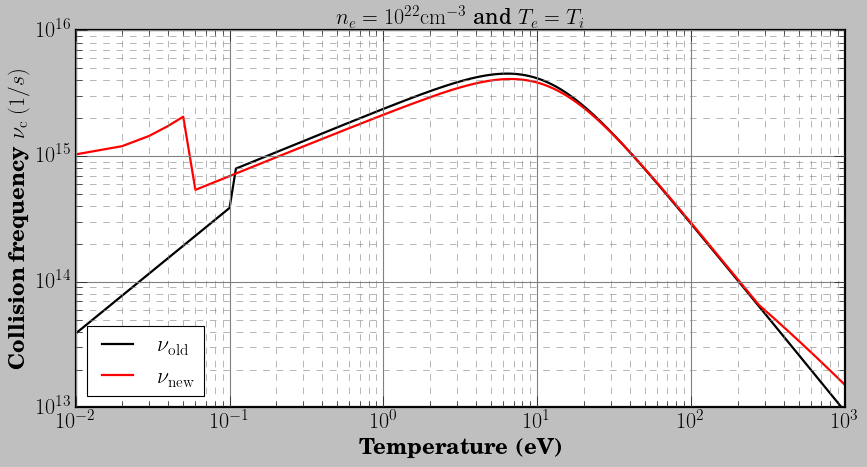

In [24]:
def get_vc(Te,Til,nfe,na,mode):
    
    # Te unit  : eV
    # Til unit : eV
    # nfe unit : 1/m^3
    # na unit  : 1/m^3
    
    if Til <= 0.1 : 
        vph0 = 10**14 # 1/s
        T0 = 300*kelvin_to_eV # eV
        vc = vph0*Til/T0 # 1/s
    
    if Til > 0.1 :
        Zlnlambda = 10
        # Ref[NRL : all quantities in CGS except Te in eV]
        vei_NRL = 2.91*10**-6*(nfe/100**3)*Zlnlambda/(Te**1.5) # 1/s with unit [Te] in eV
        # Ref[Spitzer]
        vei_WOO = math.sqrt(2)*nfe*eCharge**4*Zlnlambda/ \
              (12*math.pi**1.5*vacuumPermittivity**2*math.sqrt(massElectron)*(Te*eV)**1.5) # 1/s
        # Ref[Lee-More : An electron conductivity model for dense plasmas]
        ve = math.sqrt(1.5*Te*eV/massElectron) # m/s
        vmpf = ve*na**(1/3) # 1/s
        if mode==0 : vc = 1/(1/vmpf+1/vei_NRL) # 1/s
        if mode==1 : vc = 1/(1/vmpf+1/vei_WOO) # 1/s
        
    if Til > 1000:
        # Ref[Spitzer]
        vei = math.sqrt(2)*nfe*eCharge**4*Zlnlambda/ \
              (12*math.pi**1.5*vacuumPermittivity**2*math.sqrt(massElectron)*(Te*eV)**1.5)
        vc = vei

    return vc # 1/s

plot=1
if plot==1:
    
    ne_IN = 1*10**22*100**3
    temp = [ T for T in np.arange(0.01,1000,0.01) ]
    collFreq_NRL = [get_vc(T,T,ne_IN,n_a_CH,0) for T in temp]
    collFreq_WOO = [get_vc(T,T,ne_IN,n_a_CH,1) for T in temp]
         
    plt.figure(figsize=[11,6])
    
    #plt.loglog(temp,collFreq_NRL,lw=2,ls='dashed',   basex=10, c='red', label=r'$\nu_{\mathrm{old,NRL}}$')
    plt.loglog(temp,collFreq_WOO,lw=2,c='k',label=r'$\nu_{\mathrm{old}}$')
    #plt.loglog(temp0,collFreq2,lw=2, basex=10, c='b', label=r'$\nu_{LA}$')
    #plt.loglog(temp0,collFreq3,lw=2, basex=10, c='r', label=r'$\nu_{LO}$')
    #plt.loglog(temp0,collFreq2[:]+collFreq3[:],lw=1, basex=10, color='r',           label=r'$\nu_{LA}+\nu_{LO}$')
    
    #plt.loglog(temp4,collFreq4,lw=2, basex=10, color='purple', label=r'$\nu_{en}$') 
    #plt.loglog(temp5,collFreq5WOO,lw=2, basex=10, color='green', label=r'$\nu_{ei}$')     
    plt.loglog(temp6,collFreq6,lw=2,color='r',label=r'$\nu_{\mathrm{new}}$') 
  
    title = r'$n_{e} = 10^{22}\mathrm{cm^{-3}}$ and $T_{e} = T_{i}$'
    
    plt.legend(fontsize=20,loc='lower left')
    plt.title(title,fontsize=20)
    plt.xlabel(r'\textbf{Temperature (eV)}',fontsize=20)
    plt.ylabel(r'\textbf{Collision frequency $\nu_{\mathrm{c}}~(1/s)$}',fontsize=20)
    plt.xticks(fontsize=20)
    plt.yticks(fontsize=20)
    plt.tick_params(direction='in',right=True,top=True,length=10)
    plt.tick_params(which='minor',length=5,right=True,direction='in',top=True)
    plt.ylim([10**13,10**16])
    plt.xlim([0.01,1000])
    plt.grid(which='major', linestyle='-', linewidth='1', color='grey')
    plt.grid(which='minor', linestyle='--', linewidth='0.5', color='grey')
    
    plt.tight_layout()
    if 0 : 
        export_name = 'collisional_freq_new_V5'
        print(f'{"Save as":30}',':',export_name)
        path = '/Users/kwoo/Desktop/PostDoc/InitialPlasma/reports/plots/'
        print(f'{"path_local":30}',':',str(pathlib.Path().absolute()))    
        print(f'{"path_save":30}',':',path)
        plt.savefig(path+export_name+'.eps',format='eps')
        plt.savefig(path+export_name,dpi=500) 
    plt.show() 

# Heat Capacity

## get_cp_solid

In [25]:
def get_cp_solid(T):
    
    # T : K
    
    a1 = -0.098338
    a2 = -1.30958
    a3 = 6.5499
    a4 = -8.13656
 
    cp_solid_1 = math.exp(a1*np.log(T)**3 + a2*np.log(T)**2 + a3*np.log(T) + a4)    
    cp_solid_2 = 7.7551*10**5*T**(-2) + 0.53447*T - 41.58
    cp_molten  = 0.2653*T + 95.12
    
    if (T>=10) and (T<200)  : cp = cp_solid_1
        
    if (T>=200) and (T<373) : cp = cp_solid_2
        
    if (T>=373) and (T<1000) : cp = cp_molten      
    
    return cp

## get_cp_data_lowT

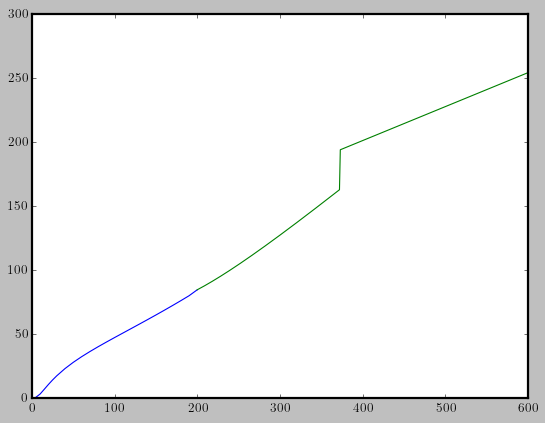

In [26]:
def get_cp_data_lowT():
    
    data =np.array([[0,0],
          [0.1,0.0000633],
          [0.2,0.000132],
          [0.3,0.000269],
          [0.4,0.000496],
          [0.5,0.000838],
          [0.6,0.00133],
          [0.7,0.00200],
          [0.8,0.00288],
          [0.9,0.00401],
          [1.0,0.00543],
          [1.2,0.00929],
          [1.4,0.01480],
          [1.6,0.02231],
          [1.8,0.03217],
          [2.0,0.04477],
          [3.0,0.1622],
          [4.0,0.4058],
          [5.0,0.8215],
          [10,3.33],
          [15,7.03],
          [20,10.77],
          [25,14.26],
          [30,17.47],
          [40,23.13],
          [50,28.01],
          [60,32.37],
          [70,36.38],
          [80,40.17],
          [90,43.81],
          [100,47.37],
          [120,54.38],
          [130,57.89],
          [140,61.43],
          [150,65.01],
          [160,68.65],
          [170,72.36],
          [180,76.14],
          [190,80.01],
          [200,84.70175]])
    
    return data # J/mol/K

cp_data_lowT = get_cp_data_lowT()
plt.plot(cp_data_lowT[:,0],cp_data_lowT[:,1])

temp = [ T for T in range(200,600,1)]
cp_solid = [ get_cp_solid(T) for T in temp ]
plt.plot(temp,cp_solid)

## func_T3_law

In [27]:
def func_T3_law(T,TD):
    # T : K
    # TD : K
    gas_constant = mole*kB # J/mole/K    
    return 12*np.pi**4/5*gas_constant*(T/TD)**3

## get_T_Debye

T_Debye (K) =  66.87350842025788
T_Debye (meV) =  5.765658687402574


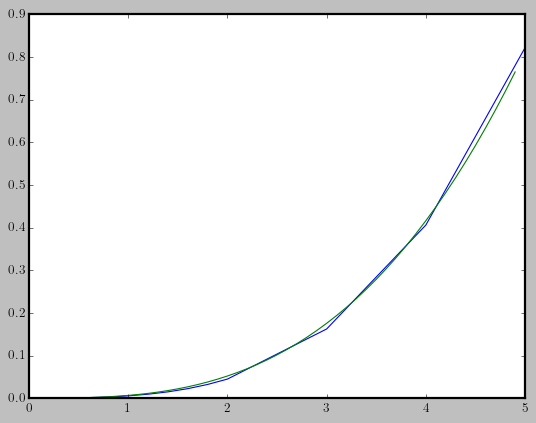

In [28]:
def get_T_Debye(cp_data_lowT):
    
    data = []
    for ele in cp_data_lowT:
        if ele[0]<10 : data.append(ele)
    data = np.array(data)
        
    gas_constant = mole*kB # J/mole/K
        
    xdata = data[:,0]
    ydata = data[:,1]
     
    popt, pcov = curve_fit(func_T3_law, xdata, ydata)
    T_Debye = popt[0]
    
    xdata_fit = [T for T in np.arange(0,5,0.1)]
    ydata_fit = func_T3_law(xdata_fit,T_Debye) 
    
    plt.plot(xdata,ydata)
    plt.plot(xdata_fit,ydata_fit) 
    
    print('T_Debye (K) = ',popt[0])
    print('T_Debye (meV) = ',popt[0]*kelvin_to_eV*1000)    
    
    return T_Debye

T_Debye = get_T_Debye(cp_data_lowT)

## get_Vexpansion

In [29]:
def get_Vexpansion(T):
    
    # molar volume of a repeat unit
    Vm = 92.8*10**-6 # m^3/mol 
    
    # volumetric coefficient
    ag = 2.37*10**-4
    ar = 5.74*10**-4 

    bulk_modulus = 3.58*10**9 # Pa
    
    Vexpansion = Vm*ag**2*bulk_modulus*T
    
    return Vexpansion

## get_Einstein_function

0


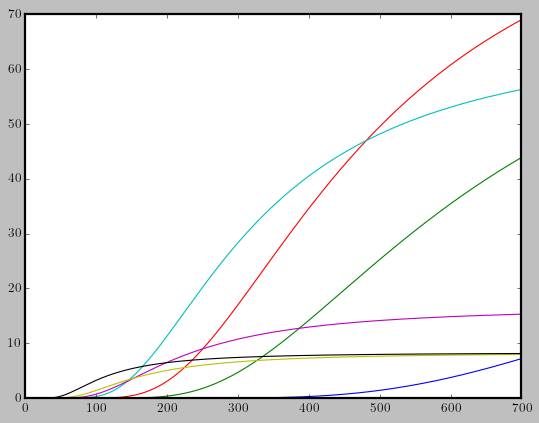

In [30]:
def get_Einstein_function(T,theta,N):
    
    R = 8.3145 # J/mole/K  
       
    if theta/T > 200 : 
        Einstein_function = 0
    else : 
        part1 = (theta/T)**2*math.exp(theta/T)
        part2 = (math.exp(theta/T) - 1)**2        
        Einstein_function = N*R*part1/part2
    
    return Einstein_function

print(get_Einstein_function(1,350,1))

if 1 :     
    temp = [ T for T in range(1,700,1)]
    plt.plot(temp,[get_Einstein_function(T,4000,8) for T in temp])      
    plt.plot(temp,[get_Einstein_function(T,2000,10) for T in temp])      
    plt.plot(temp,[get_Einstein_function(T,1500,12) for T in temp])      
    plt.plot(temp,[get_Einstein_function(T,1000,8) for T in temp])    
    plt.plot(temp,[get_Einstein_function(T,700,2) for T in temp])
    plt.plot(temp,[get_Einstein_function(T,500,1) for T in temp])
    plt.plot(temp,[get_Einstein_function(T,350,1) for T in temp])

## get_cp_group

74.9506385416552


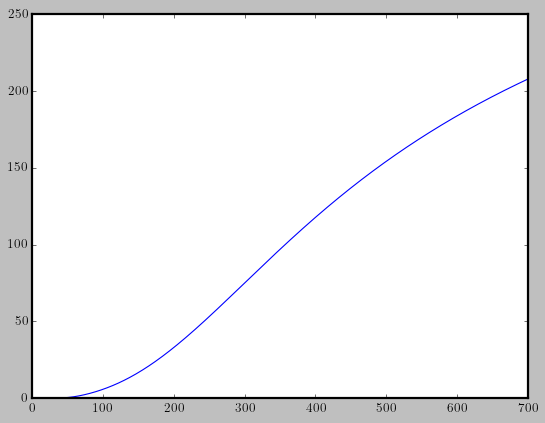

In [31]:
def get_cp_group(T):
    
    cp_group = get_Einstein_function(T,4000,8) +\
               get_Einstein_function(T,2000,10) +\
               get_Einstein_function(T,1500,12) +\
               get_Einstein_function(T,1000,8) +\
               get_Einstein_function(T,700,2) +\
               get_Einstein_function(T,500,1) +\
               get_Einstein_function(T,350,1)
    
    dimension = 1
    return cp_group*dimension # J/mol/K

print(get_cp_group(300))

if 1 :
    temp = [ T for T in range(1,700,1)]
    cp_group = [ get_cp_group(T) for T in temp ]
    plt.plot(temp,cp_group)

## get_cp_skeletal

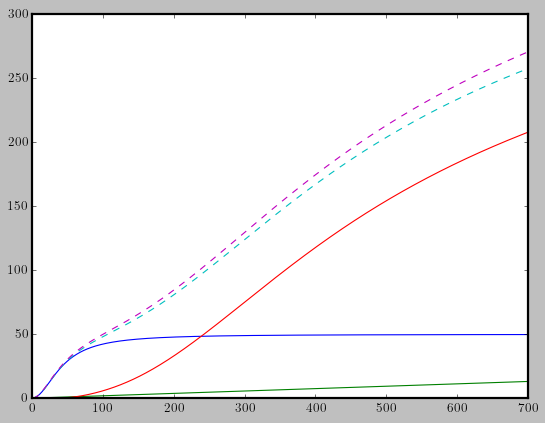

In [32]:
def get_cp_skeletal(T):
    
    R = 8.3145 # J/mole/K
    
    #CT = 6 R [ (T/42.5)^2 / (1 + (T/42.5)^2)]    
    #CP - CV = -T (dV/dT)2P / (dV/dP)2T = Vα2BT
    
    cp_skeletal = 6 * R * ((T/42.5)**2 / (1 + (T/42.5)**2))
    
    return cp_skeletal

if 1 :
    temp = np.array([ T for T in range(1,700,1)])
    cp_skeletal = np.array([ get_cp_skeletal(T) for T in temp ])    
    plt.plot(temp,cp_skeletal)
    
    Vexpansion = np.array([ get_Vexpansion(T) for T in temp ])
    plt.plot(temp,Vexpansion) 
    
    cp_group = np.array([ get_cp_group(T) for T in temp ])
    plt.plot(temp,cp_group)
    
    temp2 = [ T for T in range(200,700,1)]
    cp_solid = np.array([ get_cp_solid(T) for T in temp2 ])

    cp_Debye = [ func_T3_law(T,T_Debye) for T in temp]    
    
    plt.plot(temp,cp_skeletal+cp_group,ls='dashed') 
    plt.plot(temp,cp_skeletal+cp_group+Vexpansion,ls='dashed')     

## get_report_cp

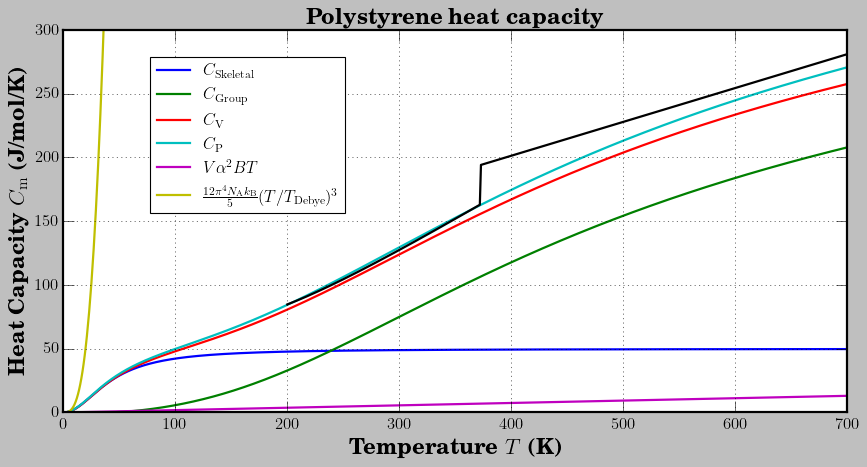

In [33]:
def get_report_cp(exportFlag):
    
    plt.close('all')
    fig = plt.figure(figsize=[11,6])
    fs,fs2,fs3,fs4=20,15,18,10

    label1 = r'\textbf{$C_{\mathrm{Skeletal}}$}'
    label2 = r'\textbf{$C_{\mathrm{Group}}$}'
    label3 = r'\textbf{$C_{\mathrm{V}}$}'
    label4 = r'\textbf{$C_{\mathrm{P}}$}'
    label5 = r'\textbf{$V\alpha^2BT$}'
    label6 = r'\textbf{Exp. data}' 
    label7 = r'\textbf{$\frac{12\pi^4N_{\mathrm{A}}k_{\mathrm{B}}}{5}(T/T_{\mathrm{Debye}})^3$}'    

    nrow,ncol=1,1
    ax1 = plt.subplot2grid((nrow, ncol), (0,0), colspan=1, rowspan=1) 
    
    yfactor = 1#1/mole/kelvin_to_eV/eV

    ax1.plot(temp,cp_skeletal*yfactor,lw=2,label=label1)    
    ax1.plot(temp,cp_group*yfactor,lw=2,label=label2)    
    ax1.plot(temp,(cp_skeletal+cp_group)*yfactor,lw=2,label=label3)
    ax1.plot(temp,(cp_skeletal+cp_group+Vexpansion)*yfactor,lw=2,label=label4)
    ax1.plot(temp,Vexpansion*yfactor,lw=2,label=label5) 
    
    #ax1.plot(cp_data_lowT[:,0],cp_data_lowT[:,1],lw=2,c='k')        
    ax1.plot(temp2,cp_solid,lw=2,c='k')    # EXPERIMENTAL DATA!!! exp_data_CH
    ax1.plot(temp,cp_Debye,lw=2,label=label7)     
     
    ax1.tick_params(which='major',length=10,labelsize=fs2)
    ax1.set_xlabel(r'\textbf{Temperature $T$ (K)}',fontsize=fs)
    ax1.set_ylabel(r'\textbf{Heat Capacity $C_{\mathrm{m}}$ (J/mol/K)}',fontsize=fs) 
    #ax1.set_ylabel(r'\textbf{Heat Capacity $C_\mathrm{m}^\mathrm{J/mol/K}\times 0.12$}',fontsize=fs)
    ax1.set_title(r'\textbf{Polystyrene heat capacity}',fontsize=fs)      
    ax1.legend(fontsize=fs2,loc='upper left',bbox_to_anchor=[0.1,0.95],numpoints=1)
    ax1.set_ylim([0,300])
    ax1.grid()


    plt.tight_layout()
    if exportFlag : 
        export_name = 'polystyrene_heat_capacity'
        print(f'{"Save as":30}',':',export_name)
        path = '/Users/kwoo/Desktop/PostDoc/InitialPlasma/reports/plots/'
        print(f'{"path_local":30}',':',str(pathlib.Path().absolute()))    
        print(f'{"path_save":30}',':',path)
        plt.savefig(path+export_name+'.eps',format='eps')
        plt.savefig(path+export_name,dpi=500) 
    plt.show() 
              
get_report_cp(exportFlag=0)

# Light Wave Propagation

## get_param

In [34]:
um = 10**-6 # m
nm = 10**-9 # m
ns = 10**-9 # s
ps = 10**-12 # s
fs = 10**-15 # s
eV = 1.6*10**-19 # J
kelvin_to_eV = 8.621738*10**-5 # eV 

lightSpeed = 299792458 # m/s
vacuumPermittivity = 8.854*10**-12 # C⋅V−1⋅m−1
epsilon0 = 8.854187817e-12 # vacuum permitivity [F/m] 1.e7_dp / (4*pi*c*c) 

# angular frequencies of laser
wavelength_355nm = 355*nm # m
wavelength_450nm = 450*nm # m

omega_351nm = 2*np.pi*(lightSpeed/wavelength_355nm) # 1/s
omega_355nm = 2*np.pi*(lightSpeed/wavelength_355nm) # 1/s
omega_450nm = 2*np.pi*(lightSpeed/wavelength_450nm) # 1/s

PlanckConstant = 6.62607015*10**-34 # J.s
hbar = PlanckConstant/(2*math.pi) # J.s

# input  laser intensity unit : W/m^2
# output electric field  unit : V/m
vacuumRefractiveIndex = 1
coef_laserI_eField = (2/lightSpeed/vacuumPermittivity/vacuumRefractiveIndex)**0.5

eCharge = 1.602176634*10**-19 # C
massElectron = 9.10938356*10**-31 # kg
massElectronReduced = massElectron/2 # kg

eCharge_CGS = 4.80326*10**-10 # esu
massElectron_CGS = 9.10938356*10**-31*1000 # g

beam_radius = 430*um # m
beam_area   = np.pi*beam_radius**2 # m^2

probe_fluence   = 0.1*0.001*100**2 # J/m^2
probe_duration  = 20*fs # s
probe_intensity = probe_fluence/probe_duration # W/m^2

sigma2 = 7*10**8 # cm.s/J^2

# mass_density/total_ion_mass*Z_total [1/cm^3]
R_CH = 1.03*1000 # kg/m^3
Z_CH = 7 # no unit
A_CH = (12.011+1.008)*1.66053904e-27 # kg
n_vb_CH = Z_CH*R_CH/A_CH # [1/m^3]
Eg_CH   = 4.05*eV # [J]
n_a_CH  = 3*10**22*100**3 # 1/m^3
rho = 1*gcm3_to_kgm3 # kg/m^3

print('probe_intensity [W/m^2]  = ',"{:.2e}".format(probe_intensity))
print('probe_intensity/100**2   = ',"{:.2e}".format(probe_intensity/100**2),'[W/cm^2]')
print('Eg_CH   [J]              = ',Eg_CH)
print('rho_CH  [kg/m^3]         = ',R_CH)
print('n_vb_CH [1/m^3]          = ',"{:.3e}".format(n_vb_CH))
print('n_a_CH  [1/m^3]          = ',"{:.3e}".format(n_a_CH))

probe_intensity [W/m^2]  =  5.00e+13
probe_intensity/100**2   =  5.00e+09 [W/cm^2]
Eg_CH   [J]              =  6.48e-19
rho_CH  [kg/m^3]         =  1030.0
n_vb_CH [1/m^3]          =  3.335e+29
n_a_CH  [1/m^3]          =  3.000e+28


## get_data_pulse

In [35]:
def get_data_pulse(file_name):
    file_to_open = open(file_name,'r')
    pulse = []
    for line in file_to_open:
        row = line.split()
        tmp = []
        for ele in row:
            tmp.append(float(ele))
        pulse.append(tmp)
    pulse = np.array(pulse)
    pulse[:,1] = pulse[:,1]/beam_area*10**12 # change TW into W/m^2
    return pulse # [nanoseconds, W/m^2]

file_name = 'pulse_1.dat'
pulse_1 = get_data_pulse(file_name)

# file_name = '/Users/kwoo/Desktop/PostDoc/InitialPlasma/python/RIGEL_DATA/pulse_2.dat'
# pulse_2 = get_data_pulse(file_name)

# file_name = '/Users/kwoo/Desktop/PostDoc/InitialPlasma/python/RIGEL_DATA/pulse_3.dat'
# pulse_3 = get_data_pulse(file_name)

# file_name = '/Users/kwoo/Desktop/PostDoc/InitialPlasma/python/RIGEL_DATA/pulse_4.dat'
# pulse_4 = get_data_pulse(file_name)

pulse_1_Imax = max(pulse_1[:,1])
# pulse_2_Imax = max(pulse_2[:,1])
# pulse_3_Imax = max(pulse_3[:,1])
# pulse_4_Imax = max(pulse_4[:,1])

npos = list(pulse_1[:,1]).index(pulse_1_Imax)
pulse_1_Imax_TimePs = pulse_1[npos][0]*1000
print('pulse_1_Imax_TimePs = ',pulse_1_Imax_TimePs)

# npos = list(pulse_2[:,1]).index(pulse_2_Imax)
# pulse_2_Imax_TimePs = pulse_2[npos][0]*1000
# print('pulse_2_Imax_TimePs = ',pulse_2_Imax_TimePs)

# npos = list(pulse_3[:,1]).index(pulse_3_Imax)
# pulse_3_Imax_TimePs = pulse_3[npos][0]*1000
# print('pulse_3_Imax_TimePs = ',pulse_3_Imax_TimePs)

# npos = list(pulse_4[:,1]).index(pulse_4_Imax)
# pulse_4_Imax_TimePs = pulse_4[npos][0]*1000
# print('pulse_4_Imax_TimePs = ',pulse_4_Imax_TimePs)

print('pulse_1_Imax (W/cm^2) = ',"{:.3e}".format(pulse_1_Imax*100**-2))
# print('pulse_2_Imax (W/cm^2) = ',"{:.3e}".format(pulse_2_Imax*100**-2))
# print('pulse_3_Imax (W/cm^2) = ',"{:.3e}".format(pulse_3_Imax*100**-2))
# print('pulse_4_Imax (W/cm^2) = ',"{:.3e}".format(pulse_4_Imax*100**-2))

pulse_1_Imax_TimePs =  115.0
pulse_1_Imax (W/cm^2) =  8.917e+07


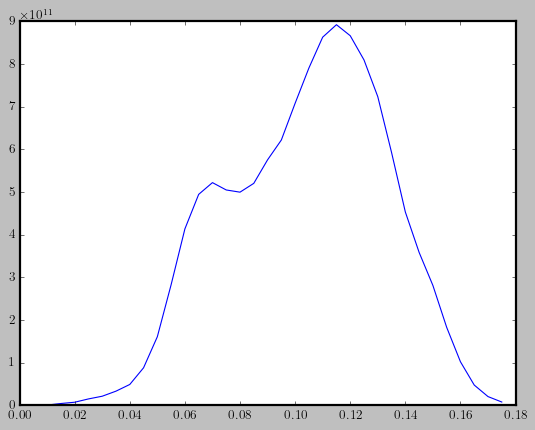

In [36]:
plt.plot(pulse_1[:,0], pulse_1[:,1]) # x is in nanoseconds, 

In [37]:
pulse_1.shape

(36, 2)

In [38]:
(pulse_1[-1, 0] - pulse_1[0, 0]) * ns  # in nanoseconds

1.75e-10

## get_report_pulse

Imax_1 (TW/cm^2) =  8.917497081839025e-05


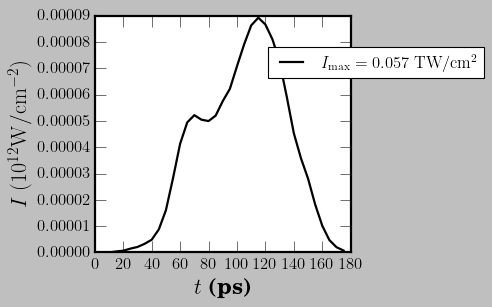

In [39]:
def get_report_pulse(exportFlag):
    
    plt.close('all')
    fig = plt.figure(figsize=[6.5,4])
    fs,fs2,fs3,fs4=20,15,18,10

    label1 = r'\textbf{$I_{\mathrm{max}}=0.057 ~\mathrm{TW/cm^2}$}'
    label2 = r'\textbf{$I_{\mathrm{max}}=0.12 ~\mathrm{TW/cm^2}$}'
    label3 = r'\textbf{$I_{\mathrm{max}}=0.54 ~\mathrm{TW/cm^2}$}'

    nrow,ncol=1,1
    ax1 = plt.subplot2grid((nrow, ncol), (0,0), colspan=1, rowspan=1) 

    unit_x = 1000
    unit_y = (100**-2)*(10**-12)
    ax1.plot(pulse_1[:,0]*unit_x,pulse_1[:,1]*unit_y,'-',c='k',lw=2,label=label1)
#     ax1.plot(pulse_2[:,0]*unit_x,pulse_2[:,1]*unit_y,'--',c='k',lw=2,label=label2)
#     ax1.plot(pulse_3[:,0]*unit_x,pulse_3[:,1]*unit_y,'-.',c='k',lw=2,label=label3)
    #ax1.plot(pulse_4[:,0]*unit_x,pulse_4[:,1]*unit_y)

    print('Imax_1 (TW/cm^2) = ',max(pulse_1[:,1]*unit_y))
#     print('Imax_2 (TW/cm^2) = ',max(pulse_2[:,1]*unit_y))
#     print('Imax_3 (TW/cm^2) = ',max(pulse_3[:,1]*unit_y))

    #ax1.set_xlim([10028,10034])
    ax1.tick_params(which='major',length=10,labelsize=fs2)
    ax1.set_xlabel(r'\textbf{$t$ (ps)}',fontsize=fs)
    ax1.set_ylabel(r'\textbf{$I ~(\mathrm{10^{12}W/cm^{-2}})$}',fontsize=fs)
    ax1.legend(fontsize=fs2,loc='center',bbox_to_anchor=[1.1,0.8])

    plt.tight_layout()
    if exportFlag : 
        export_name = 'pulse_1_to_3_intensities'
        print(f'{"Save as":30}',':',export_name)
        path = '/Users/kwoo/Desktop/PostDoc/InitialPlasma/reports/plots/'
        print(f'{"path_local":30}',':',str(pathlib.Path().absolute()))    
        print(f'{"path_save":30}',':',path)
        plt.savefig(path+export_name+'.eps',format='eps')
        plt.savefig(path+export_name,dpi=500) 
    plt.show() 
              
get_report_pulse(exportFlag=0)              

## get_nc (critical density)

In [40]:
def get_nc(wavelength):
    
    # input wavelength unit : m
    # output nc unit : 1/m^3
    
    angular_freq = 2*math.pi*(lightSpeed/wavelength)
    ne_crit = vacuumPermittivity*massElectron*angular_freq**2/eCharge**2
    return ne_crit # (1/m^3)

## get_WPI

In [41]:
def Sumfunction(K1,K2,E1,E2,Nmax,x):
    summation = 0
    for n in range(0,Nmax+1):
        Z1 = math.pi**2*(2*math.modf(x+1)[1] - 2*x + n)
        Z2 = 2*K2*E2
        z = math.sqrt(Z1/Z2)
        summation += math.exp(-math.pi*n*(K1 - E1)/E2)*Phifunction(z)
    return summation
    
def Phifunction(z):
    integrand = lambda y: math.exp(y**2-z**2)
    phi = integrate.quad(integrand, 0, z)
    return phi[0]

def ellipK(x):
    integrand = lambda y: 1/math.sqrt(1-x**2*math.sin(y)**2)
    output = integrate.quad(integrand, 0, math.pi/2)
    return output[0]

def ellipE(x):
    integrand = lambda y: math.sqrt(1-x**2*math.sin(y)**2)
    output = integrate.quad(integrand, 0, math.pi/2)
    return output[0]

def check_idensity():
    x = 0.5
    
    identity_wrong = scipy.special.ellipk(x)*scipy.special.ellipe(math.sqrt(1-x**2)) + \
    scipy.special.ellipe(x)*scipy.special.ellipk(math.sqrt(1-x**2)) - \
    scipy.special.ellipk(x)*scipy.special.ellipk(math.sqrt(1-x**2))

    identity_correct = ellipK(x)*ellipE(math.sqrt(1-x**2)) + \
    ellipE(x)*ellipK(math.sqrt(1-x**2)) - ellipK(x)*ellipK(math.sqrt(1-x**2))

    print('x = ',x,', identity_correct = ',identity_correct,', identity_wrong = ',identity_wrong,)
    print('ellipE(x) = ',ellipE(x))
    print('ellipK(x) = ',ellipK(x))
    
check_idensity()    

def WPIfunction(laserI_IN,laserE,Nmax,omega_IN,bangGap):
    
    # laserI_IN unit : W/m^2
    # laserE unit : V/m
    # omega_IN unit : 1/s
    # bangGap  unit : J
    
    # laserI unit : W/cm^2
    laserI = laserI_IN/100**2
    
    # definitions of gamma1 and gamma2 are different from Arnab
    gamma = omega_IN*math.sqrt(massElectronReduced*bangGap)/(eCharge*laserE)  
    gamma1 = gamma/(1+gamma**2)**0.5
    gamma2 = gamma1/gamma
    
    elliptics = 0
    if elliptics==0:
        K1 = scipy.special.ellipk(gamma1)
        K2 = scipy.special.ellipk(gamma2)
        E1 = scipy.special.ellipe(gamma1)
        E2 = scipy.special.ellipe(gamma2)
    elif elliptics==1:
        K1 = ellipk(gamma1)
        K2 = ellipk(gamma2)
        E1 = ellipe(gamma1)
        E2 = ellipe(gamma2)
    
    # L. V. Keldysh Eq.(38)
    bangGapEffective = 2*bangGap*E2/(math.pi*gamma1)
    x = bangGapEffective/(hbar*omega_IN)
    
    Qvalue = math.sqrt(math.pi/2/K2)*Sumfunction(K1,K2,E1,E2,Nmax,x)
    
    # Jack's WPI is about three times smaller than Arnab's WPI
    WPI = 2*omega_IN/(9*math.pi)*(omega_IN*massElectronReduced/(hbar*gamma1))**1.5*\
    Qvalue*math.exp(-math.pi*math.modf(x+1)[1]*(K1-E1)/E2)*10**-6 # 1/(s.cm^3)
    
    # laserI unit : J/(s.cm^2)
    # sigma2 unit : cm.s/J^2
    WPI_appro = sigma2*laserI**2 # 1/(s.cm^3)
    
    return [WPI,WPI_appro]

def get_WPI(laserI,laserE,Nmax,omega_IN,bangGap):
    
    # laserI unit : W/cm^2
    # laserE unit : V/m
    # omega_IN unit : 1/s
    # bangGap  unit : J
    
    # definitions of gamma1 and gamma2 are different from Arnab
    gamma = omega_IN*math.sqrt(massElectronReduced*bangGap)/(eCharge*laserE)  
    gamma1 = gamma/(1+gamma**2)**0.5
    gamma2 = gamma1/gamma
    
    elliptics = 0
    if elliptics==0:
        K1 = scipy.special.ellipk(gamma1)
        K2 = scipy.special.ellipk(gamma2)
        E1 = scipy.special.ellipe(gamma1)
        E2 = scipy.special.ellipe(gamma2)
    elif elliptics==1:
        K1 = ellipk(gamma1)
        K2 = ellipk(gamma2)
        E1 = ellipe(gamma1)
        E2 = ellipe(gamma2)
    
    # L. V. Keldysh Eq.(38)
    bangGapEffective = 2*bangGap*E2/(math.pi*gamma1)
    x = bangGapEffective/(hbar*omega_IN)
    
    Qvalue = math.sqrt(math.pi/2/K2)*Sumfunction(K1,K2,E1,E2,Nmax,x)
    
    # Jack's WPI is about three times smaller than Arnab's WPI
    WPI = 2*omega_IN/(9*math.pi)*(omega_IN*massElectronReduced/(hbar*gamma1))**1.5*\
    Qvalue*math.exp(-math.pi*math.modf(x+1)[1]*(K1-E1)/E2)*10**-6 # 1/(s.cm^3)
    
    # laserI unit : J/(s.cm^2)
    # sigma2 unit : cm.s/J^2
    WPI_appro = sigma2*laserI**2 # 1/(s.cm^3)
    
    return WPI*100**3/2 # 1/(s.m^3)

laserI0 = 10000000000 # W/m^2
laserE1 = coef_laserI_eField*math.sqrt(laserI0) # V/m
laserE2 = math.sqrt(2*laserI0/(epsilon0*lightSpeed))  # V/m
W_PI , W_PI_appro = WPIfunction(laserI_IN=laserI0,laserE=laserE2,Nmax=50,
                                omega_IN=omega_355nm,bangGap=Eg_CH)
print()
print('laserI  [W/m^2] = ',laserI0)
print('laserE1 [V/m]   = ',laserE1)
print('laserE2 [V/m]   = ',laserE2)
print('laserE1/laserE2 = ',laserE1/laserE2,np.sqrt(2))
print('W_PI,W_PI_appro = ',W_PI , W_PI_appro,'[1/s/cm^3]')
print('W_PI/W_PI_appro = ',W_PI/W_PI_appro)

x =  0.5 , identity_correct =  1.5707963267948961 , identity_wrong =  0.8687815422231111
ellipE(x) =  1.4674622093394272
ellipK(x) =  1.6857503548125963

laserI  [W/m^2] =  10000000000
laserE1 [V/m]   =  2744952.840923973
laserE2 [V/m]   =  2744923.72749469
laserE1/laserE2 =  1.0000106062798726 1.4142135623730951
W_PI,W_PI_appro =  4.0160759500787345e+20 7e+20 [1/s/cm^3]
W_PI/W_PI_appro =  0.5737251357255335


## get_laserE

In [42]:
def get_laserE(laserI,RefractiveIndex):
    
    # input  laser intensity unit : W/m^2
    # output electric field  unit : V/m
    coef_laserI_eField = (2/lightSpeed/vacuumPermittivity/RefractiveIndex)**0.5
    
    return coef_laserI_eField*laserI**0.5 # V/m

## get_W1

In [43]:
def get_W1(laserE):
    
    # rate of one-photon absorption in the conduction band,
    # which evolves linearly with the laser intensity.
    # reference : L Barilleau et al 2016 J. Phys. D: Appl. Phys. 49 485103

    # input electric field  unit : V/m
    # output W1 unit : 1/s

    return 10**(-7)*laserE**2 # 1/s

## get_Ce

In [44]:
def get_Ce(n_fe):
    
    # input electron number density  unit : 1/m^3
    # output Ce unit : 1/m^3
    
    return 1.5*n_fe # 1/ m^3

## get_Ci

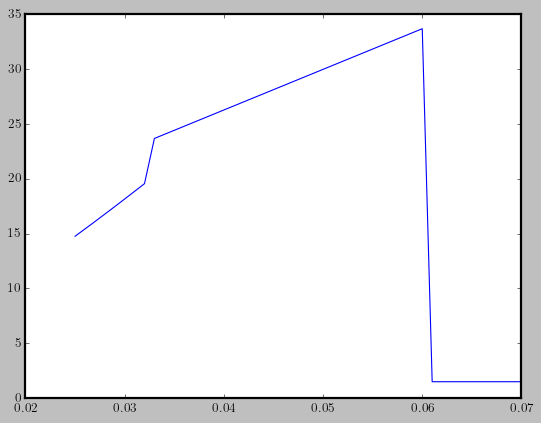

In [45]:
def get_Ci(n_a):    
    # input atomic number density  unit : 1/m^3
    # output Ci unit : 1/m^3    
    return 1.5*n_a # 1/ m^3

def get_Ci_new(n_a,Ti):
    
    # input n_a: 1/m^3
    # input Ti : J
    
    # T : K 
    T = Ti/eV/kelvin_to_eV
    
    #print(T)
    
    cp_solid_1 = 7.7551*10**5*T**(-2) + 0.53447*T - 41.58
    cp_solid_2 = 0.2653*T + 95.12
        
    if (T>=200) and (T<373)  : Ci = cp_solid_1*J_per_mole_per_K*n_a
        
    if (T>=373) and (T<700) : Ci = cp_solid_2*J_per_mole_per_K*n_a

    if (T>=700) : Ci = 1.5*n_a
    
    return Ci

if 1 :
    temp = [ T for T in np.arange(0.025,.07,.001)]
    Ci_new = np.array([ get_Ci_new(n_a_CH,T*eV) for T in temp ])
    plt.plot(temp,Ci_new/n_a_CH)

## get_G (V_c^{energy} energy relaxation rate)

1 / How long it takes for energy in excited state to initial state for electrons

In [46]:
def get_G(Ce,vc,Ti):
    
    # input collision frequency unit : 1/s
    # input Ce unit : 1/m^3 
    # output G unit : 1/m^3/s
    
    mS = (12+1)*8*amu
    mB = (12+1)*6*amu  
    mA = (12+1)*2*amu
    mCH = (12+1)/2*amu
    mC = 12*amu
    mH = 1*amu    
    
    if (Ti < 2.32*eV)  : mil = mH # (mS + mC + mH)/3
    if (Ti >= 2.32*eV) and (Ti < 2.43*eV) : mil = (mS+mB+mA)/3
    if (Ti >= 2.43*eV) and (Ti < 4.00*eV) : mil = mB
    if (Ti >= 4.00*eV) and (Ti < 8.00*eV) : mil = (mB+mA+mCH)/3
    if (Ti >= 8.00*eV) : mil = mCH
        
    me_to_mil = massElectron/mil
    
    #me_to_mil = 1/1836
    
    return Ce*vc*me_to_mil # 1/m^3/s

## get_n

In [47]:
def get_n(n_IN,omega_IN):
    
    # input n_IN : 1/m^3
    # input omega_IN : 1/s
    
    n_CGS = n_IN/100**3 # 1/cm^3
    
    omega_pe = np.sqrt(4*np.pi*n_CGS*eCharge_CGS**2/massElectron_CGS) # 1/s
    
    RefractiveIndex = np.sqrt(1-(omega_pe/omega_IN)**2) # unitless
    
    return RefractiveIndex # unitless

## get_JH

In [48]:
def get_JH(n_fe,vc,omega,laserE,RefractiveIndex):
    
    # input eCharge unit : Coulomb
    # input n_fe    unit : 1/m^3 
    # input vc      unit : 1/s
    # input massElectron unit : kg
    # input omega unit : 1/s
    # input laserE unit : V/m
    # input lightSpeed unit : m/s
    # input vacuumPermittivity unit : # C⋅V−1⋅m−1
    
    # output dUdt  unit : 1/m^3/s   
    # output sigma unit : 1/m
    
    dUdt  = eCharge**2*n_fe*vc/massElectron/(omega**2+vc**2)*laserE**2         # J/s/m^3
    #sigma = dUdt/(laserE**2)*2/(lightSpeed*RefractiveIndex*vacuumPermittivity) # 1/m
    sigma = dUdt/(laserE**2)/(lightSpeed*RefractiveIndex*vacuumPermittivity) # 1/m
    #sigma = vc/(RefractiveIndex*lightSpeed)
    return [dUdt,sigma]

## get_vr

In [49]:
def get_vr(ne,Te):
    
    # ne : 1/m^3
    # Te : J
    
    Te_eV = Te/eV      # eV
    ne_gcc = ne/100**3 # 1/cm^3
    
    tr = 1.8*10**26*Te_eV**4.5/ne_gcc**2 # s

    vr = 1/tr # 1/s
    
    return vr
    
print("{:.3e}".format(get_vr(4.5*10**19*100**3,10*eV))   )

3.558e+08


## get_vi

In [50]:
def get_vi(laserE,omega,Eg,vc):

    # input eCharge unit : Coulomb
    # input vc      unit : 1/s
    # input massElectron unit : kg
    # input omega unit : 1/s
    # input laserE unit : V/m
    # input lightSpeed unit : m/s
    # input vacuumPermittivity unit : # C⋅V−1⋅m−1
    
    vi  = eCharge**2*vc/massElectron/(omega**2+vc**2)*laserE**2/Eg_CH         # J/s
    
    return vi

laserE = get_laserE(laserI=5.7*10**10*100**2,RefractiveIndex=1)

print("{:.3e}".format(get_vi(laserE,omega_355nm,Eg_CH,10**15)))

6.406e+11


## field solution parameters

In [51]:
# Physical parameters
RefractiveIndex = 1                         # unitless
speed_of_light = 299792458                  # in m/s
wavelength = 351 * nm                       # chosen wavelength
R = 25 * um                                 # radius of laser
E_L = 10 * (10 ** -6)                       # in joules laser energy (10 mu joules)
Area_L = np.pi * R **2                      # area of laser
T_laser = 100 * ps                          # laser pulse time
I_0 = E_L / (Area_L * T_laser)              # laser intensities (SI unit is Joules/(m**2) * s )
permittivity_free_space = 8.85418782 * 10 **-12
E_0 = np.sqrt( (2 * I_0) / (speed_of_light * RefractiveIndex * permittivity_free_space)) # Electric field SI unit is voltage / m

# time-step size “dt” is strictly controlled by Courant–Friedrichs–Lewy (CFL) condition 
#so that the wave propagation distance within a allowed time-step size cannot exceed the grid size “dx”.
# CONFIRMED DEFINITION BY JACK 09/24
CFL = 0.5
# delta_x = 0.05 * wavelength original solution
delta_x = 0.1 * wavelength
delta_t = CFL * delta_x / speed_of_light    # time related time-step
print("delta-x in meters:", delta_x, "delta_t in seconds:", delta_t)

# Physics formulas
frequency = speed_of_light/wavelength       # in Hertz
angular_frequency = 2 * np.pi * frequency   # in Hertz
wavenumber = (2 * np.pi) / wavelength       # wave number 'k' will be imaginary part in the coming days (when we do it correctly)
period = wavelength / speed_of_light        # wave period (can also be calculated with 1/f)

# Grid and time parameters
# lambda_mult = 10                    # represents number of cycles (OLD DEFINITIONS FOR TESTING)
# T = lambda_mult * period            # modeling time (OLD DEFINITIONS FOR TESTING)
# CONFIRMED FOR NEW T AND n_timesteps by Jack 09/24
T = (pulse_1[-1, 0] - pulse_1[0, 0]) * ns # new defn of T 09/24. Same time as laser pulse
n_timestep = int(T/delta_t)         # n time step
print("T in nanoseconds:", T, "n_timestep:", n_timestep)

# CONFIRMED BY Jack 09/24
# L = wavelength * lambda_mult        # 'length' of simulation (OLD DEFINITIONS FOR TESTING)
Thickness = 30 # um
L = Thickness * um # L is in units of meters
n_cells = int(L/delta_x)            # number of cells (can also think of as number of grid points)
print("L in meters", L, "n_cells", n_cells)

# Double check number of ghost cells in future. Why are we using 3 instead of 2?
ghost_cell_size = 3                 # how many points of ghost cells

delta-x in meters: 3.51e-08 delta_t in seconds: 5.85404987072757e-17
T in nanoseconds: 1.75e-10 n_timestep: 2989383
L in meters 2.9999999999999997e-05 n_cells 854


In [52]:
# for each interval, I need this amount of time_steps.
# this is ite_max in original get_main code.
# how many intervals I need to go from one data point to the next.
(pulse_1[1,0] - pulse_1[0,0]) * ns / delta_t

85410.9566951567

## get_I0
Get matched I0 to at actual time from pulse. Needed this to match field solver to pulse data.

In [53]:
def get_I0(real_time, pulse_data):
    for ite in range(pulse_data.shape[0]):
#         print("ite", ite)
#         print("pulse_data[ite, 0]", pulse_data[ite, 0])
#         print("real_time", real_time)
#         print("pulse_data[ite, 0] * ns", pulse_data[ite, 0] * ns)
        if real_time < pulse_data[ite, 0] * ns:
            # break
            # output pulse_daya
#             print("real_time", real_time)
#             print("ite", ite)
#             print("pulse_data[ite, 0] * ns", pulse_data[ite, 0] * ns)
#             print('pulse_data.shape[0]', pulse_data.shape[0])
#             print(pulse_data[ite, 0], pulse_data[ite, 1])
#             ite_real_time = ite
            ite_I0 = pulse_data[ite, 1] # this is a unit of Watt/m^2
            break
        
    return ite_I0 # unit of Watt/m^2

ite_I0 = get_I0(200000*delta_t, pulse_1)
print(ite_I0)
print(pulse_1[2])

3890645444.972239
[1.00000000e-02 2.80608499e+08]


## get_field_solution
We will provide electric field at different time step and space and convert it into laser intensities which we will put into get_main


Will return electric field solution and also return intensity.

E_complex_data (2989388, 859)
Damped (2989388, 859)


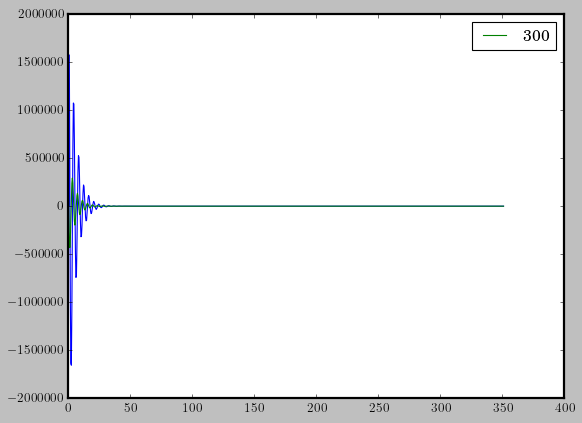

In [54]:
def get_field_solution(n_real, n_imaginary, pulse_data):

    # defining complex index of refraction (no imaginary yet)
    complex_refractive_index = complex(n_real, n_imaginary)
    complex_wavenumber = (angular_frequency / speed_of_light) * complex_refractive_index

    x = []  # spatial domain (can also think of as coordinates of grid points)
    t = []  # time domain

    # Creating arrays for the spatial and time domains. Starting at -2 in order to create ghost cells. And ending with + 3 for the same reason
    # The ghost cells are there so that in the matrix we can access all indeces
    # To append, using formula Dr. Woo gave me: X_i = delta_x(i + 1/2)
    for i in range(-2, n_cells + 3):
        x.append(delta_x * (i + 0.5))

    for i in range(-2, n_timestep + 3):
        t.append(delta_t * (i + 0.5))

    x = np.array(x)
    t = np.array(t)

    E_complex = 1j * np.zeros((len(t), len(x))) # initializing imaginary matrix of dimensions (t, x)
    r_const_complex = ( (delta_t/delta_x) * (speed_of_light/complex_refractive_index) ) ** 2 # our parameter

    # These loops will go through the grid. We start at 1 so as to not calculate the
    # value when the a time or spatial point is equal to 0.
    index = 0
    for n in range(1, (len(t) - ghost_cell_size)*1 + 0):
        
#         t_sim = t[n] # in seconds
        # CONFIRMED WITH JACK 09/24
        ite_I0 = get_I0(t[n], pulse_data)
        E_0 = np.sqrt( (2 * ite_I0) / (speed_of_light * RefractiveIndex * permittivity_free_space)) # Electric field SI unit is voltage / m
        
        # Defining cos and sin terms for wave to later be turned into complex numbers for t_nm1
        # Making sin zero because it is imaginary component
        cos_term_0_t_nm1 = E_0 * np.cos((wavenumber * x[0]) - (angular_frequency * t[n-1]) + np.pi/2)
        sin_term_0_t_nm1 = 0

        cos_term_1_t_nm1 = E_0 * np.cos((wavenumber * x[1]) - (angular_frequency * t[n-1]) + np.pi/2)
        sin_term_1_t_nm1 = 0

        # Initial conditions in time:
        E_complex[n-1, 0] = complex(cos_term_0_t_nm1, sin_term_0_t_nm1)
        E_complex[n-1, 1] = complex(cos_term_1_t_nm1, sin_term_1_t_nm1)


        # Defning cos and sin terms for wave to later be turned into complex numbers for t_n
        # Making sin zero because it is imaginary component
        cos_term_0_t_n = E_0 * np.cos((wavenumber * x[0]) - (angular_frequency * t[n]) + np.pi/2)
        sin_term_0_t_n = 0

        cos_term_1_t_n = E_0 * np.cos((wavenumber * x[1]) - (angular_frequency * t[n]) + np.pi/2)
        sin_term_1_t_n = 0

        # Instantenously defining the boundary conditions/values of ghost cells on the RIGHT:
        E_complex[n, 0] = complex(cos_term_0_t_n, sin_term_0_t_n)
        E_complex[n, 1] = complex(cos_term_1_t_n, sin_term_1_t_n)

        # We have no laser on the left, so boundary conditions are just 0
        E_complex[n, -1] = complex(0)
        E_complex[n, -2] = complex(0)

        for i in range(2, len(x) - ghost_cell_size):

            # explicit scheme
            E_complex[n+1, i] = np.exp(-complex_wavenumber.imag * x[i]) * ( (r_const_complex.real) * ( E_complex[n, i+1] - 2*E_complex[n, i] + E_complex[n, i-1] ) - ( -2*E_complex[n, i] + E_complex[n-1, i] ) )

            # this if block constrains the wave to inside our physical bounds
            if (True) and abs(E_complex[n+1, i])/abs(E_0) > 1:
                E_complex[n+1, i] = E_0 * np.sign(E_complex[n, i])

            index += 1
            
    return E_complex, x, t # units for Electric field in volts/m, x = nm, t = seconds

# This is getting the value of solving the field solution with real index of refrac of 1 and imaginary index of refrac of 0
E_complex_non_damped = get_field_solution(1, 0, pulse_1)

# re-defining complex index of refraction (prepping to add imaginary part to force damping using analytical solution)
n_real = 1
n_i = 0.125
complex_refractive_index = complex(n_real, n_i)
complex_wavenumber = (angular_frequency / speed_of_light) * complex_refractive_index
E_complex_data = E_complex_non_damped[0]
E_complex_data_xdata = E_complex_non_damped[1]
E_complex_data_tdata = E_complex_non_damped[2]
t_data_size = E_complex_data_tdata.shape[0]

# format_title = "{} Cycles Complex Model".format(lambda_mult)
# plt.title(format_title)
# plt.xlabel("Position in system (nm)") # in entire simulation domain. Units of 10 ** -9 meters in SI units
# plt.ylabel("Electric field amplitude (V/m)") # SI unit of volts / m

# Plotting the solution with complex information

plt.plot(np.linspace(0, wavelength / nm, E_complex_data_xdata.shape[0]), np.exp(-complex_wavenumber.imag * E_complex_data_xdata) * E_complex_data[int(t_data_size - 3), :].real)

# plt.plot(np.linspace(0, wavelength / nm, E_complex_data_xdata.shape[0]), np.exp(-complex_wavenumber.imag * E_complex_data_xdata) * E_complex_data[100, :].real, label = "100")

# plt.plot(np.linspace(0, wavelength / nm, E_complex_data_xdata.shape[0]), np.exp(-complex_wavenumber.imag * E_complex_data_xdata) * E_complex_data[200, :].real, label = "200")

plt.plot(np.linspace(0, wavelength / nm, E_complex_data_xdata.shape[0]), np.exp(-complex_wavenumber.imag * E_complex_data_xdata) * E_complex_data[300, :].real, label = "300")


plt.legend()

print("E_complex_data", E_complex_data.shape)

print("Damped", (np.exp(-complex_wavenumber.imag * E_complex_data_xdata) * E_complex_data.real).shape)

# Let people know that absorption coeffecient will depend on (rho, T). Complex wavefunction is a function of material properties.
# Heat up material then molecules vibrate more. Vibration will interact with electric field. E field will interact with free electrons
# in material. Density and temperature in real life will effect. n will be function on material. We will assume to be constant and equal for solution.
# Assumptions for testing. 


# Setting the x-axis to 1-10
# and y-axis to 1-15
# plt.axis([0, 200, -2*(10**8), 2*(10**8)])
# plt.plot(np.exp(-complex_wavenumber.imag * E_complex_data_xdata) * E_complex_data[int(int(E_complex_data.shape[0]/lambda_mult) * lambda_mult), :].real)
# plt.plot(np.linspace(0, wavelength / nm, E_complex_data_xdata.shape[0]), np.exp(-complex_wavenumber.imag * E_complex_data_xdata) * E_complex_data[int(401), :].real)
# plt.plot(np.exp(-complex_wavenumber.imag * E_complex_data_xdata) * E_complex_data[int(int(250/lambda_mult) * lambda_mult), :].real)
# plt.show()
# print(E_complex_data[t_data_size-3][:-1])

#Laser intensity from field solution is going to use the last non-zero value of E_complex_data.

# S_xt_ = -2 * complex_wavenumber * laser_intensity

## get_collisional_damping

Takes in input from E_complex solution and adds damping factor. Return damped wave.

In [55]:
def get_collisional_damping(E_complex_data, E_complex_data_xdata, complex_wavenumber):
    E_complex_damped_data = np.exp(-complex_wavenumber.imag * E_complex_data_xdata) * E_complex_data.real
    
    return E_complex_damped_data # in same dimension as E_complex_data in space and time.

## get_laser_intensity

In [56]:
# complex_wavenumber = (angular_frequency / speed_of_light) * complex_refractive_index
# E_complex_damped_data = get_collisional_damping(E_complex_data, E_complex_data_xdata, complex_wavenumber)

def get_laser_intensity(speed_of_light, n_real, permittivity_free_space, E_complex_damped_data):
    field_solution_laser_intensity = (speed_of_light * n_real * permittivity_free_space)/2 * (E_complex_damped_data.real)**2 #unit is in Watts
    
    return field_solution_laser_intensity # this is a 2d array in Watts/m^2



# field_solution_laser_intensity = (speed_of_light * n_real * permittivity_free_space)/2 * \
# (E_comex_damped_data[t_data_size-3][-(ghost_cell_size + 1)].real)**2

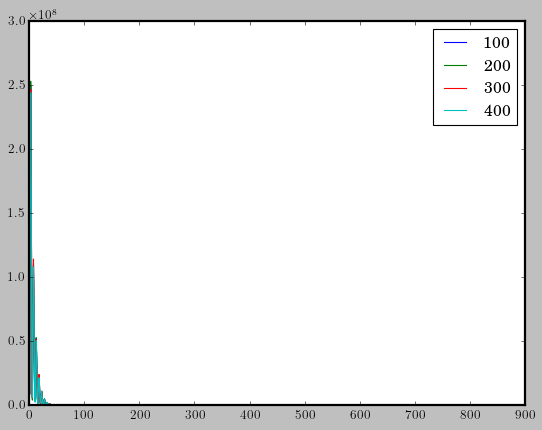

In [57]:
E_complex_damped_data = get_collisional_damping(E_complex_data, E_complex_data_xdata, complex_wavenumber)

field_solution_laser_intensity = get_laser_intensity(speed_of_light, n_real, permittivity_free_space, E_complex_damped_data)

plt.plot(field_solution_laser_intensity[100, :], label = "100")
plt.plot(field_solution_laser_intensity[200, :], label = "200")
plt.plot(field_solution_laser_intensity[300, :], label = "300")
plt.plot(field_solution_laser_intensity[400, :], label = "400")
plt.legend()

## get_main

In [58]:
# Confirmed with Jack 09/01 no need to change
# Thickness is now used in the field_solution_parameters
# Thickness = 30 # um
# Nz = int(Thickness*um/wavelength_355nm)
# dz = wavelength_355nm # m
# dt = dz/lightSpeed*10 # s

# Confirmed with Jack 09/24
Nz = n_cells  # unitless n_cells = int(L/delta_x)
dz = delta_x # in meters
dt = delta_t # in seconds

# Confirmed with Jack 09/01 no need to change
# Probe beam has a longer wavelength without heating material but will get a response. Does not carry any physics.
# Confirmed laserI no change on 09/24 by Jack
laserI_probe_INC = probe_intensity # W/m^2 # laser intensity of probe pulse
alpha        = 10**(14)  # 1/s # rate of impact ionization
taur         = 10**(-12)*1000 # s   # electron recombination
nc_355nm     = get_nc(wavelength_355nm) # (1/m^3)
nc_450nm     = get_nc(wavelength_450nm) # (1/m^3)

# Confirmed with Jack 09/01 no need to change
Ns_zone  = 6
Ns_edge  = 4
var_zone = np.zeros([Nz,Ns_zone])
print('Nz', Nz)
print('var_zone[0,0]', var_zone[0,0])
print('var_zone[0,0:2]', var_zone[0,0:2])

# Confirmed with Jack 09/01 no need to change
n_0 = 10**10*100**3 # 1/m^3 
n_1 = 0             # 1/m^3 
n_2 = 0             # 1/m^3 
Te  = 0.025*eV # J
Ti  = 0.025*eV # J

# Confirmed with Jack 09/01 no need to change
var_zone[:,0] = n_0 # 1/m^3 
var_zone[:,1] = n_1 # 1/m^3 
var_zone[:,2] = n_2 # 1/m^3
var_zone[:,3] = Te  # J
var_zone[:,4] = Ti  # J

# Confirmed with Jack 09/01 no need to change
t_start_wall = timeCheck.time()
hist         = []

# Confirmed with Jack 09/01 no need to change
pulse_IN = pulse_1
pulse_IN_Imax_TimePs = pulse_1_Imax_TimePs

time_n       = 0 # time_n is a variable made to match n in my E_complex_data
time         = 0                         # s
time_step    = 0

# Define laser intentisities at different point in laser pulse.
# t1, t2, t3... but t1 ans t2 have a big gap, so we need to go through a lot of small delta_t which are time_step.
for time_step in range(pulse_IN.shape[0]*1):
    
    
    # insert some subroutine to do laser intensity calculation
    # use this laser intensity in my code
    # Confirmed with Jack 09/01 no need to change
    # Incidence that provides boudnary condition for my electric field.
    # So in my code, I will use laser_E_INC to propagate E. Sinusoidal is for amplitude boundary conditions.
    # Confirmed with Jack 09/01 no need to change
    laserI_INC   = pulse_IN[time_step,1]      # W/m^2
    laserE_INC   = get_laserE(laserI_INC,1)   # V/m with RefractiveIndex = 1. Converts I to E.
    
    # Confirmed with Jack 09/01 no change needed
    time_current = pulse_IN[time_step,0]*ns   # s
    time_next    = pulse_IN[time_step+1,0]*ns # s
    ite_max      = int((time_next - time_current)/dt)
    
    # Confirmed with Jack 09/01 no change needed
    ne_IN  = sum(var_zone[0,0:2])  # 1/m^3
    ne_OUT = sum(var_zone[-1,0:2]) # 1/m^3
    n_IN     = get_n(ne_IN,omega_355nm)  # unitless
    n_OUT    = get_n(ne_OUT,omega_355nm) # unitless 
    Te_IN    = var_zone[0,3]  # J
    Te_OUT   = var_zone[-1,3] # J 
    Ti_IN    = var_zone[0,4]  # J
    Ti_OUT   = var_zone[-1,4] # J     
    vc_IN    = get_vc_new(Te_IN,Ti_IN,ne_IN,n_a_CH,R_CH)   # 1/s
    vc_OUT   = get_vc_new(Te_OUT,Ti_OUT,ne_OUT,n_a_CH,R_CH)# 1/s    
    dU_IN, si_IN   = get_JH(ne_IN,vc_IN,omega_355nm,laserE,n_IN)
    dU_OUT, si_OUT = get_JH(ne_OUT,vc_OUT,omega_355nm,laserE,n_OUT) 
    Z_IN  = ne_IN/n_a_CH
    Z_OUT = ne_OUT/n_a_CH
    Z_QMD_IN  = get_Zeff(n_a_CH,Te_IN)
    Z_QMD_OUT = get_Zeff(n_a_CH,Te_OUT)

    print('time_step    = ',time_step)    
    print('time         = ',"{:.3e}".format(time/ps),' ps')
    print('time_current = ',"{:.3e}".format(time_current/ps),' ps')
    print('time_next    = ',"{:.3e}".format(time_next/ps),' ps')
    print('dt           = ',"{:.3e}".format(dt),' s')
    print('Te_IN, Te_OUT = ',"{:.3e}".format(Te_IN/eV),"{:.3e}".format(Te_OUT/eV),'eV')
    print('Ti_IN, Ti_OUT = ',"{:.3e}".format(Ti_IN/eV),"{:.3e}".format(Ti_OUT/eV),'eV') 
    print('ne_IN, ne_OUT = ',"{:.3e}".format(ne_IN),"{:.3e}".format(ne_OUT),'1/m^3')
    print('vc_IN, vc_OUT = ',"{:.3e}".format(vc_IN),"{:.3e}".format(vc_OUT),'1/s')
    print('dU_IN, dU_OUT = ',"{:.3e}".format(dU_IN),"{:.3e}".format(dU_OUT),'J/s/m^3') 
    print('si_IN, si_OUT = ',"{:.3e}".format(si_IN),"{:.3e}".format(si_OUT),'1/m') 
    print('Z_IN,  Z_OUT  = ',"{:.3e}".format(Z_IN),"{:.3e}".format(Z_OUT)) 
    print('Z_QMD_IN,Z_QMD_OUT = ',"{:.3e}".format(Z_QMD_IN),"{:.3e}".format(Z_QMD_OUT))
    print('Te_max        = ',"{:.3e}".format(max(var_zone[:,3])/eV),'eV')
    print('Ti_max        = ',"{:.3e}".format(max(var_zone[:,4])/eV),'eV')    
    print('ite_max       = ',ite_max)    
    
    # this for loop is summing all ite_max until we get to next time
    # t1 and t2 have a big gap, but we define delta_t by ourselves to satisfy current condition
    # delta_t for wave solution is very small and less than speed of light.
    # when we run field solution until summation of all delta_t is big enough to go into next time step.
    # t1 + sigma(delta_t) -> t2
    # this gives the real time, to match mine I need to use time_n to count the summations
    for ite in range(ite_max):
        
        # Confirmed with Jack 09/01 no need to change
        n_fe_max = np.max(var_zone[:,0]+var_zone[:,1]+var_zone[:,2]) # 1/m^3
        Te_max   = np.max(var_zone[:,3]) # J
        Ti_max   = np.max(var_zone[:,4]) # J
        
        # Confirmed with Jack 09/01 no need to change
        # Summarize: we get incident E from existing code and what I need to provide is inside propagation.
        # make no changes for E_IN which provides boundary condition for amplitude.
        # IF I see INC, no change.
        laserI        = laserI_INC       # W/m^2     
        laserI_probe  = laserI_probe_INC # W/m^2
        laserE        = laserE_INC       # V/m   
        var_edge      = np.zeros([Nz+1,Ns_edge])
        var_edge[0,0] = 0      # m
        var_edge[0,1] = laserI # W/m^2
        var_edge[0,2] = laserE # V/m
        var_edge[0,3] = laserI_probe # W/m^2
        
#         if 0 : 
#             print()
#             print('ite, time, n_fe_max, transimittance = ',
#                   ite,
#                   "{:.3e}".format(time),
#                   "{:.3e}".format(n_fe_max),
#                   "{:.3e}".format(laserI_probe/laserI_probe_INC),
#                   "{:.3e}".format(laserI/laserI_INC))
#             print('---')        
        
        # space loop
        for zone in range(1,Nz+1):
            # defines position
            # Confirmed with Jack 09/01 no need to change
            i_zone = zone - 1 
            zp     = zone*dz     # m
            zm     = (zone-1)*dz # m
            x_i = i_zone # to match the i_index for space in E_complex_data
            
            # Confirmed with Jack 09/01 no need to change
            n_0 = var_zone[i_zone,0] # 1/m^3
            n_1 = var_zone[i_zone,1] # 1/m^3
            n_2 = var_zone[i_zone,2] # 1/m^3
            Te  = var_zone[i_zone,3] # J
            Ti  = var_zone[i_zone,4] # J  
            
            # Confirmed with Jack 09/01 no need to change
            n_fe  = n_0 + n_1 + n_2          # 1/m^3
            beta  = (n_vb_CH - n_fe)/n_vb_CH # no unit
            n_old = [n_0, n_1, n_2]          # 1/m^3   
            #####################################            
            #vc_OLD  = get_vc(Te/eV,Ti/eV,n_fe,n_a_CH,1)               # 1/s
            # Confirmed with Jack 09/01 no need to change
            vc      = get_vc_new(Te,Ti,n_fe,n_a_CH,R_CH)# 1/s
            #vr      = get_vr(n_fe,Te) # 1/s
            #taur    = 1/vr # s
            #alpha   = get_vi(laserE,omega_355nm,Eg_CH,vc) # 1/s
            #####################################
            # Confirmed with Jack 09/01 no need to change
            n       = get_n(n_fe,omega_355nm) # unitless  
            n_probe = get_n(n_fe,omega_450nm) # unitless     
            
            # provide laserE and laserE_probe
            # Confirmed with Jack 09/01 no need to change
            laserE       = get_laserE(laserI,n)             # V/m         
            laserE_probe = get_laserE(laserI_probe,n_probe) # V/m 
            
            # Confirmed with Jack 09/01 no need to change
            Nmax      = 50
            WPI       = get_WPI(laserI,laserE,Nmax,omega_355nm,Eg_CH) # 1/(s.m^3)
            W1        = get_W1(laserE) # 1/s
            WPI_probe = get_WPI(laserI_probe,laserE_probe,Nmax,omega_450nm,Eg_CH) #1/(s.m^3)     
            dUdt_JH, sigma_JH       = get_JH(n_fe,vc,omega_355nm,laserE,n)
            dUdt_probe, sigma_probe = get_JH(n_fe,vc,omega_450nm,laserE_probe,n_probe) 
            
            #######################
            # Field propagation solution
            #######################   
            # REPLACE THIS PART. In order to parallel, provide laserI_new and probe new from my code.
            # module from my code.
#             dIdz             = - sigma_JH    * laserI       - WPI       * Eg_CH
            dIdz_probe       = - sigma_probe * laserI_probe - WPI_probe * Eg_CH
#             laserI_new       = laserI       + dz * dIdz
#             laserI_probe_new = laserI_probe + dz * dIdz_probe
            #Light Propagation (Ray tracing procedure) ^
    
            # NEED TO CHANGE. CONFIRMED 09/01 CHANGE. NEED FIELD SOLUTION.
            # AS A FUNCTION OF TIME AND SPACE (t, x)
            # call get_field_solution
            # I need to get intesnity. For my code I get E, but I report I for Jack's code.
            
            # THIS IS THE ONLY PLACE I MADE A CHANGE BY MYSELF - NICK
            
            # WIll first consider both to be the same, but later will change.
            # WILL NOT INTERACT WITH PROBE BEAM FOR NOW! IGNORE FOR NOW!
            # CONFIRMED CORRECTION WITH JACK 09/24
            # field_solution_laser_intensity is a 2d array with dimensions of time and space
            laserI_new = field_solution_laser_intensity[time_n, x_i] # in SI units Joule/(s/m^2)
            laserI_probe_new = laserI_probe + dz * dIdz_probe
#             laserI_probe_new = field_solution_laser_intensity # in SI units Joule/(s/m^2)
            
            # Confirmed with Jack 09/01 no need to change
            var_edge[zone,0] = zp                       # m
            var_edge[zone,1] = laserI_new               # W/m^2
            var_edge[zone,2] = get_laserE(laserI_new,n) # V/m
            var_edge[zone,3] = laserI_probe_new         # W/m^2 

            #######################
            # Electron Dynamics
            #######################
            # Confirmed with Jack 09/01 no need to change
            source = [beta*WPI,0,0]                             # 1/s/m^3
            row1   = [-1/taur-W1,0,         2*alpha*beta      ] # 1/s
            row2   = [W1        ,-1/taur-W1,0                 ] # 1/s
            row3   = [0,        W1,         -1/taur-alpha*beta] # 1/s
            matrix = [row1, row2, row3]                         # 1/s
            n_new  = n_old + dt * (source + np.dot(matrix,n_old)) # 1/m^3
            n_0_new, n_1_new, n_2_new = n_new       # 1/m^3       
            n_fe_new = n_0_new + n_1_new + n_2_new  # 1/m^3
            dn_fe    = n_fe_new - n_fe              # 1/m^3
            
            # Confirmed with Jack 09/01 no need to change
            var_zone[i_zone,0] = n_0_new # 1/m^3 
            var_zone[i_zone,1] = n_1_new # 1/m^3 
            var_zone[i_zone,2] = n_2_new # 1/m^3 

            #######################
            # Thermodynamics
            #######################
            #####################################
            #vc =  get_vc(Te,Ti,n_fe_new,n_a_CH,1) # 1/s 
            print("Te",Te,"Ti",Ti, "n_fe", n_fe, "n_a_CH", n_a_CH, "R_CH", R_CH)
            
            # Confirmed with Jack 09/01 no need to change
            vc = get_vc_new(Te,Ti,n_fe,n_a_CH,R_CH)# 1/s
            
            #print('ite,vc = ',ite,vc)
            #####################################
            # Confirmed with Jack 09/01 no need to change
            dUdt_JH, sigma_JH = get_JH(n_fe_new,vc,omega_355nm,laserE,n)
            Ce = get_Ce(n_fe_new) # 1/m^3
            Ci = get_Ci_new(n_a_CH,Ti)   # 1/m^3 
            G  = get_G(Ce,vc,Ti)     # 1/m^3/s
            #if Te <  Tc : G  = get_G(Ce,vc,'solid')     # 1/m^3/s
            #if Te >= Tc : G  = get_G(Ce,vc,'plasma')    # 1/m^3/s
            Qi = G*(Te-Ti)                             # J/s/m^3
            Qe = dUdt_JH - 1.5*Te*dn_fe/dt - G*(Te-Ti) # J/s/m^3            
            Te_new = Te + Qe*dt/Ce # eV
            Ti_new = Ti + Qi*dt/Ci # eV     
            
            # Confirmed with Jack 09/01 no need to change
            var_zone[i_zone,3] = Te_new  # eV
            var_zone[i_zone,4] = Ti_new  # eV 
            
            # Confirmed with Jack 09/01 no need to change
            laserI       = laserI_new
            laserI_probe = laserI_probe_new

            if (n_0_new < 0) or (n_1_new < 0) or (n_2_new < 0) :
                print('negative n_0, n_1, n_2 detected, STOP')
                break

            if (Te_new < 0) or (Ti_new < 0) :
                print('negative Te, Ti detected, STOP')
                print('Qe = ',Qe)
                break 

            if (laserI_new < 0) or (laserI_probe_new < 0) :
                print('negative laserI, laserI_probe detected, STOP')
                break 

            if (n_fe_new > nc_355nm) or (n_fe_new > nc_450nm) :
                print('negative n_fe exceed nc detected, STOP')
                break             

            #print(zone,laserI/laserI_INC)
            #print(zone,"{:.3e}".format(laserI_probe),"{:.3e}".format(laserI_probe_INC))
            #print(zone,laserI,laserI_new,laserI_probe,laserI_probe_new)
            #print(zone,"{:.3e}".format(n_0_new),"{:.3e}".format(n_1_new),"{:.3e}".format(n_2_new),
            #      ' : ',"{:.3e}".format(n_0),"{:.3e}".format(n_1),"{:.3e}".format(n_2))
            #print(zone,time,Te_new,Ti_new,' : ',Te,Ti)
            #print(zone,"{:.3e}".format(zp),"{:.3e}".format(time))
            
        time = time + dt 
        time_n = time_n + 1 # this will be time in field solution. Counter to count over summation of dt.
                    
    sol = [ne_IN,#0
           ne_OUT,#1
           n_IN,#2
           n_OUT,#3
           Te_IN,#4
           Te_OUT,#5
           vc_IN,#6
           vc_OUT,#7
           dU_IN,#8
           dU_OUT,#9
           si_IN,#10
           si_OUT,#11
           Ti_IN,#12
           Ti_OUT,#13 
           Z_IN,#14
           Z_OUT,#15
           Z_QMD_IN,#16
           Z_QMD_OUT#17           
          ]
        
    hist.append([time,#0
                 laserI_probe/laserI_probe_INC,#1
                 laserI/laserI_INC,#2
                 var_zone,#3
                 var_edge,#4
                 sol#5
                ])
        
    t_end_wall = timeCheck.time()
    print('Ray propagation completed in time_step : ',time_step)    
    print('t_end_wall - t_start_wall = ',int((t_end_wall-t_start_wall)/60),' minutes')
    print('time_ps,transimittance for probe and pump = ',
          "{:.3e}".format(time_current/ps-pulse_IN_Imax_TimePs),
          "{:.3e}".format(laserI_probe/laserI_probe_INC),
          "{:.3e}".format(laserI/laserI_INC))
    print('---')      
    
hist = np.array(hist)    

Nz 854
var_zone[0,0] 0.0
var_zone[0,0:2] [0. 0.]
INSIDE get_vc_ion
ne 1e+16 Te 4.0000000000000004e-21
Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 ne 1e+16 ni 30000000000000000000000000000 degeneracy 1
INSIDE get_vc_ion
ne 1e+16 Te 4.0000000000000004e-21
Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 ne 1e+16 ni 30000000000000000000000000000 degeneracy 1
time_step    =  0
time         =  0.000e+00  ps
time_current =  0.000e+00  ps
time_next    =  5.000e+00  ps
dt           =  5.854e-17  s
Te_IN, Te_OUT =  2.500e-02 2.500e-02 eV
Ti_IN, Ti_OUT =  2.500e-02 2.500e-02 eV
ne_IN, ne_OUT =  1.000e+16 1.000e+16 1/m^3
vc_IN, vc_OUT =  1.486e+15 1.486e+15 1/s
dU_IN, dU_OUT =  5.924e+09 5.924e+09 J/s/m^3
si_IN, si_OUT =  5.196e-06 5.196e-06 1/m
Z_IN,  Z_OUT  =  3.333e-13 3.333e-13
Z_QMD_IN,Z_QMD_OUT =  1.183e-97 1.183e-97
Te_max        =  2.500e-02 eV
Ti_max        =  2.500e-02 eV
ite_max       =  85410
INSIDE get_vc_ion
ne 1e+16 Te 4.0000000000000004e-21
Te 4.0000000000000004e-21 Ti 

C:\Users\nickd\AppData\Local\Temp\ipykernel_18796\171987138.py:92: RuntimeWarning: divide by zero encountered in scalar divide
  gamma = omega_IN*math.sqrt(massElectronReduced*bangGap)/(eCharge*laserE)
C:\Users\nickd\AppData\Local\Temp\ipykernel_18796\171987138.py:93: RuntimeWarning: invalid value encountered in scalar divide
  gamma1 = gamma/(1+gamma**2)**0.5
C:\Users\nickd\AppData\Local\Temp\ipykernel_18796\171987138.py:12: IntegrationWarning: Extremely bad integrand behavior occurs at some points of the
  integration interval.
  phi = integrate.quad(integrand, 0, z)
C:\Users\nickd\AppData\Local\Temp\ipykernel_18796\1461397733.py:17: RuntimeWarning: invalid value encountered in scalar divide
  sigma = dUdt/(laserE**2)/(lightSpeed*RefractiveIndex*vacuumPermittivity) # 1/m


INSIDE get_vc_ion
ne 1e+16 Te 4.0000000000000004e-21
Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 ne 1e+16 ni 30000000000000000000000000000 degeneracy 1
Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 n_fe 1e+16 n_a_CH 30000000000000000000000000000 R_CH 1030.0
INSIDE get_vc_ion
ne 1e+16 Te 4.0000000000000004e-21
Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 ne 1e+16 ni 30000000000000000000000000000 degeneracy 1
INSIDE get_vc_ion
ne 1e+16 Te 4.0000000000000004e-21
Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 ne 1e+16 ni 30000000000000000000000000000 degeneracy 1
Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 n_fe 1e+16 n_a_CH 30000000000000000000000000000 R_CH 1030.0
INSIDE get_vc_ion
ne 1e+16 Te 4.0000000000000004e-21
Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 ne 1e+16 ni 30000000000000000000000000000 degeneracy 1
INSIDE get_vc_ion
ne 1e+16 Te 4.0000000000000004e-21
Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 ne 1e+16 ni 3000000000000000000

Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 n_fe 1e+16 n_a_CH 30000000000000000000000000000 R_CH 1030.0
INSIDE get_vc_ion
ne 1e+16 Te 4.0000000000000004e-21
Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 ne 1e+16 ni 30000000000000000000000000000 degeneracy 1
INSIDE get_vc_ion
ne 1e+16 Te 4.0000000000000004e-21
Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 ne 1e+16 ni 30000000000000000000000000000 degeneracy 1
Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 n_fe 1e+16 n_a_CH 30000000000000000000000000000 R_CH 1030.0
INSIDE get_vc_ion
ne 1e+16 Te 4.0000000000000004e-21
Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 ne 1e+16 ni 30000000000000000000000000000 degeneracy 1
INSIDE get_vc_ion
ne 1e+16 Te 4.0000000000000004e-21
Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 ne 1e+16 ni 30000000000000000000000000000 degeneracy 1
Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 n_fe 1e+16 n_a_CH 30000000000000000000000000000 R_CH 1030.0
INSIDE get_vc_ion
ne 1e+

Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 n_fe 1e+16 n_a_CH 30000000000000000000000000000 R_CH 1030.0
INSIDE get_vc_ion
ne 1e+16 Te 4.0000000000000004e-21
Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 ne 1e+16 ni 30000000000000000000000000000 degeneracy 1
INSIDE get_vc_ion
ne 1e+16 Te 4.0000000000000004e-21
Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 ne 1e+16 ni 30000000000000000000000000000 degeneracy 1
Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 n_fe 1e+16 n_a_CH 30000000000000000000000000000 R_CH 1030.0
INSIDE get_vc_ion
ne 1e+16 Te 4.0000000000000004e-21
Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 ne 1e+16 ni 30000000000000000000000000000 degeneracy 1
INSIDE get_vc_ion
ne 1e+16 Te 4.0000000000000004e-21
Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 ne 1e+16 ni 30000000000000000000000000000 degeneracy 1
Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 n_fe 1e+16 n_a_CH 30000000000000000000000000000 R_CH 1030.0
INSIDE get_vc_ion
ne 1e+

INSIDE get_vc_ion
ne 1e+16 Te 4.0000000000000004e-21
Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 ne 1e+16 ni 30000000000000000000000000000 degeneracy 1
Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 n_fe 1e+16 n_a_CH 30000000000000000000000000000 R_CH 1030.0
INSIDE get_vc_ion
ne 1e+16 Te 4.0000000000000004e-21
Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 ne 1e+16 ni 30000000000000000000000000000 degeneracy 1
INSIDE get_vc_ion
ne 1e+16 Te 4.0000000000000004e-21
Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 ne 1e+16 ni 30000000000000000000000000000 degeneracy 1
Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 n_fe 1e+16 n_a_CH 30000000000000000000000000000 R_CH 1030.0
INSIDE get_vc_ion
ne 1e+16 Te 4.0000000000000004e-21
Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 ne 1e+16 ni 30000000000000000000000000000 degeneracy 1
INSIDE get_vc_ion
ne 1e+16 Te 4.0000000000000004e-21
Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 ne 1e+16 ni 3000000000000000000

Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 n_fe 1e+16 n_a_CH 30000000000000000000000000000 R_CH 1030.0
INSIDE get_vc_ion
ne 1e+16 Te 4.0000000000000004e-21
Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 ne 1e+16 ni 30000000000000000000000000000 degeneracy 1
INSIDE get_vc_ion
ne 1e+16 Te 4.0000000000000004e-21
Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 ne 1e+16 ni 30000000000000000000000000000 degeneracy 1
Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 n_fe 1e+16 n_a_CH 30000000000000000000000000000 R_CH 1030.0
INSIDE get_vc_ion
ne 1e+16 Te 4.0000000000000004e-21
Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 ne 1e+16 ni 30000000000000000000000000000 degeneracy 1
INSIDE get_vc_ion
ne 1e+16 Te 4.0000000000000004e-21
Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 ne 1e+16 ni 30000000000000000000000000000 degeneracy 1
Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 n_fe 1e+16 n_a_CH 30000000000000000000000000000 R_CH 1030.0
INSIDE get_vc_ion
ne 1e+

Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 n_fe 1e+16 n_a_CH 30000000000000000000000000000 R_CH 1030.0
INSIDE get_vc_ion
ne 1e+16 Te 4.0000000000000004e-21
Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 ne 1e+16 ni 30000000000000000000000000000 degeneracy 1
INSIDE get_vc_ion
ne 1e+16 Te 4.0000000000000004e-21
Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 ne 1e+16 ni 30000000000000000000000000000 degeneracy 1
Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 n_fe 1e+16 n_a_CH 30000000000000000000000000000 R_CH 1030.0
INSIDE get_vc_ion
ne 1e+16 Te 4.0000000000000004e-21
Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 ne 1e+16 ni 30000000000000000000000000000 degeneracy 1
INSIDE get_vc_ion
ne 1e+16 Te 4.0000000000000004e-21
Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 ne 1e+16 ni 30000000000000000000000000000 degeneracy 1
Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 n_fe 1e+16 n_a_CH 30000000000000000000000000000 R_CH 1030.0
INSIDE get_vc_ion
ne 1e+

Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 n_fe 1e+16 n_a_CH 30000000000000000000000000000 R_CH 1030.0
INSIDE get_vc_ion
ne 1e+16 Te 4.0000000000000004e-21
Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 ne 1e+16 ni 30000000000000000000000000000 degeneracy 1
INSIDE get_vc_ion
ne 1e+16 Te 4.0000000000000004e-21
Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 ne 1e+16 ni 30000000000000000000000000000 degeneracy 1
Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 n_fe 1e+16 n_a_CH 30000000000000000000000000000 R_CH 1030.0
INSIDE get_vc_ion
ne 1e+16 Te 4.0000000000000004e-21
Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 ne 1e+16 ni 30000000000000000000000000000 degeneracy 1
INSIDE get_vc_ion
ne 1e+16 Te 4.0000000000000004e-21
Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 ne 1e+16 ni 30000000000000000000000000000 degeneracy 1
Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 n_fe 1e+16 n_a_CH 30000000000000000000000000000 R_CH 1030.0
INSIDE get_vc_ion
ne 1e+

Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 n_fe 1e+16 n_a_CH 30000000000000000000000000000 R_CH 1030.0
INSIDE get_vc_ion
ne 1e+16 Te 4.0000000000000004e-21
Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 ne 1e+16 ni 30000000000000000000000000000 degeneracy 1
INSIDE get_vc_ion
ne 1e+16 Te 4.0000000000000004e-21
Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 ne 1e+16 ni 30000000000000000000000000000 degeneracy 1
Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 n_fe 1e+16 n_a_CH 30000000000000000000000000000 R_CH 1030.0
INSIDE get_vc_ion
ne 1e+16 Te 4.0000000000000004e-21
Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 ne 1e+16 ni 30000000000000000000000000000 degeneracy 1
INSIDE get_vc_ion
ne 1e+16 Te 4.0000000000000004e-21
Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 ne 1e+16 ni 30000000000000000000000000000 degeneracy 1
Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 n_fe 1e+16 n_a_CH 30000000000000000000000000000 R_CH 1030.0
INSIDE get_vc_ion
ne 1e+

Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 n_fe 1e+16 n_a_CH 30000000000000000000000000000 R_CH 1030.0
INSIDE get_vc_ion
ne 1e+16 Te 4.0000000000000004e-21
Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 ne 1e+16 ni 30000000000000000000000000000 degeneracy 1
INSIDE get_vc_ion
ne 1e+16 Te 4.0000000000000004e-21
Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 ne 1e+16 ni 30000000000000000000000000000 degeneracy 1
Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 n_fe 1e+16 n_a_CH 30000000000000000000000000000 R_CH 1030.0
INSIDE get_vc_ion
ne 1e+16 Te 4.0000000000000004e-21
Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 ne 1e+16 ni 30000000000000000000000000000 degeneracy 1
INSIDE get_vc_ion
ne 1e+16 Te 4.0000000000000004e-21
Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 ne 1e+16 ni 30000000000000000000000000000 degeneracy 1
Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 n_fe 1e+16 n_a_CH 30000000000000000000000000000 R_CH 1030.0
INSIDE get_vc_ion
ne 1e+

Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 n_fe 1e+16 n_a_CH 30000000000000000000000000000 R_CH 1030.0
INSIDE get_vc_ion
ne 1e+16 Te 4.0000000000000004e-21
Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 ne 1e+16 ni 30000000000000000000000000000 degeneracy 1
INSIDE get_vc_ion
ne 1e+16 Te 4.0000000000000004e-21
Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 ne 1e+16 ni 30000000000000000000000000000 degeneracy 1
Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 n_fe 1e+16 n_a_CH 30000000000000000000000000000 R_CH 1030.0
INSIDE get_vc_ion
ne 1e+16 Te 4.0000000000000004e-21
Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 ne 1e+16 ni 30000000000000000000000000000 degeneracy 1
INSIDE get_vc_ion
ne 1e+16 Te 4.0000000000000004e-21
Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 ne 1e+16 ni 30000000000000000000000000000 degeneracy 1
Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 n_fe 1e+16 n_a_CH 30000000000000000000000000000 R_CH 1030.0
INSIDE get_vc_ion
ne 1e+

INSIDE get_vc_ion
ne 1e+16 Te 4.0000000000000004e-21
Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 ne 1e+16 ni 30000000000000000000000000000 degeneracy 1
Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 n_fe 1e+16 n_a_CH 30000000000000000000000000000 R_CH 1030.0
INSIDE get_vc_ion
ne 1e+16 Te 4.0000000000000004e-21
Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 ne 1e+16 ni 30000000000000000000000000000 degeneracy 1
INSIDE get_vc_ion
ne 1e+16 Te 4.0000000000000004e-21
Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 ne 1e+16 ni 30000000000000000000000000000 degeneracy 1
Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 n_fe 1e+16 n_a_CH 30000000000000000000000000000 R_CH 1030.0
INSIDE get_vc_ion
ne 1e+16 Te 4.0000000000000004e-21
Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 ne 1e+16 ni 30000000000000000000000000000 degeneracy 1
INSIDE get_vc_ion
ne 1e+16 Te 4.0000000000000004e-21
Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 ne 1e+16 ni 3000000000000000000

Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 n_fe 1e+16 n_a_CH 30000000000000000000000000000 R_CH 1030.0
INSIDE get_vc_ion
ne 1e+16 Te 4.0000000000000004e-21
Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 ne 1e+16 ni 30000000000000000000000000000 degeneracy 1
INSIDE get_vc_ion
ne 1e+16 Te 4.0000000000000004e-21
Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 ne 1e+16 ni 30000000000000000000000000000 degeneracy 1
Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 n_fe 1e+16 n_a_CH 30000000000000000000000000000 R_CH 1030.0
INSIDE get_vc_ion
ne 1e+16 Te 4.0000000000000004e-21
Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 ne 1e+16 ni 30000000000000000000000000000 degeneracy 1
INSIDE get_vc_ion
ne 1e+16 Te 4.0000000000000004e-21
Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 ne 1e+16 ni 30000000000000000000000000000 degeneracy 1
Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 n_fe 1e+16 n_a_CH 30000000000000000000000000000 R_CH 1030.0
INSIDE get_vc_ion
ne 1e+

Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 n_fe 1e+16 n_a_CH 30000000000000000000000000000 R_CH 1030.0
INSIDE get_vc_ion
ne 1e+16 Te 4.0000000000000004e-21
Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 ne 1e+16 ni 30000000000000000000000000000 degeneracy 1
INSIDE get_vc_ion
ne 1e+16 Te 4.0000000000000004e-21
Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 ne 1e+16 ni 30000000000000000000000000000 degeneracy 1
Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 n_fe 1e+16 n_a_CH 30000000000000000000000000000 R_CH 1030.0
INSIDE get_vc_ion
ne 1e+16 Te 4.0000000000000004e-21
Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 ne 1e+16 ni 30000000000000000000000000000 degeneracy 1
INSIDE get_vc_ion
ne 1e+16 Te 4.0000000000000004e-21
Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 ne 1e+16 ni 30000000000000000000000000000 degeneracy 1
Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 n_fe 1e+16 n_a_CH 30000000000000000000000000000 R_CH 1030.0
INSIDE get_vc_ion
ne 1e+

Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 n_fe 1e+16 n_a_CH 30000000000000000000000000000 R_CH 1030.0
INSIDE get_vc_ion
ne 1e+16 Te 4.0000000000000004e-21
Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 ne 1e+16 ni 30000000000000000000000000000 degeneracy 1
INSIDE get_vc_ion
ne 1e+16 Te 4.0000000000000004e-21
Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 ne 1e+16 ni 30000000000000000000000000000 degeneracy 1
Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 n_fe 1e+16 n_a_CH 30000000000000000000000000000 R_CH 1030.0
INSIDE get_vc_ion
ne 1e+16 Te 4.0000000000000004e-21
Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 ne 1e+16 ni 30000000000000000000000000000 degeneracy 1
INSIDE get_vc_ion
ne 1e+16 Te 4.0000000000000004e-21
Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 ne 1e+16 ni 30000000000000000000000000000 degeneracy 1
Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 n_fe 1e+16 n_a_CH 30000000000000000000000000000 R_CH 1030.0
INSIDE get_vc_ion
ne 1e+

Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 n_fe 1e+16 n_a_CH 30000000000000000000000000000 R_CH 1030.0
INSIDE get_vc_ion
ne 1e+16 Te 4.0000000000000004e-21
Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 ne 1e+16 ni 30000000000000000000000000000 degeneracy 1
INSIDE get_vc_ion
ne 1e+16 Te 4.0000000000000004e-21
Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 ne 1e+16 ni 30000000000000000000000000000 degeneracy 1
Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 n_fe 1e+16 n_a_CH 30000000000000000000000000000 R_CH 1030.0
INSIDE get_vc_ion
ne 1e+16 Te 4.0000000000000004e-21
Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 ne 1e+16 ni 30000000000000000000000000000 degeneracy 1
INSIDE get_vc_ion
ne 1e+16 Te 4.0000000000000004e-21
Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 ne 1e+16 ni 30000000000000000000000000000 degeneracy 1
Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 n_fe 1e+16 n_a_CH 30000000000000000000000000000 R_CH 1030.0
INSIDE get_vc_ion
ne 1e+

Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 n_fe 1e+16 n_a_CH 30000000000000000000000000000 R_CH 1030.0
INSIDE get_vc_ion
ne 1e+16 Te 4.0000000000000004e-21
Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 ne 1e+16 ni 30000000000000000000000000000 degeneracy 1
INSIDE get_vc_ion
ne 1e+16 Te 4.0000000000000004e-21
Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 ne 1e+16 ni 30000000000000000000000000000 degeneracy 1
Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 n_fe 1e+16 n_a_CH 30000000000000000000000000000 R_CH 1030.0
INSIDE get_vc_ion
ne 1e+16 Te 4.0000000000000004e-21
Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 ne 1e+16 ni 30000000000000000000000000000 degeneracy 1
INSIDE get_vc_ion
ne 1e+16 Te 4.0000000000000004e-21
Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 ne 1e+16 ni 30000000000000000000000000000 degeneracy 1
Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 n_fe 1e+16 n_a_CH 30000000000000000000000000000 R_CH 1030.0
INSIDE get_vc_ion
ne 1e+

Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 n_fe 1e+16 n_a_CH 30000000000000000000000000000 R_CH 1030.0
INSIDE get_vc_ion
ne 1e+16 Te 4.0000000000000004e-21
Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 ne 1e+16 ni 30000000000000000000000000000 degeneracy 1
INSIDE get_vc_ion
ne 1e+16 Te 4.0000000000000004e-21
Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 ne 1e+16 ni 30000000000000000000000000000 degeneracy 1
Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 n_fe 1e+16 n_a_CH 30000000000000000000000000000 R_CH 1030.0
INSIDE get_vc_ion
ne 1e+16 Te 4.0000000000000004e-21
Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 ne 1e+16 ni 30000000000000000000000000000 degeneracy 1
INSIDE get_vc_ion
ne 1e+16 Te 4.0000000000000004e-21
Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 ne 1e+16 ni 30000000000000000000000000000 degeneracy 1
Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 n_fe 1e+16 n_a_CH 30000000000000000000000000000 R_CH 1030.0
INSIDE get_vc_ion
ne 1e+

Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 n_fe 1e+16 n_a_CH 30000000000000000000000000000 R_CH 1030.0
INSIDE get_vc_ion
ne 1e+16 Te 4.0000000000000004e-21
Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 ne 1e+16 ni 30000000000000000000000000000 degeneracy 1
INSIDE get_vc_ion
ne 1e+16 Te 4.0000000000000004e-21
Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 ne 1e+16 ni 30000000000000000000000000000 degeneracy 1
Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 n_fe 1e+16 n_a_CH 30000000000000000000000000000 R_CH 1030.0
INSIDE get_vc_ion
ne 1e+16 Te 4.0000000000000004e-21
Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 ne 1e+16 ni 30000000000000000000000000000 degeneracy 1
INSIDE get_vc_ion
ne 1e+16 Te 4.0000000000000004e-21
Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 ne 1e+16 ni 30000000000000000000000000000 degeneracy 1
Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 n_fe 1e+16 n_a_CH 30000000000000000000000000000 R_CH 1030.0
INSIDE get_vc_ion
ne 1e+

Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 n_fe 1e+16 n_a_CH 30000000000000000000000000000 R_CH 1030.0
INSIDE get_vc_ion
ne 1e+16 Te 4.0000000000000004e-21
Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 ne 1e+16 ni 30000000000000000000000000000 degeneracy 1
INSIDE get_vc_ion
ne 1e+16 Te 4.0000000000000004e-21
Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 ne 1e+16 ni 30000000000000000000000000000 degeneracy 1
Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 n_fe 1e+16 n_a_CH 30000000000000000000000000000 R_CH 1030.0
INSIDE get_vc_ion
ne 1e+16 Te 4.0000000000000004e-21
Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 ne 1e+16 ni 30000000000000000000000000000 degeneracy 1
INSIDE get_vc_ion
ne 1e+16 Te 4.0000000000000004e-21
Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 ne 1e+16 ni 30000000000000000000000000000 degeneracy 1
Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 n_fe 1e+16 n_a_CH 30000000000000000000000000000 R_CH 1030.0
INSIDE get_vc_ion
ne 1e+

INSIDE get_vc_ion
ne 1e+16 Te 4.0000000000000004e-21
Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 ne 1e+16 ni 30000000000000000000000000000 degeneracy 1
Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 n_fe 1e+16 n_a_CH 30000000000000000000000000000 R_CH 1030.0
INSIDE get_vc_ion
ne 1e+16 Te 4.0000000000000004e-21
Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 ne 1e+16 ni 30000000000000000000000000000 degeneracy 1
INSIDE get_vc_ion
ne 1e+16 Te 4.0000000000000004e-21
Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 ne 1e+16 ni 30000000000000000000000000000 degeneracy 1
Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 n_fe 1e+16 n_a_CH 30000000000000000000000000000 R_CH 1030.0
INSIDE get_vc_ion
ne 1e+16 Te 4.0000000000000004e-21
Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 ne 1e+16 ni 30000000000000000000000000000 degeneracy 1
INSIDE get_vc_ion
ne 1e+16 Te 4.0000000000000004e-21
Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 ne 1e+16 ni 3000000000000000000

INSIDE get_vc_ion
ne 1e+16 Te 4.0000000000000004e-21
Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 ne 1e+16 ni 30000000000000000000000000000 degeneracy 1
Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 n_fe 1e+16 n_a_CH 30000000000000000000000000000 R_CH 1030.0
INSIDE get_vc_ion
ne 1e+16 Te 4.0000000000000004e-21
Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 ne 1e+16 ni 30000000000000000000000000000 degeneracy 1
INSIDE get_vc_ion
ne 1e+16 Te 4.0000000000000004e-21
Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 ne 1e+16 ni 30000000000000000000000000000 degeneracy 1
Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 n_fe 1e+16 n_a_CH 30000000000000000000000000000 R_CH 1030.0
INSIDE get_vc_ion
ne 1e+16 Te 4.0000000000000004e-21
Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 ne 1e+16 ni 30000000000000000000000000000 degeneracy 1
INSIDE get_vc_ion
ne 1e+16 Te 4.0000000000000004e-21
Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 ne 1e+16 ni 3000000000000000000

Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 n_fe 1e+16 n_a_CH 30000000000000000000000000000 R_CH 1030.0
INSIDE get_vc_ion
ne 1e+16 Te 4.0000000000000004e-21
Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 ne 1e+16 ni 30000000000000000000000000000 degeneracy 1
INSIDE get_vc_ion
ne 1e+16 Te 4.0000000000000004e-21
Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 ne 1e+16 ni 30000000000000000000000000000 degeneracy 1
Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 n_fe 1e+16 n_a_CH 30000000000000000000000000000 R_CH 1030.0
INSIDE get_vc_ion
ne 1e+16 Te 4.0000000000000004e-21
Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 ne 1e+16 ni 30000000000000000000000000000 degeneracy 1
INSIDE get_vc_ion
ne 1e+16 Te 4.0000000000000004e-21
Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 ne 1e+16 ni 30000000000000000000000000000 degeneracy 1
Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 n_fe 1e+16 n_a_CH 30000000000000000000000000000 R_CH 1030.0
INSIDE get_vc_ion
ne 1e+

INSIDE get_vc_ion
ne 1e+16 Te 4.0000000000000004e-21
Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 ne 1e+16 ni 30000000000000000000000000000 degeneracy 1
Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 n_fe 1e+16 n_a_CH 30000000000000000000000000000 R_CH 1030.0
INSIDE get_vc_ion
ne 1e+16 Te 4.0000000000000004e-21
Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 ne 1e+16 ni 30000000000000000000000000000 degeneracy 1
INSIDE get_vc_ion
ne 1e+16 Te 4.0000000000000004e-21
Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 ne 1e+16 ni 30000000000000000000000000000 degeneracy 1
Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 n_fe 1e+16 n_a_CH 30000000000000000000000000000 R_CH 1030.0
INSIDE get_vc_ion
ne 1e+16 Te 4.0000000000000004e-21
Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 ne 1e+16 ni 30000000000000000000000000000 degeneracy 1
INSIDE get_vc_ion
ne 1e+16 Te 4.0000000000000004e-21
Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 ne 1e+16 ni 3000000000000000000

Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 n_fe 1e+16 n_a_CH 30000000000000000000000000000 R_CH 1030.0
INSIDE get_vc_ion
ne 1e+16 Te 4.0000000000000004e-21
Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 ne 1e+16 ni 30000000000000000000000000000 degeneracy 1
INSIDE get_vc_ion
ne 1e+16 Te 4.0000000000000004e-21
Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 ne 1e+16 ni 30000000000000000000000000000 degeneracy 1
Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 n_fe 1e+16 n_a_CH 30000000000000000000000000000 R_CH 1030.0
INSIDE get_vc_ion
ne 1e+16 Te 4.0000000000000004e-21
Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 ne 1e+16 ni 30000000000000000000000000000 degeneracy 1
INSIDE get_vc_ion
ne 1e+16 Te 4.0000000000000004e-21
Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 ne 1e+16 ni 30000000000000000000000000000 degeneracy 1
Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 n_fe 1e+16 n_a_CH 30000000000000000000000000000 R_CH 1030.0
INSIDE get_vc_ion
ne 1e+

Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 n_fe 1e+16 n_a_CH 30000000000000000000000000000 R_CH 1030.0
INSIDE get_vc_ion
ne 1e+16 Te 4.0000000000000004e-21
Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 ne 1e+16 ni 30000000000000000000000000000 degeneracy 1
INSIDE get_vc_ion
ne 1e+16 Te 4.0000000000000004e-21
Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 ne 1e+16 ni 30000000000000000000000000000 degeneracy 1
Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 n_fe 1e+16 n_a_CH 30000000000000000000000000000 R_CH 1030.0
INSIDE get_vc_ion
ne 1e+16 Te 4.0000000000000004e-21
Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 ne 1e+16 ni 30000000000000000000000000000 degeneracy 1
INSIDE get_vc_ion
ne 1e+16 Te 4.0000000000000004e-21
Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 ne 1e+16 ni 30000000000000000000000000000 degeneracy 1
Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 n_fe 1e+16 n_a_CH 30000000000000000000000000000 R_CH 1030.0
INSIDE get_vc_ion
ne 1e+

Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 n_fe 1e+16 n_a_CH 30000000000000000000000000000 R_CH 1030.0
INSIDE get_vc_ion
ne 1e+16 Te 4.0000000000000004e-21
Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 ne 1e+16 ni 30000000000000000000000000000 degeneracy 1
INSIDE get_vc_ion
ne 1e+16 Te 4.0000000000000004e-21
Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 ne 1e+16 ni 30000000000000000000000000000 degeneracy 1
Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 n_fe 1e+16 n_a_CH 30000000000000000000000000000 R_CH 1030.0
INSIDE get_vc_ion
ne 1e+16 Te 4.0000000000000004e-21
Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 ne 1e+16 ni 30000000000000000000000000000 degeneracy 1
INSIDE get_vc_ion
ne 1e+16 Te 4.0000000000000004e-21
Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 ne 1e+16 ni 30000000000000000000000000000 degeneracy 1
Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 n_fe 1e+16 n_a_CH 30000000000000000000000000000 R_CH 1030.0
INSIDE get_vc_ion
ne 1e+

Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 n_fe 1e+16 n_a_CH 30000000000000000000000000000 R_CH 1030.0
INSIDE get_vc_ion
ne 1e+16 Te 4.0000000000000004e-21
Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 ne 1e+16 ni 30000000000000000000000000000 degeneracy 1
INSIDE get_vc_ion
ne 1e+16 Te 4.0000000000000004e-21
Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 ne 1e+16 ni 30000000000000000000000000000 degeneracy 1
Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 n_fe 1e+16 n_a_CH 30000000000000000000000000000 R_CH 1030.0
INSIDE get_vc_ion
ne 1e+16 Te 4.0000000000000004e-21
Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 ne 1e+16 ni 30000000000000000000000000000 degeneracy 1
INSIDE get_vc_ion
ne 1e+16 Te 4.0000000000000004e-21
Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 ne 1e+16 ni 30000000000000000000000000000 degeneracy 1
Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 n_fe 1e+16 n_a_CH 30000000000000000000000000000 R_CH 1030.0
INSIDE get_vc_ion
ne 1e+

Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 n_fe 1e+16 n_a_CH 30000000000000000000000000000 R_CH 1030.0
INSIDE get_vc_ion
ne 1e+16 Te 4.0000000000000004e-21
Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 ne 1e+16 ni 30000000000000000000000000000 degeneracy 1
INSIDE get_vc_ion
ne 1e+16 Te 4.0000000000000004e-21
Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 ne 1e+16 ni 30000000000000000000000000000 degeneracy 1
Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 n_fe 1e+16 n_a_CH 30000000000000000000000000000 R_CH 1030.0
INSIDE get_vc_ion
ne 1e+16 Te 4.0000000000000004e-21
Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 ne 1e+16 ni 30000000000000000000000000000 degeneracy 1
INSIDE get_vc_ion
ne 1e+16 Te 4.0000000000000004e-21
Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 ne 1e+16 ni 30000000000000000000000000000 degeneracy 1
Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 n_fe 1e+16 n_a_CH 30000000000000000000000000000 R_CH 1030.0
INSIDE get_vc_ion
ne 1e+

Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 n_fe 1e+16 n_a_CH 30000000000000000000000000000 R_CH 1030.0
INSIDE get_vc_ion
ne 1e+16 Te 4.0000000000000004e-21
Te 4.0000000000000004e-21 Ti 4.0000000000000004e-21 ne 1e+16 ni 30000000000000000000000000000 degeneracy 1
INSIDE get_vc_ion
ne 9999999414784416.0 Te 4.00000023571309e-21
Te 4.00000023571309e-21 Ti 4.0000000000000004e-21 ne 9999999414784416.0 ni 30000000000000000000000000000 degeneracy 1
Te 4.00000023571309e-21 Ti 4.0000000000000004e-21 n_fe 9999999414784416.0 n_a_CH 30000000000000000000000000000 R_CH 1030.0
INSIDE get_vc_ion
ne 9999999414784416.0 Te 4.00000023571309e-21
Te 4.00000023571309e-21 Ti 4.0000000000000004e-21 ne 9999999414784416.0 ni 30000000000000000000000000000 degeneracy 1
INSIDE get_vc_ion
ne 9999999414607904.0 Te 4.0000002345812445e-21
Te 4.0000002345812445e-21 Ti 4.0000000000000004e-21 ne 9999999414607904.0 ni 30000000000000000000000000000 degeneracy 1
Te 4.0000002345812445e-21 Ti 4.0000000000000004e-21 n_f

UnboundLocalError: cannot access local variable 'mu' where it is not associated with a value

# Data

## get_save_data

In [ ]:
def get_save_data(exportFlag):
    
    if exportFlag : 
        export_name = 'pulse_2_transmittance_pump_WPI2xLower_vr1000xLarger_JHnew_VCPhonon_Zeff_VCneutral_TCnew_CInew'
        print(f'{"Save as":30}',':',export_name)
        path = '/Users/kwoo/Desktop/PostDoc/InitialPlasma/reports/plots/'
        print(f'{"path_local":30}',':',str(pathlib.Path().absolute()))    
        print(f'{"path_save":30}',':',path)
        np.savetxt(export_name+'.csv', data, delimiter=",")
            
data = []
for ele in hist:
    ele = np.array(ele)
    #print(ele[0],ele[1])
    if ele[1]>0 : data.append([ele[0]/ps,#0
                               ele[1],#1
                               ele[2],#2
                               ele[5][0],#3 ne_IN,#0
                               ele[5][1],#4 ne_OUT,#1
                               ele[5][2],#5 n_IN,#2
                               ele[5][3],#6 n_OUT,#3
                               ele[5][4],#7 Te_IN,#4
                               ele[5][5],#8 Te_OUT,#5
                               ele[5][6],#9 vc_IN,#6
                               ele[5][7],#10 vc_OUT,#7
                               ele[5][8],#11 dU_IN,#8
                               ele[5][9],#12 dU_OUT,#9
                               ele[5][10],#13 si_IN,#10
                               ele[5][11],#14 si_OUT#11
                               ele[5][12],#15 Ti_IN,#12
                               ele[5][13],#16 Ti_OUT#13
                               ele[5][14],#17 Z_IN,#14
                               ele[5][15],#18 Z_OUT#15  
                               ele[5][16],#19 ZQMD_IN,#16
                               ele[5][17]#20 ZQMD_OUT#17
                              ])
data = np.array(data)
plt.plot(data[:,0],data[:,1])
plt.grid()              
plt.show()              
              
get_save_data(exportFlag=1)

## get_open_data_exp

In [ ]:
def get_open_data_exp(file_name):
    
    output = []
    file_to_open = open(file_name,'r')
    for line in file_to_open :
        row = line.split('\t')
        tmp = [ float(ele) for ele in row ]
        #print(tmp)
        output.append(tmp)
    return np.array(output)

path = '/Users/kwoo/Desktop/PostDoc/InitialPlasma/Suxing/'
file_name_1 = 'pulse_1_transmittance_new.csv' 
file_name_2 = 'pulse_2_transmittance_new.csv' 
file_name_3 = 'pulse_3_transmittance_new.csv' 
dat_1_exp = get_open_data_exp(path+file_name_1) 
dat_2_exp = get_open_data_exp(path+file_name_2) 
dat_3_exp = get_open_data_exp(path+file_name_3) 

plt.plot(dat_1_exp[:,0],dat_1_exp[:,1])
plt.plot(dat_2_exp[:,0],dat_2_exp[:,1])
plt.plot(dat_3_exp[:,0],dat_3_exp[:,1])

## get_open_data_sim

In [ ]:
def get_open_data_sim(file_name):
    
    output = []
    file_to_open = open(file_name,'r')
    for line in file_to_open :
        row = line.split(',')
        tmp = [ float(ele) for ele in row ]
        #print(tmp)
        output.append(tmp)
    return np.array(output)

path = '/Users/kwoo/Desktop/PostDoc/InitialPlasma/python/'
file_name = 'pulse_1_transmittance_pump_vcSolidPhase10xLarger_WPI2xLower_vr1000xLower_JHnew.csv'  
dat_1 = get_open_data_sim(path+file_name)

path = '/Users/kwoo/Desktop/PostDoc/InitialPlasma/python/'
file_name = 'pulse_2_transmittance_pump_vcSolidPhase10xLarger_WPI2xLower_vr1000xLower_JHnew.csv'  
dat_2 = get_open_data_sim(path+file_name)

path = '/Users/kwoo/Desktop/PostDoc/InitialPlasma/python/'
file_name = 'pulse_3_transmittance_pump_vcSolidPhase10xLarger_WPI2xLower_vr1000xLower_JHnew.csv'  
dat_3 = get_open_data_sim(path+file_name)

path = '/Users/kwoo/Desktop/PostDoc/InitialPlasma/python/'
file_name = 'pulse_1_transmittance_pump__WPI2xLower_vr1000xLower_JHnew_oldVCwithCorrectNEunit.csv' 
dat_4 = get_open_data_sim(path+file_name)

path = '/Users/kwoo/Desktop/PostDoc/InitialPlasma/python/'
file_name = 'pulse_1_transmittance_pump__WPI2xLower_vr1000xLower_JHnew_VCnew.csv'
dat_5 = get_open_data_sim(path+file_name)

path = '/Users/kwoo/Desktop/PostDoc/InitialPlasma/python/'
file_name = 'pulse_1_transmittance_pump_WPIunchanged_vr1000xLower_JHnew_VCnew.csv'
dat_6 = get_open_data_sim(path+file_name)

path = '/Users/kwoo/Desktop/PostDoc/InitialPlasma/python/'
file_name = 'pulse_1_transmittance_pump_WPIunchanged_vr1000xLower_JHnew_VCnew_vmfp.csv'
dat_7 = get_open_data_sim(path+file_name)

path = '/Users/kwoo/Desktop/PostDoc/InitialPlasma/python/'
file_name = 'pulse_1_transmittance_pump_WPIunchanged_vr2000xLower_JHnew_VCnew_vmfp.csv'
dat_8 = get_open_data_sim(path+file_name)

path = '/Users/kwoo/Desktop/PostDoc/InitialPlasma/python/'
file_name = 'pulse_1_transmittance_pump_WPI2xLower_vr10000xLower_JHnew_VCnew.csv'
dat_9 = get_open_data_sim(path+file_name)

path = '/Users/kwoo/Desktop/PostDoc/InitialPlasma/python/'
file_name = 'pulse_1_transmittance_pump_WPI2xLower_vr1000xLarger_JHnew_VCnew_VCionE6Larger.csv'
dat_10 = get_open_data_sim(path+file_name)

path = '/Users/kwoo/Desktop/PostDoc/InitialPlasma/python/'
file_name = 'pulse_1_transmittance_pump_WPI2xLower_vr1000xLarger_JHnew_VCnewPhonon_VCionE6Larger.csv'
dat_11 = get_open_data_sim(path+file_name)

path = '/Users/kwoo/Desktop/PostDoc/InitialPlasma/python/'
file_name = 'pulse_1_transmittance_pump_WPI2xLower_vr1000xLarger_JHnew_VCnewPhonon_VCionE1Larger.csv'
dat_12 = get_open_data_sim(path+file_name)

path = '/Users/kwoo/Desktop/PostDoc/InitialPlasma/python/'
file_name = 'pulse_1_transmittance_pump_WPI2xLower_vr1000xLarger_JHnew_VCnewPhonon_VCionZeff.csv'
dat_13 = get_open_data_sim(path+file_name)

path = '/Users/kwoo/Desktop/PostDoc/InitialPlasma/python/'
file_name = 'pulse_1_transmittance_pump_WPI2xLower_vr10000xLarger_JHnew_VCnewPhonon_VCionZeff.csv'
dat_14 = get_open_data_sim(path+file_name)

path = '/Users/kwoo/Desktop/PostDoc/InitialPlasma/python/'
file_name = 'pulse_1_transmittance_pump_WPI2xLower_vr10000xLarger_JHnew_VCnewPhonon_VCionZeff_VCneutral.csv'
dat_15 = get_open_data_sim(path+file_name)

path = '/Users/kwoo/Desktop/PostDoc/InitialPlasma/python/'
file_name = 'pulse_1_transmittance_pump_WPI2xLower_vr1000xLarger_JHnew_VPhonon_VCionZeff_VCneutral_VrVinew.csv'
dat_16 = get_open_data_sim(path+file_name)

path = '/Users/kwoo/Desktop/PostDoc/InitialPlasma/python/'
file_name = 'pulse_1_transmittance_pump_WPI2xLower_vr1000xLarger_JHnew_VCPhonon_VCionZeff_VCneutral_Gnew_TCnew.csv'
dat_17 = get_open_data_sim(path+file_name)

path = '/Users/kwoo/Desktop/PostDoc/InitialPlasma/python/'
file_name = 'pulse_1_transmittance_pump_WPI2xLower_vr1000xLarger_JHnew_VCPhonon_VCionZeff_VCneutral_TCnew.csv'
dat_18 = get_open_data_sim(path+file_name)

path = '/Users/kwoo/Desktop/PostDoc/InitialPlasma/python/'
file_name = 'pulse_1_transmittance_pump_WPI2xLower_vr1000xLarger_JHnew_VCPhonon_VCionZeff_VCneutral_TCnew_GmilMix.csv'
dat_19 = get_open_data_sim(path+file_name)

path = '/Users/kwoo/Desktop/PostDoc/InitialPlasma/python/'
file_name = 'pulse_1_transmittance_pump_WPI2xLower_vr1000xLarger_JHnew_VCPhonon_VCZeff_VCneutral_TCnew_CInew.csv'
dat_20 = get_open_data_sim(path+file_name)

path = '/Users/kwoo/Desktop/PostDoc/InitialPlasma/python/'
file_name = 'pulse_1_transmittance_pump_WPI2xLower_vr1000xLarger_JHnew_VCPhonon_QMDZeff_VCneutral_TCnew_CInew.csv'
dat_21 = get_open_data_sim(path+file_name)

path = '/Users/kwoo/Desktop/PostDoc/InitialPlasma/python/'
file_name = 'pulse_2_transmittance_pump_WPI2xLower_vr1000xLarger_JHnew_VCPhonon_QMDZeff_VCneutral_TCnew_CInew.csv'
dat_22 = get_open_data_sim(path+file_name)

path = '/Users/kwoo/Desktop/PostDoc/InitialPlasma/python/'
file_name = 'pulse_2_transmittance_pump_WPI2xLower_vr1000xLarger_JHnew_VCPhonon_Zeff_VCneutral_TCnew_CInew.csv'
dat_23 = get_open_data_sim(path+file_name)

#plt.plot(dat_1_exp[:,0],dat_1_exp[:,1])
plt.plot(dat_2_exp[:,0],dat_2_exp[:,1])
#plt.plot(dat_3_exp[:,0],dat_3_exp[:,1])
#plt.plot(dat_1[:,0]-pulse_1_Imax_TimePs,dat_1[:,1])
#plt.plot(dat_4[:,0]-pulse_1_Imax_TimePs,dat_4[:,1])
#plt.plot(dat_5[:,0]-pulse_1_Imax_TimePs,dat_5[:,1])
#plt.plot(dat_6[:,0]-pulse_1_Imax_TimePs,dat_6[:,1])
#plt.plot(dat_7[:,0]-pulse_1_Imax_TimePs,dat_7[:,1])
#plt.plot(dat_8[:,0]-pulse_1_Imax_TimePs,dat_8[:,1],ls='dashed')
#plt.plot(dat_9[:,0]-pulse_1_Imax_TimePs,dat_9[:,1],ls='dashed')
#plt.plot(dat_10[:,0]-pulse_1_Imax_TimePs,dat_10[:,1])
#plt.plot(dat_11[:,0]-pulse_1_Imax_TimePs,dat_11[:,1])
#plt.plot(dat_12[:,0]-pulse_1_Imax_TimePs,dat_12[:,1])
#plt.plot(dat_13[:,0]-pulse_1_Imax_TimePs,dat_13[:,1])
#plt.plot(dat_14[:,0]-pulse_1_Imax_TimePs,dat_14[:,1],ls='dashed')
#plt.plot(dat_15[:,0]-pulse_1_Imax_TimePs,dat_15[:,1],c='k')
#plt.plot(dat_16[:,0]-pulse_1_Imax_TimePs,dat_16[:,1],c='r')
#plt.plot(dat_17[:,0]-pulse_1_Imax_TimePs,dat_17[:,1],c='r')
#plt.plot(dat_18[:,0]-pulse_1_Imax_TimePs,dat_18[:,1],c='r')
#plt.plot(dat_19[:,0]-pulse_1_Imax_TimePs,dat_19[:,1],c='g')
#plt.plot(dat_20[:,0]-pulse_1_Imax_TimePs,dat_20[:,1],c='b')
plt.plot(dat_21[:,0]-pulse_1_Imax_TimePs,dat_21[:,1],c='g')
plt.plot(dat_22[:,0]-pulse_2_Imax_TimePs,dat_22[:,1],c='r')
plt.plot(dat_23[:,0]-pulse_2_Imax_TimePs,dat_23[:,1],c='b')
plt.grid()

## get_report_transmittance

In [ ]:
def get_report(exportFlag):
    
    plt.close('all')
    fig = plt.figure(figsize=[6.,4])
    fs,fs2,fs3,fs4=20,15,18,10

    label1 = r'\textbf{Exp. data}'
    label2 = r'\textbf{Pump 2 : $Z$}'
    label3 = r'\textbf{Pump 2 : $Z_\mathrm{QMD}$}'    

    nrow,ncol=1,1
    ax1 = plt.subplot2grid((nrow, ncol), (0,0), colspan=1, rowspan=1) 
    
    #ax1.plot(dat_1_exp[:,0],dat_1_exp[:,1],label=label1,c='k',lw=2)
    ax1.plot(dat_2_exp[:,0],dat_2_exp[:,1],label=label1,c='k',lw=2)    
    #ax1.plot(dat_20[:,0]-pulse_1_Imax_TimePs,dat_20[:,1],label=label2,c='b',lw=2)
    ax1.plot(data[:,0]-pulse_2_Imax_TimePs,data[:,1],label=label3,c='r',lw=2)    

    ax1.tick_params(which='major',length=10,labelsize=fs2)
    ax1.set_xlabel(r'\textbf{Time (ps)}',fontsize=fs)
    ax1.set_ylabel(r'\textbf{Transmittane}',fontsize=fs)
    ax1.set_title(r'\textbf{$\nu_{\mathrm{r}}=10^9~\mathrm{s^{-1}}, ~W_{\mathrm{PI}}/2, ~\nu_{\mathrm{c}}^{\mathrm{ep}}$}',fontsize=fs)
    ax1.legend(fontsize=fs2,loc='lower left',numpoints=1)
    #ax1.set_xlim([-np.pi,np.pi])
    ax1.grid()
    
    #plt.sca(ax1)
    #plt.xticks([-np.pi,-np.pi/2,0,np.pi/2,np.pi],
    #           [r'$-180^\circ$',r'$-90^\circ$',r'$0^\circ$',r'$90^\circ$',r'$180^\circ$'])   

    plt.tight_layout()
    if exportFlag : 
        export_name = 'transmittance_pump2_include_phonons_neutrals_Tc_Ci_Zqmd'
        print(f'{"Save as":30}',':',export_name)
        path = '/Users/kwoo/Desktop/PostDoc/InitialPlasma/reports/plots/'
        print(f'{"path_local":30}',':',str(pathlib.Path().absolute()))    
        print(f'{"path_save":30}',':',path)
        plt.savefig(path+export_name+'.eps',format='eps')
        plt.savefig(path+export_name,dpi=500) 
    plt.show() 
              
get_report(exportFlag=1)

## get_report_absorptionCoef

In [ ]:
def get_report(exportFlag):
    
    plt.close('all')
    fig = plt.figure(figsize=[6.,4])
    fs,fs2,fs3,fs4=20,15,18,10

    label1 = r'\textbf{Pump 2: $\kappa_{\mathrm{IN}}$}'
    label2 = r'\textbf{Pump 2: $\kappa_{\mathrm{OUT}}$}'

    nrow,ncol=1,1
    ax1 = plt.subplot2grid((nrow, ncol), (0,0), colspan=1, rowspan=1) 
    
    ax1.plot(data[:,0]-pulse_1_Imax_TimePs,data[:,13]/10**6,label=label1,c='k',lw=2)  
    ax1.plot(data[:,0]-pulse_1_Imax_TimePs,data[:,14]/10**6,label=label2,c='r',lw=2)    

    ax1.tick_params(which='major',length=10,labelsize=fs2)
    ax1.set_xlabel(r'\textbf{Time (ps)}',fontsize=fs)
    ax1.set_ylabel(r'\textbf{Absorb coef. $\kappa ~\mathrm{(1/\mu m)}$}',fontsize=fs)
    ax1.set_title(r'\textbf{$\nu_{\mathrm{r}}=10^9~\mathrm{s^{-1}}, ~W_{\mathrm{PI}}/2, ~\nu_{\mathrm{c}}^{\mathrm{ep}}$}',fontsize=fs)
    ax1.legend(fontsize=fs2,loc='upper left',numpoints=1)
    #ax1.set_xlim([-np.pi,np.pi])
    ax1.grid()
    
    #plt.sca(ax1)
    #plt.xticks([-np.pi,-np.pi/2,0,np.pi/2,np.pi],
    #           [r'$-180^\circ$',r'$-90^\circ$',r'$0^\circ$',r'$90^\circ$',r'$180^\circ$'])   

    plt.tight_layout()
    if exportFlag : 
        export_name = 'transmittance_pump2_include_phonons_neutrals_absorptionCoef_Tc_Ci_Zqmd'
        print(f'{"Save as":30}',':',export_name)
        path = '/Users/kwoo/Desktop/PostDoc/InitialPlasma/reports/plots/'
        print(f'{"path_local":30}',':',str(pathlib.Path().absolute()))    
        print(f'{"path_save":30}',':',path)
        plt.savefig(path+export_name+'.eps',format='eps')
        plt.savefig(path+export_name,dpi=500) 
    plt.show() 
              
get_report(exportFlag=1)

## get_report_te

In [ ]:
def get_report(exportFlag):
    
    plt.close('all')
    fig = plt.figure(figsize=[6.,4])
    fs,fs2,fs3,fs4=20,15,18,10

    label1 = r'\textbf{Pump 2: $T_{\mathrm{e,IN}}$}'
    label2 = r'\textbf{Pump 2: $T_{\mathrm{e,OUT}}$}'

    nrow,ncol=1,1
    ax1 = plt.subplot2grid((nrow, ncol), (0,0), colspan=1, rowspan=1) 
    
    ax1.plot(data[:,0]-pulse_1_Imax_TimePs,data[:,7]/eV,label=label1,c='k',lw=2)    
    ax1.plot(data[:,0]-pulse_1_Imax_TimePs,data[:,8]/eV,label=label2,c='r',lw=2) 

    ax1.tick_params(which='major',length=10,labelsize=fs2)
    ax1.set_xlabel(r'\textbf{Time (ps)}',fontsize=fs)
    ax1.set_ylabel(r'\textbf{$T_{\mathrm{e}} ~\mathrm{(eV)}$}',fontsize=fs)
    ax1.set_title(r'\textbf{$\nu_{\mathrm{r}}=10^9~\mathrm{s^{-1}}, ~W_{\mathrm{PI}}/2, ~\nu_{\mathrm{c}}^{\mathrm{ep}}$}',fontsize=fs)
    ax1.legend(fontsize=fs2,loc='upper left',numpoints=1)
    #ax1.set_xlim([-np.pi,np.pi])
    ax1.grid()
    
    #plt.sca(ax1)
    #plt.xticks([-np.pi,-np.pi/2,0,np.pi/2,np.pi],
    #           [r'$-180^\circ$',r'$-90^\circ$',r'$0^\circ$',r'$90^\circ$',r'$180^\circ$'])   

    plt.tight_layout()
    if exportFlag : 
        export_name = 'transmittance_pump2_include_phonons_neutrals_Te_Tc_Ci_Zqmd'
        print(f'{"Save as":30}',':',export_name)
        path = '/Users/kwoo/Desktop/PostDoc/InitialPlasma/reports/plots/'
        print(f'{"path_local":30}',':',str(pathlib.Path().absolute()))    
        print(f'{"path_save":30}',':',path)
        plt.savefig(path+export_name+'.eps',format='eps')
        plt.savefig(path+export_name,dpi=500) 
    plt.show() 
              
get_report(exportFlag=1)

## get_report_ti

In [ ]:
def get_report(exportFlag):
    
    plt.close('all')
    fig = plt.figure(figsize=[6.,4])
    fs,fs2,fs3,fs4=20,15,18,10

    label1 = r'\textbf{Pump 2: $T_{\mathrm{i,IN}}$}'
    label2 = r'\textbf{Pump 2: $T_{\mathrm{i,OUT}}$}'

    nrow,ncol=1,1
    ax1 = plt.subplot2grid((nrow, ncol), (0,0), colspan=1, rowspan=1) 
    
    ax1.plot(data[:,0]-pulse_1_Imax_TimePs,data[:,15]/eV,label=label1,c='k',lw=2)    
    ax1.plot(data[:,0]-pulse_1_Imax_TimePs,data[:,16]/eV,label=label2,c='r',lw=2) 

    ax1.tick_params(which='major',length=10,labelsize=fs2)
    ax1.set_xlabel(r'\textbf{Time (ps)}',fontsize=fs)
    ax1.set_ylabel(r'\textbf{$T_{\mathrm{i}} ~\mathrm{(eV)}$}',fontsize=fs)
    ax1.set_title(r'\textbf{$\nu_{\mathrm{r}}=10^9~\mathrm{s^{-1}}, ~W_{\mathrm{PI}}/2, ~\nu_{\mathrm{c}}^{\mathrm{ep}}$}',fontsize=fs)
    ax1.legend(fontsize=fs2,loc='upper left',numpoints=1)
    #ax1.set_xlim([-np.pi,np.pi])
    ax1.grid()
    
    #plt.sca(ax1)
    #plt.xticks([-np.pi,-np.pi/2,0,np.pi/2,np.pi],
    #           [r'$-180^\circ$',r'$-90^\circ$',r'$0^\circ$',r'$90^\circ$',r'$180^\circ$'])   

    plt.tight_layout()
    if exportFlag : 
        export_name = 'transmittance_pump2_include_phonons_neutrals_Ti_Tc_Ci_Zqmd'
        print(f'{"Save as":30}',':',export_name)
        path = '/Users/kwoo/Desktop/PostDoc/InitialPlasma/reports/plots/'
        print(f'{"path_local":30}',':',str(pathlib.Path().absolute()))    
        print(f'{"path_save":30}',':',path)
        plt.savefig(path+export_name+'.eps',format='eps')
        plt.savefig(path+export_name,dpi=500) 
    plt.show() 
              
get_report(exportFlag=1)

## get_report_vc

In [ ]:
def get_report(exportFlag):
    
    plt.close('all')
    fig = plt.figure(figsize=[6.,4])
    fs,fs2,fs3,fs4=20,15,18,10

    label1 = r'\textbf{Pump 2: $\nu_{\mathrm{c,IN}}$}'
    label2 = r'\textbf{Pump 2: $\nu_{\mathrm{c,OUT}}$}'

    nrow,ncol=1,1
    ax1 = plt.subplot2grid((nrow, ncol), (0,0), colspan=1, rowspan=1) 
    
    ax1.plot(data[:,0]-pulse_1_Imax_TimePs,data[:,9],label=label1,c='k',lw=2)    
    ax1.plot(data[:,0]-pulse_1_Imax_TimePs,data[:,10],label=label2,c='r',lw=2) 

    ax1.tick_params(which='major',length=10,labelsize=fs2)
    ax1.set_xlabel(r'\textbf{Time (ps)}',fontsize=fs)
    ax1.set_ylabel(r'\textbf{$\nu_{\mathrm{c}} ~\mathrm{(s^{-1})}$}',fontsize=fs)
    ax1.set_title(r'\textbf{$\nu_{\mathrm{r}}=10^9~\mathrm{s^{-1}}, ~W_{\mathrm{PI}}/2, ~\nu_{\mathrm{c}}^{\mathrm{ep}}$}',fontsize=fs)
    ax1.legend(fontsize=fs2,loc='center',bbox_to_anchor=[0.5,0.8],numpoints=1)
    #ax1.set_xlim([-np.pi,np.pi])
    ax1.grid()
    
    #plt.sca(ax1)
    #plt.xticks([-np.pi,-np.pi/2,0,np.pi/2,np.pi],
    #           [r'$-180^\circ$',r'$-90^\circ$',r'$0^\circ$',r'$90^\circ$',r'$180^\circ$'])   

    plt.tight_layout()
    if exportFlag : 
        export_name = 'transmittance_pump2_include_phonons_neutrals_Vc_Tc_Ci_Zqmd'
        print(f'{"Save as":30}',':',export_name)
        path = '/Users/kwoo/Desktop/PostDoc/InitialPlasma/reports/plots/'
        print(f'{"path_local":30}',':',str(pathlib.Path().absolute()))    
        print(f'{"path_save":30}',':',path)
        plt.savefig(path+export_name+'.eps',format='eps')
        plt.savefig(path+export_name,dpi=500) 
    plt.show() 
              
get_report(exportFlag=1)

## get_report_ne

In [ ]:
def get_report(exportFlag):
    
    plt.close('all')
    fig = plt.figure(figsize=[6.,4])
    fs,fs2,fs3,fs4=20,15,18,10

    label1 = r'\textbf{Pump 2: $n_{\mathrm{e,IN}}$}'
    label2 = r'\textbf{Pump 2: $n_{\mathrm{e,OUT}}$}'

    nrow,ncol=1,1
    ax1 = plt.subplot2grid((nrow, ncol), (0,0), colspan=1, rowspan=1) 
    
    ax1.plot(data[:,0]-pulse_1_Imax_TimePs,data[:,3]/100**3,label=label1,c='k',lw=2)    
    ax1.plot(data[:,0]-pulse_1_Imax_TimePs,data[:,4]/100**3,label=label2,c='r',lw=2) 

    ax1.tick_params(which='major',length=10,labelsize=fs2)
    ax1.set_xlabel(r'\textbf{Time (ps)}',fontsize=fs)
    ax1.set_ylabel(r'\textbf{$n_{\mathrm{e}} ~\mathrm{(1/cm^{-3})}$}',fontsize=fs)
    ax1.set_title(r'\textbf{$\nu_{\mathrm{r}}=10^9~\mathrm{s^{-1}}, ~W_{\mathrm{PI}}/2, ~\nu_{\mathrm{c}}^{\mathrm{ep}}$}',fontsize=fs)
    ax1.legend(fontsize=fs2,loc='upper left',numpoints=1)
    #ax1.set_xlim([-np.pi,np.pi])
    ax1.grid()
    
    #plt.sca(ax1)
    #plt.xticks([-np.pi,-np.pi/2,0,np.pi/2,np.pi],
    #           [r'$-180^\circ$',r'$-90^\circ$',r'$0^\circ$',r'$90^\circ$',r'$180^\circ$'])   

    plt.tight_layout()
    if exportFlag : 
        export_name = 'transmittance_pump2_include_phonons_neutrals_Ne_Tc_Ci_Zqmd'
        print(f'{"Save as":30}',':',export_name)
        path = '/Users/kwoo/Desktop/PostDoc/InitialPlasma/reports/plots/'
        print(f'{"path_local":30}',':',str(pathlib.Path().absolute()))    
        print(f'{"path_save":30}',':',path)
        plt.savefig(path+export_name+'.eps',format='eps')
        plt.savefig(path+export_name,dpi=500) 
    plt.show() 
              
get_report(exportFlag=1)

## get_report_JH

In [ ]:
def get_report(exportFlag):
    
    plt.close('all')
    fig = plt.figure(figsize=[6.,4])
    fs,fs2,fs3,fs4=20,15,18,10

    label1 = r'\textbf{Pump 2: $\dot{U}_{\mathrm{JH,IN}}$}'
    label2 = r'\textbf{Pump 2: $\dot{U}_{\mathrm{JH,OUT}}$}'

    nrow,ncol=1,1
    ax1 = plt.subplot2grid((nrow, ncol), (0,0), colspan=1, rowspan=1) 
    
    ax1.plot(data[:,0]-pulse_1_Imax_TimePs,data[:,11],label=label1,c='k',lw=2)    
    ax1.plot(data[:,0]-pulse_1_Imax_TimePs,data[:,12],label=label2,c='r',lw=2) 

    ax1.tick_params(which='major',length=10,labelsize=fs2)
    ax1.set_xlabel(r'\textbf{Time (ps)}',fontsize=fs)
    ax1.set_ylabel(r'\textbf{$\dot{U}_{\mathrm{JH}} ~\mathrm{(J/m^3/s)}$}',fontsize=fs)
    ax1.set_title(r'\textbf{$\nu_{\mathrm{r}}=10^9~\mathrm{s^{-1}}, ~W_{\mathrm{PI}}/2, ~\nu_{\mathrm{c}}^{\mathrm{ep}}$}',fontsize=fs)
    ax1.legend(fontsize=fs2,loc='upper left',numpoints=1)
    #ax1.set_xlim([-np.pi,np.pi])
    ax1.grid()
    
    #plt.sca(ax1)
    #plt.xticks([-np.pi,-np.pi/2,0,np.pi/2,np.pi],
    #           [r'$-180^\circ$',r'$-90^\circ$',r'$0^\circ$',r'$90^\circ$',r'$180^\circ$'])   

    plt.tight_layout()
    if exportFlag : 
        export_name = 'transmittance_pump2_include_phonons_neutrals_dUdt_Tc_Ci_Zqmd'
        print(f'{"Save as":30}',':',export_name)
        path = '/Users/kwoo/Desktop/PostDoc/InitialPlasma/reports/plots/'
        print(f'{"path_local":30}',':',str(pathlib.Path().absolute()))    
        print(f'{"path_save":30}',':',path)
        plt.savefig(path+export_name+'.eps',format='eps')
        plt.savefig(path+export_name,dpi=500) 
    plt.show() 
              
get_report(exportFlag=1)

## get_report_Z

In [ ]:
def get_report(exportFlag):
    
    plt.close('all')
    fig = plt.figure(figsize=[6.,4])
    fs,fs2,fs3,fs4=20,15,18,10

    label1 = r'\textbf{Pump 2: $Z_{\mathrm{IN}}$}'
    label2 = r'\textbf{Pump 2: $Z_{\mathrm{OUT}}$}'
    label3 = r'\textbf{Pump 2: $Z_{\mathrm{IN}}^{\mathrm{QMD}}$}'
    label4 = r'\textbf{Pump 2: $Z_{\mathrm{OUT}}^{\mathrm{QMD}}$}'    

    nrow,ncol=1,1
    ax1 = plt.subplot2grid((nrow, ncol), (0,0), colspan=1, rowspan=1) 
    
    ax1.plot(data[:,0]-pulse_1_Imax_TimePs,data[:,17],label=label1,c='k',lw=2)    
    ax1.plot(data[:,0]-pulse_1_Imax_TimePs,data[:,18],label=label2,c='r',lw=2)
    
    ax1.plot(data[:,0]-pulse_1_Imax_TimePs,data[:,19],label=label3,c='k',lw=2,ls='dashed')    
    ax1.plot(data[:,0]-pulse_1_Imax_TimePs,data[:,20],label=label4,c='r',lw=2,ls='dashed')    

    ax1.tick_params(which='major',length=10,labelsize=fs2)
    ax1.set_xlabel(r'\textbf{Time (ps)}',fontsize=fs)
    ax1.set_ylabel(r'\textbf{$Z$}',fontsize=fs)
    ax1.set_title(r'\textbf{$\nu_{\mathrm{r}}=10^9~\mathrm{s^{-1}}, ~W_{\mathrm{PI}}/2, ~\nu_{\mathrm{c}}^{\mathrm{ep}}$}',fontsize=fs)
    ax1.legend(fontsize=fs2,loc='upper left',numpoints=1)
    #ax1.set_xlim([-np.pi,np.pi])
    ax1.grid()
    
    #plt.sca(ax1)
    #plt.xticks([-np.pi,-np.pi/2,0,np.pi/2,np.pi],
    #           [r'$-180^\circ$',r'$-90^\circ$',r'$0^\circ$',r'$90^\circ$',r'$180^\circ$'])   

    plt.tight_layout()
    if exportFlag : 
        export_name = 'transmittance_pump2_include_phonons_neutrals_Z_Tc_Ci_Zqmd'
        print(f'{"Save as":30}',':',export_name)
        path = '/Users/kwoo/Desktop/PostDoc/InitialPlasma/reports/plots/'
        print(f'{"path_local":30}',':',str(pathlib.Path().absolute()))    
        print(f'{"path_save":30}',':',path)
        plt.savefig(path+export_name+'.eps',format='eps')
        plt.savefig(path+export_name,dpi=500) 
    plt.show() 
              
get_report(exportFlag=1)